## Risk Assessment & Forecast on Google's Stock from the NYSE
#### By: Hayden Allison | 3/31/2024
### Research Questions:
* Can share price and other stock attributes be forecasted into the next period in cadence with volatility?
* Is the model sufficient for identifying the financial risks that occur for investors or does exogenous variables need inclusion?
* When there is a time of uncertainty, can the risk associated to a specific company's market evaluation be weighed?

In [970]:
import pandas as pd
import random
import pygwalker as pyg
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import probplot, moment
from statsmodels.stats.weightstats import ztest
import math as m
from arch import arch_model
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, IterativeImputer
from sklearn.linear_model import LogisticRegression
from sklearn.multioutput import MultiOutputClassifier
from sklearn.compose import make_column_transformer as mct
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn import set_config
from matplotlib.font_manager import FontProperties
from itertools import chain
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.stattools import adfuller, kpss, q_stat, acf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tools.tools import maybe_unwrap_results
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsforecast import StatsForecast 
from statsforecast.utils import ConformalIntervals
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from statsmodels.stats.diagnostic import acorr_ljungbox
from datasetsforecast.losses import mae, mase, rmse, mse
from statsforecast.models import GARCH, MSTL, AutoARIMA, AutoCES, AutoTheta, AutoETS
from statsforecast.models import ARIMA as SARIMA
from statsforecast.arima import arima_string
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_predict, cross_val_score, KFold, StratifiedKFold 
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn import metrics
from IPython.display import display_html
from typing import Type
from pylab import rcParams
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)
# warnings.filterwarnings("ignore", category=UserWarning)
# removes copy warning
pd.options.mode.chained_assignment = None
pd.set_option('display.precision', 3)

import pygwalker as pyg
''' walker = pyg.walk(
    roots,
    spec="./chart_meta_0.json",   this json file will save your chart state, you need to click save button in ui mannual when you finish a chart, 'autosave' will be supported in the future.
    use_kernel_calc=True,         set `use_kernel_calc=True`, supports bigger datasets (<=100GB).
)
'''
import sweetviz as sv
# advert_report = sv.analyze(roots)
# advert_report.show_html('Advertising.html')

# beautiful chart settings
style_options = ['seaborn-v0_8-darkgrid', 'fivethirtyeight', 'dark_background', 'ggplot']
palettes = ["https://seaborn.pydata.org/tutorial/color_palettes.html"]
plt.style.use('ggplot')
plt.rcParams['lines.linewidth'] = 1.5
dark_style = { 'figure.facecolor': '#212946', 'axes.facecolor': '#212946', 'savefig.facecolor':'#212946', 'grid.color': '#2A3459',
    'axes.grid': True,
    'axes.grid.which': 'both',
    'axes.spines.left': False,
    'axes.spines.right': False,
    'axes.spines.top': False,
    'axes.spines.bottom': False,
    'grid.linewidth': '1',
    'text.color': '.9',
    'axes.labelcolor': '.9',
    'xtick.color': '.9',
    'ytick.color': '.9',
    'lines.color': 'lime',
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.titlepad': 20}
plt.rcParams.update(dark_style)
rcParams['figure.figsize'] = (20,7)

class LinearRegDiagnostic():
    """
        (1) Added two more ways to compute the Cook's Distance (D) threshold:
            * 'baseR': D > 1 and D > 0.5 (default)
            * 'convention': D > 4/n
            * 'dof': D > 4 / (n - k - 1)
    """

    def __init__(self,
                 results: Type[sm.regression.linear_model.RegressionResultsWrapper]) -> None:

        if isinstance(results, sm.regression.linear_model.RegressionResultsWrapper) is False:
            raise TypeError("result must be instance of statsmodels.regression.linear_model.RegressionResultsWrapper object")

        self.results = maybe_unwrap_results(results)

        self.y_true = self.results.model.endog
        self.y_predict = self.results.fittedvalues
        self.xvar = self.results.model.exog
        self.xvar_names = self.results.model.exog_names

        self.residual = np.array(self.results.resid)
        influence = self.results.get_influence()
        self.residual_norm = influence.resid_studentized_internal
        self.leverage = influence.hat_matrix_diag
        self.cooks_distance = influence.cooks_distance[0]
        self.nparams = len(self.results.params)
        self.nresids = len(self.residual_norm)

    def __call__(self, **kwargs):
        fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(16,10))
        self.residual_plot(ax=ax[0,2])
        self.QQ_plot(ax=ax[0,1])
        self.reg_plot(ax=ax[0,0])
        self.scale_location_plot(ax=ax[1,0])
        self.leverage_plot(
            ax=ax[1,1],
            high_leverage_threshold = kwargs.get('high_leverage_threshold'),
            cooks_threshold = kwargs.get('cooks_threshold'))
        self.ACF_plot(ax=ax[1,2])
        plt.tight_layout()
        plt.show()
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20,6))
        self.residual_noise(ax=ax)
        plt.show()

        return self.vif_table(), fig, ax,

    def residual_noise(self, ax=None):
        return ax.plot(self.residual)

    def residual_plot(self, ax=None, color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        sns.residplot(
            x=self.y_predict,
            y=self.residual,
            lowess=True,
            scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        residual_abs = np.abs(self.residual)
        abs_resid = np.flip(np.argsort(residual_abs), 0)
        abs_resid_top_3 = abs_resid[:3]
        for i in abs_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], self.residual[i]),
                color='#8d05e8')

        ax.set_title('Linearity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel('Residuals')
        return ax

    def reg_plot(self, ax=None):
        if ax is None:
            fig, ax = plt.subplots()

        plot_df = pd.DataFrame({'actual': self.y_true, 'predicted': self.y_predict})

        sns.regplot(data=plot_df, x='actual', y='predicted', color='#87ae73', marker="x",
                    line_kws={'color': '#8d05e8', 'lw': 2, 'ls': ':'}, ax=ax)

        ax.set_title('Actual vs Predicted', fontweight="bold")
        ax.set_xlabel('Actual Values')
        ax.set_ylabel('Predicted Values')
        return ax

    def scale_location_plot(self, ax=None, color='C4'):
        if ax is None:
            fig, ax = plt.subplots()

        residual_norm_abs_sqrt = np.sqrt(np.abs(self.residual_norm))

        ax.scatter(self.y_predict, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73');
        sns.regplot(
            x=self.y_predict,
            y=residual_norm_abs_sqrt,
            scatter=False, ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        abs_sq_norm_resid = np.flip(np.argsort(residual_norm_abs_sqrt), 0)
        abs_sq_norm_resid_top_3 = abs_sq_norm_resid[:3]
        for i in abs_sq_norm_resid_top_3:
            ax.annotate(
                i,
                xy=(self.y_predict[i], residual_norm_abs_sqrt[i]),
                color='#8d05e8')

        ax.set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
        ax.set_xlabel('Fitted values')
        ax.set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$');
        return ax

    def leverage_plot(self, ax=None, high_leverage_threshold=False, cooks_threshold='convention', color='#87ae73'):
        if ax is None:
            fig, ax = plt.subplots()

        ax.scatter(
            self.leverage,
            self.residual_norm,
            alpha=0.5,
            color='#87ae73');

        sns.regplot(
            x=self.leverage,
            y=self.residual_norm,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
            ax=ax)

        # annotations
        leverage_top_3 = np.flip(np.argsort(self.cooks_distance), 0)[:3]
        for i in leverage_top_3:
            ax.annotate(
                i,
                xy=(self.leverage[i], self.residual_norm[i]),
                color = '#8d05e8')

        factors = []
        if cooks_threshold == 'baseR' or cooks_threshold is None:
            factors = [1, 0.5]
        elif cooks_threshold == 'convention':
            factors = [4/self.nresids]
        elif cooks_threshold == 'dof':
            factors = [4/ (self.nresids - self.nparams)]
        else:
            raise ValueError("threshold_method must be one of the following: 'convention', 'dof', or 'baseR' (default)")
        for i, factor in enumerate(factors):
            label = "Cook's distance" if i == 0 else None
            xtemp, ytemp = self.__cooks_dist_line(factor)
            ax.plot(xtemp, ytemp, label=label, lw=1.25, ls='--', color='#910951')
            ax.plot(xtemp, np.negative(ytemp), lw=1.25, ls='--', color='#910951')

        if high_leverage_threshold:
            high_leverage = 2 * self.nparams / self.nresids
            if max(self.leverage) > high_leverage:
                ax.axvline(high_leverage, label='High leverage', ls='-.', color='#8d05e8', lw=1)

        ax.axhline(0, ls='dotted', color='black', lw=1.25)
        ax.set_xlim(0, max(self.leverage)+0.01)
        ax.set_ylim(min(self.residual_norm)-0.1, max(self.residual_norm)+0.1)
        ax.set_title('Leverage (none outside cook\'s)', fontweight="bold")
        ax.set_xlabel('Leverage')
        ax.set_ylabel('Standardized Residuals')
        plt.legend(loc='best')
        return ax
        
    def QQ_plot(self, ax=None):
        stats.probplot(self.residual, dist='norm', plot=ax)
        ax.set_title('Normality (~on line)', fontweight="bold")
        return ax

    def ACF_plot(self, ax=None):
        plot_acf(self.residual, lags=60, ax=ax, color='orange', zero=False)
        ax.set_title('Noise (none significant)', fontweight="bold")
        return ax

    def vif_table(self):
        vif_df = pd.DataFrame()
        vif_df["Features"] = self.xvar_names
        vif_df["VIF Factor"] = [variance_inflation_factor(self.xvar, i) for i in range(self.xvar.shape[1])]

        return (vif_df
                .sort_values("VIF Factor")
                .round(2))


    def __cooks_dist_line(self, factor):
        """
        Helper function for plotting Cook's distance curves
        """
        p = self.nparams
        formula = lambda x: np.sqrt((factor * p * (1 - x)) / x)
        x = np.linspace(0.001, max(self.leverage), 50)
        y = formula(x)
        return x, y


    def __qq_top_resid(self, quantiles, top_residual_indices):
        """
        Helper generator function yielding the index and coordinates
        """
        offset = 0
        quant_index = 0
        previous_is_negative = None
        for resid_index in top_residual_indices:
            y = self.residual_norm[resid_index]
            is_negative = y < 0
            if previous_is_negative == None or previous_is_negative == is_negative:
                offset += 1
            else:
                quant_index -= offset
            x = quantiles[quant_index] if is_negative else np.flip(quantiles, 0)[quant_index]
            quant_index += 1
            previous_is_negative = is_negative
            yield resid_index, x, y

# level= is for KPSS. 'ct' or 'c' or none
# KPSS * ADF are p-values
def diagnostic_plots(x, predictions, residuals, level=None, lags=60):    
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 16))
    residuals.plot(ax=axes[0][0], title='Residuals')
    residuals.rolling(21).mean().plot(ax=axes[0][0], c='k', lw=1)
    probplot(residuals, plot=axes[0][1])
    mean, var, skew, kurtosis = moment(residuals, moment=[1, 2, 3, 4])
    s = f'Mean: {mean:>12.2f}\nSD: {np.sqrt(var):>16.2f}\nSkew: {skew:12.2f}\nKurtosis:{kurtosis:9.2f}'
    axes[0][1].text(x=.02, y=.75, s=s, transform=axes[0][1].transAxes)
    plot_acf(x=residuals, lags=lags, zero=False, ax=axes[1][0])
    plot_pacf(residuals, lags=lags, zero=False, ax=axes[1][1])
    # Plot for Linearity
    sns.residplot(x=predictions,
                  y=residuals,
                  lowess=True,
                  scatter_kws={'alpha': 0.5, 'color': '#87ae73'},
                  line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                  ax=axes[2][0])
    # Plot for Homoscedasticity
    residual_norm_abs_sqrt = np.sqrt(np.abs(residuals))
    axes[2][1].scatter(predictions, residual_norm_abs_sqrt, alpha=0.5, color='#87ae73')
    sns.regplot(x=predictions,
                y=residual_norm_abs_sqrt,
                scatter=False, ci=False,
                lowess=True,
                line_kws={'color': '#8d05e8', 'lw': 1, 'alpha': 0.8},
                ax=axes[2][1])
    axes[2][1].set_title('Homoscedasticity (~horizontal line)', fontweight="bold")
    axes[2][1].set_xlabel('Fitted values')
    axes[2][1].set_ylabel(r'$\sqrt{|\mathrm{Standardized\ Residuals}|}$')
    axes[2][0].set_title('Linearity (~horizontal line)')
    axes[2][0].set_xlabel('Fitted values')
    axes[2][0].set_ylabel('Residuals')
    axes[1][0].set_xlabel('Lag')
    axes[1][1].set_xlabel('Lag')
    KP = kpss(x, level)
    q_p = np.max(q_stat(acf(x, nlags=lags), len(x))[1])
    ljung = acorr_ljungbox(x, lags, boxpierce=True)
    ADF = adfuller(x)
    fig.suptitle(f'ADF: {np.max(q_p):.2f}  |  P: {ADF[1]:.2f}    &    '+f'KPSS: {KP[0]:.2f}  |  P: {KP[1]:.2f}\n'+f'Ljung: {ljung.iloc[:, 0].max():.2f}  |  P: {ljung.iloc[:, 1].max():.2f}    &    Box: {ljung.iloc[:, 2].max():.2f}  |  P: {ljung.iloc[:, 3].max():.2f}', fontsize=14)
    sns.despine()
    fig.tight_layout()
    plt.show()

In [473]:
def SSstandardize(df):
    SS = StandardScaler()
    if df.shape[1] > 1:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, SS
    else:
        single_df = SS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray.reshape(-1), SS

def SSstandardizeII(df, HT):
    SS = StandardScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = SS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), SS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, SS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, SS

def RSstandardize(df):
    RS = RobustScaler()
    if df.shape[1] > 1:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray, RS
    else:
        single_df = RS.fit_transform(df)
        Sarray = np.array(single_df)
        return Sarray.reshape(-1), RS

def RSstandardizeII(df, HT):
    RS = RobustScaler()
    # Keep track of the original number of rows in df for later separation
    original_df_rows = df.shape[0]
        
    combined_df = pd.concat([df, HT], axis=0)
    scaled_combined = RS.fit_transform(combined_df)
        
    # Separate the scaled data back into its components
    scaled_df = scaled_combined[:original_df_rows, :]
    scaled_HT = scaled_combined[original_df_rows:, :]
    
    if df.shape[1] == HT.shape[1]:
        if df.shape[1] == 1 and HT.shape[1] == 1:
            return scaled_df.reshape(-1), scaled_HT.reshape(-1), RS
            
        elif df.shape[1] > 1 and HT.shape[1] > 1:
            return scaled_df, scaled_HT, RS

    else:
        print('dataframe don\'t have equal columns')
        return df, HT, RS

def check_stationarity(**kwargs):
    result = adfuller(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[4]['5%'] > result[0]):
        print("\u001b[32mStationary\u001b[0m", "\n")
    else:
        print("\x1b[31mNon-stationary\x1b[0m", "\n")

def check_stationarityII(**kwargs):
    result = kpss(kwargs['test'].values)

    print(f'DF: {kwargs['df']}  |  COL: {kwargs['col']}')
    print('KPSS Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print('\t%s: %.3f' % (key, value))

    if (result[1] <= 0.05) & (result[3]['5%'] > result[0]):
        print("\x1b[31mNon-stationary\x1b[0m", "\n")
    else:
        print("\u001b[32mStationary\u001b[0m", "\n")

# y_pred is the true y values along with results from the a model and it's confidence intervals
# accepts a list of each input to create a dataframe of metrics per model
# DON'T USE METRIC NAMES OUTSIDE OF FUNCTION (ex: mae), IT WILL BERAK THE CODE
def evaluate_performance(y_hist, y_pred, model, seasonality=1):
    evaluation = {}
    for c, mod in enumerate(model):
        evaluation[mod] = {}
        for metric in [mase, mae, mse, rmse]:
            metric_name = metric.__name__
            if metric_name =='mase':
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, 
                                                    y_pred[c][mod].values, 
                                                    y_hist[c]['y'].values, seasonality)
            else:
                evaluation[mod][metric_name] = metric(y_pred[c]['y'].values, y_pred[c][mod].values)
            
        # solving for MAD
        deviations = []
        meanG = y_pred[c][mod].mean()
        for val in y_pred[c]['y'].values:
            ans = abs(val-meanG)
            deviations.append(ans)
        MAD = round(np.sum(np.array(deviations))/len(y_pred[c]), 2)
        evaluation[mod]['mad'] = MAD
    
    return pd.DataFrame(evaluation).T

def step_sequenceII(df, proportion_in, proportion_out):
    times = df['date'].copy()
    length = len(times)
    steps_in = int(m.ceil(length*proportion_in))
    steps_out = int(m.floor(length*proportion_out))
    slide_length = length-steps_in
    steps_frame = int(m.ceil(slide_length*proportion_out))-2
    return steps_in, steps_out, steps_frame

def step_sequence(df, proportion_in):
    times = df['ds'].copy()
    length = len(times)
    steps_size = round(m.ceil(length*proportion_in), 0)
    steps_frame = round(m.floor(length/steps_size), 0)-1
    return steps_size, steps_frame

def plotSeasonalDecompose(
    x,
    model='additive',
    filt=None,
    period=None,
    two_sided=True,
    extrapolate_trend=0,
    title="Seasonal Decomposition"):

    result = seasonal_decompose(
            x, model=model, filt=filt, period=period,
            two_sided=two_sided, extrapolate_trend=extrapolate_trend)
    fig = make_subplots(
            rows=4, cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"])
    for idx, col in enumerate(['observed', 'trend', 'seasonal', 'resid']):
        fig.add_trace(
            go.Scatter(x=result.observed.index, y=getattr(result, col), mode='lines'),
                row=idx+1, col=1,
            )
    return fig

def compute_cv_rmse(crossvalidation_df):
    res = {}
    for mod in models: 
        res[mod] = rmse(crossvalidation_df['actual'], crossvalidation_df[str(mod)])
    return pd.Series(res)

## Data Cleansing & Assessing
Has been mostly done within part I, this is running a final check for validating integrity.

In [3]:
results_df = pd.read_csv(r"C:\Users\tekre\OneDrive\Desktop\Job\Portfolio\Analysis Projects\1. 03222024 - Regression & Risk Analysis on Finances\tables\prices_v4.csv")
results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 364665 entries, 0 to 364664
Data columns (total 15 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Unnamed: 0   364665 non-null  int64  
 1   date         364665 non-null  object 
 2   symbol       364665 non-null  object 
 3   open         364665 non-null  float64
 4   close        364665 non-null  float64
 5   low          364665 non-null  float64
 6   high         364665 non-null  float64
 7   volume       364665 non-null  float64
 8   close_diff   364665 non-null  float64
 9   open_diff    364665 non-null  float64
 10  low_diff     364665 non-null  float64
 11  high_diff    364665 non-null  float64
 12  volume_diff  364665 non-null  float64
 13  month        364665 non-null  int64  
 14  year         364665 non-null  int64  
dtypes: float64(10), int64(3), object(2)
memory usage: 41.7+ MB


In [4]:
results_df['date'] = pd.to_datetime(results_df['date'])
results_df['year'] = results_df['date'].dt.year
results_df.isna().sum().sum()

0

In [5]:
symbol_counts = results_df['symbol'].value_counts()

symbols_with_755_occurrences = symbol_counts[symbol_counts == 755].index
results_df = results_df[results_df['symbol'].isin(symbols_with_755_occurrences)].reset_index(drop=True)
results_df.symbol.value_counts()

symbol
A       755
PVH     755
OKE     755
O       755
NWL     755
       ... 
ESS     755
ESRX    755
ES      755
EQT     755
AIV     755
Name: count, Length: 483, dtype: int64

In [6]:
results_df.drop('Unnamed: 0', axis=1, inplace=True)
results_df.year.value_counts()

year
2014    121716
2015    121716
2013    121233
Name: count, dtype: int64

In [7]:
results_df.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12], dtype=int64)

In [8]:
results_df.describe()

,date,open,close,low,high,volume,close_diff,open_diff,low_diff,high_diff,volume_diff,month,year
count,364665,364665.000,364665.000,364665.000,364665.000,3.647e+05,364665.000,364665.000,364665.000,364665.000,3.647e+05,364665.000,364665.000
mean,2014-07-03 13:49:40.132450304,75.782,75.796,75.068,76.484,4.580e+06,-0.038,-0.039,-0.038,-0.039,4.690e+03,6.562,2014.001
min,2013-01-03 00:00:00,3.760,3.720,3.560,3.920,7.900e+03,-97.840,-140.300,-90.080,-108.460,-5.558e+08,1.000,2013.000
25%,2013-10-02 00:00:00,38.200,38.210,37.840,38.570,1.112e+06,-0.450,-0.450,-0.410,-0.373,-4.587e+05,4.000,2013.000
50%,2014-07-03 00:00:00,57.530,57.550,57.008,58.080,2.190e+06,-0.030,-0.030,-0.050,-0.015,1.800e+04,7.000,2014.000
75%,2015-04-06 00:00:00,85.820,85.850,85.090,86.580,4.543e+06,0.380,0.380,0.320,0.320,5.149e+05,10.000,2015.000
max,2015-12-31 00:00:00,1475.000,1469.560,1462.750,1476.520,6.166e+08,138.750,98.570,126.560,102.770,4.708e+08,12.000,2015.000
std,NaN,83.510,83.491,82.667,84.286,9.342e+06,1.791,1.845,1.720,1.651,4.826e+06,3.427,0.816


In [9]:
# combing through multiple samples to ID any possible defects
results_df.sample(10)

,date,symbol,open,close,low,high,volume,close_diff,open_diff,low_diff,high_diff,volume_diff,month,year
336913,2013-09-25,VFC,50.710,49.810,49.667,50.720,2.386e+06,0.835,-0.005,0.730,0.137,-7.540e+05,9,2013
261382,2013-08-12,PG,81.230,81.620,81.040,81.730,4.922e+06,0.020,0.690,0.150,0.330,1.205e+06,8,2013
115197,2014-09-29,EQR,60.980,61.540,60.700,61.550,1.442e+06,-0.140,-0.270,-0.260,-0.090,1.556e+05,9,2014
299257,2014-02-10,SPGI,79.770,79.340,79.000,79.930,1.725e+06,0.630,-1.310,-1.230,1.150,1.055e+06,2,2014
58799,2015-08-24,CCI,80.700,79.930,78.310,81.930,4.838e+06,2.740,3.690,4.310,2.570,-1.695e+06,8,2015
8583,2014-02-11,ADP,65.075,65.549,64.978,65.759,2.873e+06,-0.184,1.194,-0.158,0.623,-5.857e+05,2,2014
326545,2014-07-16,UAL,45.350,44.900,44.740,45.590,3.880e+06,0.320,-0.110,0.150,0.310,1.278e+06,7,2014
152198,2014-10-07,GT,22.140,21.850,21.680,22.230,5.469e+06,0.420,0.360,0.560,0.560,-2.421e+06,10,2014
196935,2015-07-14,LB,84.980,84.000,83.970,85.260,2.092e+06,0.980,0.200,0.800,0.240,-4.944e+05,7,2015
20098,2014-11-11,ALL,66.710,66.630,66.550,66.970,2.059e+06,0.130,0.040,-0.080,-0.090,-3.390e+04,11,2014


### Transforming to stabilize variance and converting volume to thousandths

In [10]:
results_df['volume (thousands)'] = results_df['volume']/1000
results_df['volume_diff'] = results_df['volume_diff']/1000
results_df.drop('volume', axis=1, inplace=True)

prices = results_df[['year', 'month', 'symbol', 'date']].copy()
prices[['close_diff', 'open_diff', 'low_diff', 'high_diff', 'volume_diff']] = results_df[['close_diff', 'open_diff', 'low_diff', 'high_diff', 'volume_diff']]

prices.head(2)

,year,month,symbol,date,close_diff,open_diff,low_diff,high_diff,volume_diff
0,2013,1,A,2013-01-03,-0.107,0.165,-0.308,0.021,3038.5
1,2013,1,A,2013-01-04,-0.594,-0.143,-0.200,-0.579,-681.1


In [11]:
pricesOG = results_df[['year', 'month', 'symbol', 'date', 'open', 'close', 'low', 'high', 'volume (thousands)']]
pricesOG.head(2)

,year,month,symbol,date,open,close,low,high,volume (thousands)
0,2013,1,A,2013-01-03,30.000,30.064,29.742,30.143,5751.7
1,2013,1,A,2013-01-04,30.143,30.658,29.943,30.722,6432.8


In [12]:
all_prices = prices.loc[(prices['year']==2015) | (prices['year']==2014) | (prices['year']==2013)]
all_pricesOG = pricesOG.loc[(prices['year']==2015) | (prices['year']==2014) | (prices['year']==2013)]

prices_v2 = all_prices.loc[:, 'date':].groupby('date').median()
pricesOG_v2 = all_pricesOG.loc[:, 'date':].groupby('date').median()

print(prices_v2.shape)
print(prices_v2.columns, '\n')
print(pricesOG_v2.shape)
print(pricesOG_v2.columns)

(755, 5)
Index(['close_diff', 'open_diff', 'low_diff', 'high_diff', 'volume_diff'], dtype='object') 

(755, 5)
Index(['open', 'close', 'low', 'high', 'volume (thousands)'], dtype='object')


In [13]:
prices_v2.head(2)

,close_diff,open_diff,low_diff,high_diff,volume_diff
date,,,,,
2013-01-03,0.000,-0.21,-0.25,-0.130,332.7
2013-01-04,-0.255,-0.08,-0.15,-0.062,188.2


In [14]:
random.seed(41)
all_companies = [i for i in prices.symbol.unique()]
sample_companies = random.sample(all_companies, 3)
sample_companies

['GOOGL', 'FDX', 'DD']

In [15]:
prices_googl = pricesOG.loc[pricesOG.symbol=='GOOGL', 'date':]
prices_fdx = pricesOG.loc[pricesOG.symbol=='FDX', 'date':]
prices_dd = pricesOG.loc[pricesOG.symbol=='DD', 'date':]

test_samples = [prices_googl, prices_fdx, prices_dd]

for sample in test_samples:
    print(sample.shape)
    print(sample.columns, '\n')

(755, 6)
Index(['date', 'open', 'close', 'low', 'high', 'volume (thousands)'], dtype='object') 

(755, 6)
Index(['date', 'open', 'close', 'low', 'high', 'volume (thousands)'], dtype='object') 

(755, 6)
Index(['date', 'open', 'close', 'low', 'high', 'volume (thousands)'], dtype='object') 



## Stationary Checks
Beginning with the 3 company samples

In [16]:
names = ['prices_googl', 'prices_fdx', 'prices_dd']
for c, df in enumerate(test_samples):
    for col in df:
         output = check_stationarity(test=df[col], df=names[c], col=col)

DF: prices_googl  |  COL: date
ADF Statistic: 5.710128
p-value: 1.000000
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: prices_googl  |  COL: open
ADF Statistic: -0.707827
p-value: 0.844712
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: prices_googl  |  COL: close
ADF Statistic: -0.747068
p-value: 0.834178
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: prices_googl  |  COL: low
ADF Statistic: -0.789878
p-value: 0.822077
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: prices_googl  |  COL: high
ADF Statistic: -0.605422
p-value: 0.869752
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: prices_googl  |  COL: volume (thousands)
ADF Statistic: -2.919949
p-value: 0.043077
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 

DF: prices_fdx  |  COL: date
ADF Statistic: 5.710128
p-value: 1.000000
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.

In [17]:
for col in pricesOG_v2.columns:
    output = check_stationarity(test=pricesOG_v2[col], df='pricesOG_v2', col=col)

DF: pricesOG_v2  |  COL: open
ADF Statistic: -2.161318
p-value: 0.220583
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: pricesOG_v2  |  COL: close
ADF Statistic: -2.161860
p-value: 0.220378
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: pricesOG_v2  |  COL: low
ADF Statistic: -2.145554
p-value: 0.226596
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: pricesOG_v2  |  COL: high
ADF Statistic: -2.156629
p-value: 0.222361
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Non-stationary 

DF: pricesOG_v2  |  COL: volume (thousands)
ADF Statistic: -5.617672
p-value: 0.000001
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 



### Google Charts

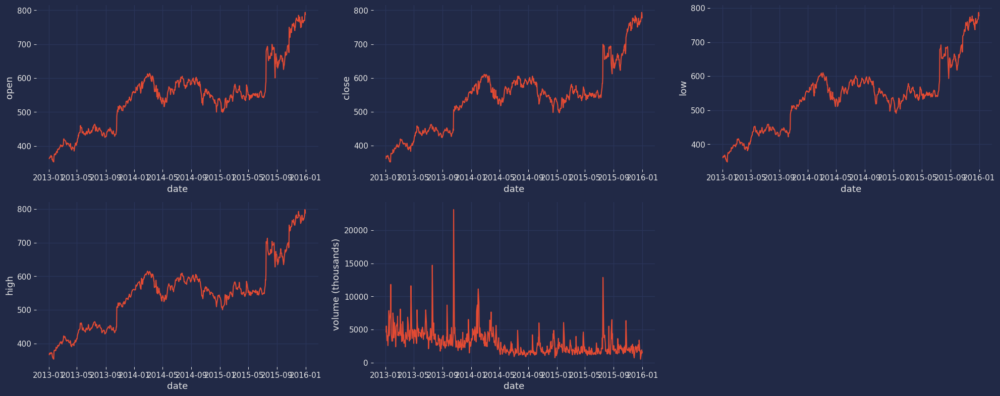

In [18]:
fig, axs = plt.subplots(2, 3, figsize=(20,8))
axs = axs.flatten()
sns.lineplot(prices_googl, y='open', x=prices_googl['date'], ax=axs[0])
sns.lineplot(prices_googl, y='close', x=prices_googl['date'], ax=axs[1])
sns.lineplot(prices_googl, y='low', x=prices_googl['date'], ax=axs[2])
sns.lineplot(prices_googl, y='high', x=prices_googl['date'], ax=axs[3])
sns.lineplot(prices_googl, y='volume (thousands)', x=prices_googl['date'], ax=axs[4])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### FDX Charts

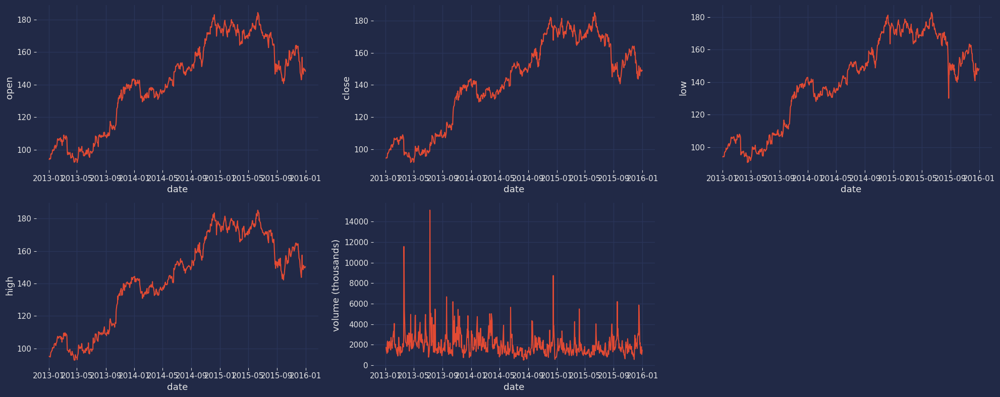

In [19]:
fig, axs = plt.subplots(2, 3, figsize=(20,8))
axs = axs.flatten()
sns.lineplot(prices_fdx, y='open', x=prices_fdx['date'], ax=axs[0])
sns.lineplot(prices_fdx, y='close', x=prices_fdx['date'], ax=axs[1])
sns.lineplot(prices_fdx, y='low', x=prices_fdx['date'], ax=axs[2])
sns.lineplot(prices_fdx, y='high', x=prices_fdx['date'], ax=axs[3])
sns.lineplot(prices_fdx, y='volume (thousands)', x=prices_fdx['date'], ax=axs[4])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### DD Charts

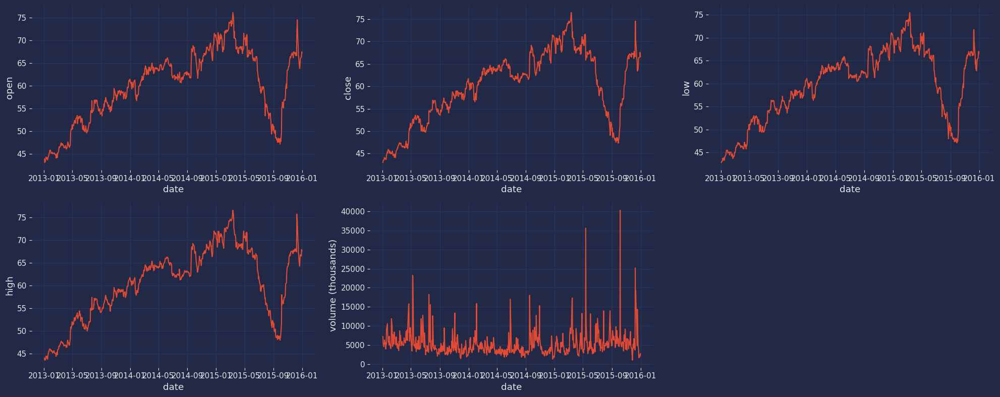

In [20]:
fig, axs = plt.subplots(2, 3, figsize=(20,8))
axs = axs.flatten()
sns.lineplot(prices_dd, y='open', x=prices_dd['date'], ax=axs[0])
sns.lineplot(prices_dd, y='close', x=prices_dd['date'], ax=axs[1])
sns.lineplot(prices_dd, y='low', x=prices_dd['date'], ax=axs[2])
sns.lineplot(prices_dd, y='high', x=prices_dd['date'], ax=axs[3])
sns.lineplot(prices_dd, y='volume (thousands)', x=prices_dd['date'], ax=axs[4])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### Overall table charts

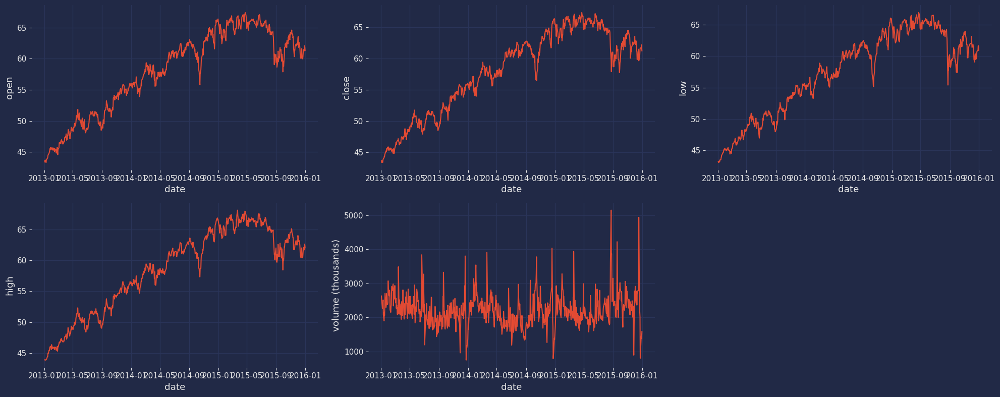

In [21]:
fig, axs = plt.subplots(2, 3, figsize=(20,8))
axs = axs.flatten()
sns.lineplot(pricesOG_v2, y='open', x=pricesOG_v2.index, ax=axs[0])
sns.lineplot(pricesOG_v2, y='close', x=pricesOG_v2.index, ax=axs[1])
sns.lineplot(pricesOG_v2, y='low', x=pricesOG_v2.index, ax=axs[2])
sns.lineplot(pricesOG_v2, y='high', x=pricesOG_v2.index, ax=axs[3])
sns.lineplot(pricesOG_v2, y='volume (thousands)', x=pricesOG_v2.index, ax=axs[4])
fig.delaxes(axs[-1])
plt.tight_layout()
plt.show()

### Testing stationary conversion methods for Overall dataframe
* Since open, close, low, and high share the same stochastic trend structure, open will represent them. Open is above plot and Volume is below plot.
* The open polynomial fit is an example of proper application. Volume isn't quadratic or higher and has no gain from this type of detrending.

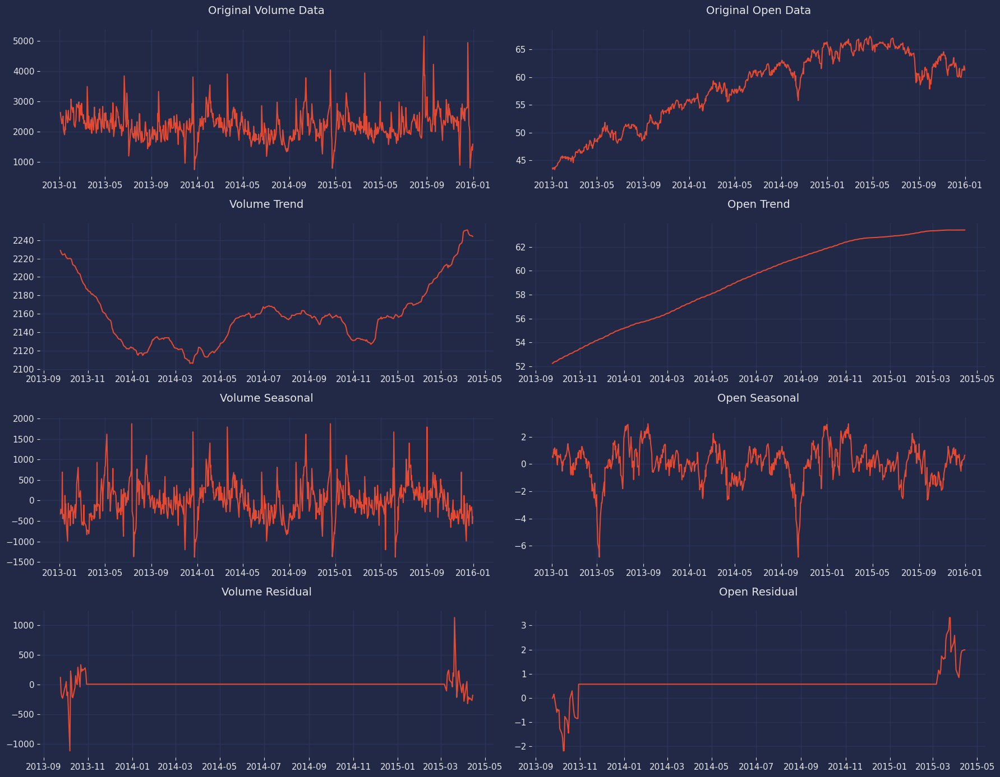

In [22]:
decomposed_volume = seasonal_decompose(pricesOG_v2["volume (thousands)"], model='additive', period=365)
decomposed_open = seasonal_decompose(pricesOG_v2["open"], model='additive', period=365)

fig, axs = plt.subplots(4, 2, figsize=(18, 14))

# Plot original data and decomposed components of 'volume (thousands)'
axs[0, 0].plot(decomposed_volume.observed)
axs[0, 0].set_title('Original Volume Data')
axs[1, 0].plot(decomposed_volume.trend)
axs[1, 0].set_title('Volume Trend')
axs[2, 0].plot(decomposed_volume.seasonal)
axs[2, 0].set_title('Volume Seasonal')
axs[3, 0].plot(decomposed_volume.resid)
axs[3, 0].set_title('Volume Residual')

# Plot original data and decomposed components of 'open'
axs[0, 1].plot(decomposed_open.observed)
axs[0, 1].set_title('Original Open Data')
axs[1, 1].plot(decomposed_open.trend)
axs[1, 1].set_title('Open Trend')
axs[2, 1].plot(decomposed_open.seasonal)
axs[2, 1].set_title('Open Seasonal')
axs[3, 1].plot(decomposed_open.resid)
axs[3, 1].set_title('Open Residual')

plt.tight_layout()
plt.show()

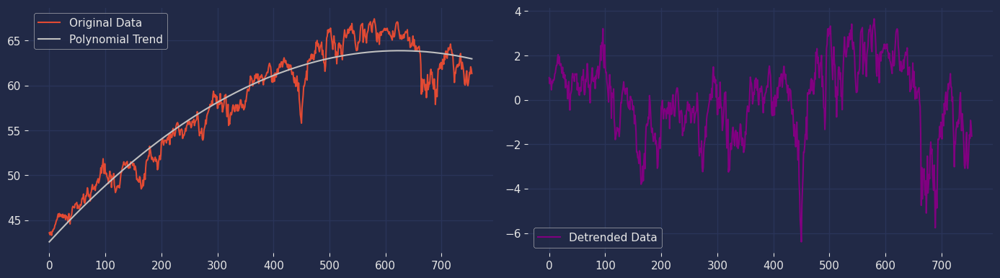

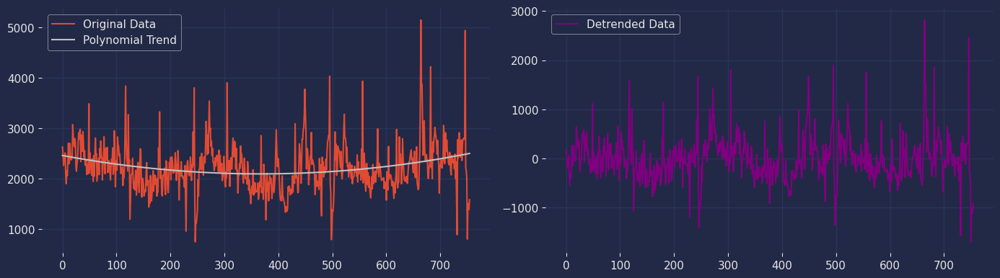

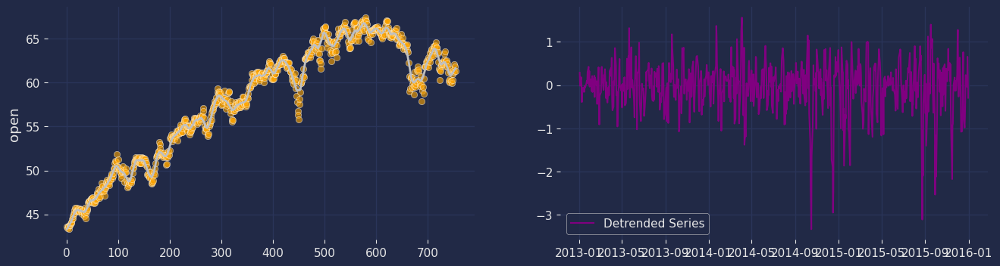

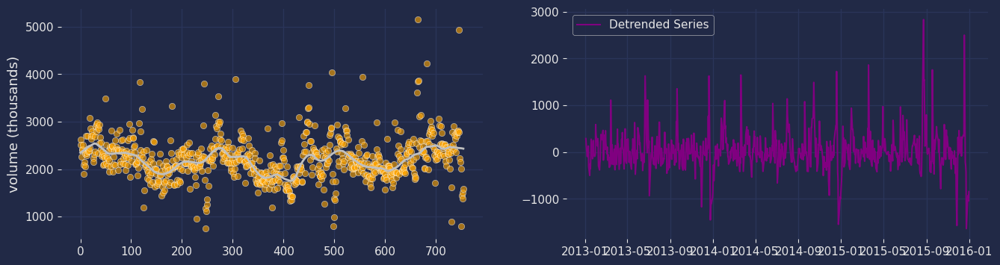

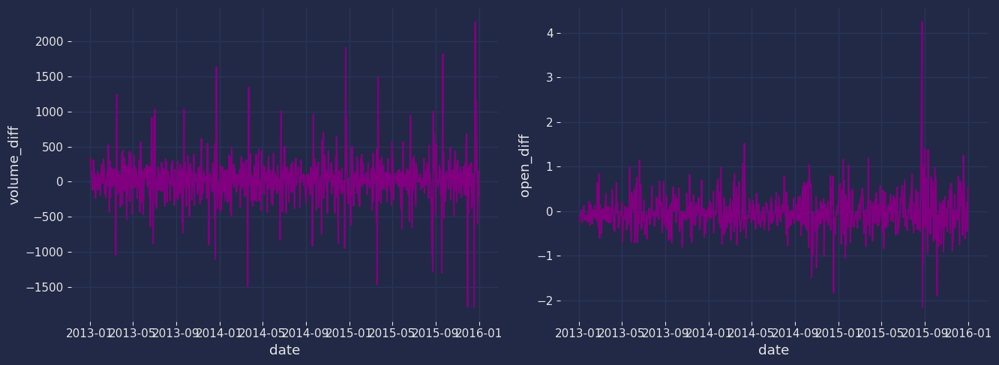

In [485]:
x_open = range(len(pricesOG_v2.index))
y_open = pricesOG_v2['open']
coefficients = np.polyfit(x_open, y_open, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x_open)

# Detrend the data by subtracting the trend component
detrended_fit_open = y_open - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x_open, y_open, label='Original Data')
ax[0].plot(x_open, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x_open, detrended_fit_open, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

x_vol = range(len(pricesOG_v2.index))
y_vol = pricesOG_v2['volume (thousands)']
coefficients = np.polyfit(x_vol, y_vol, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x_vol)

# Detrend the data by subtracting the trend component
detrended_fit_vol = y_vol - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x_vol, y_vol, label='Original Data')
ax[0].plot(x_vol, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x_vol, detrended_fit_vol, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_open, x_open, frac=0.025)
z = pd.DataFrame({'date': x_open, 'smoothed': smoothed[:,1]})

detrended_lowess_open = y_open - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x_open, y='open', data=pricesOG_v2, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_open, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_vol, x_vol, frac=0.075)
z = pd.DataFrame({'date': x_vol, 'smoothed': smoothed[:,1]})

detrended_lowess_vol = y_vol - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x_vol, y='volume (thousands)', data=pricesOG_v2, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_vol, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# difference plots
fig, axs = plt.subplots(1, 2, figsize=(13.5,5))
sns.lineplot(x=prices_v2.index, y=prices_v2['volume_diff'], color='purple', ax=axs[0])
sns.lineplot(x=prices_v2.index, y=prices_v2['open_diff'], color='purple', ax=axs[1])
plt.tight_layout()
plt.show()

### When comparing the detrending results, Lowess performed superior to others

In [24]:
print('Original variance:  ', pricesOG_v2['open'].var())
print('Polynomial variance:  ', detrended_fit_open.var())
print('Lowess variance:  ', detrended_lowess_open.var())
print('Difference variance:  ', prices_v2['open_diff'].var())

Original variance:   43.06755564328217
Polynomial variance:   3.008043516475366
Lowess variance:   0.8658435201819475
Difference variance:   0.18557935720816954


In [25]:
print('Original variance:  ', pricesOG_v2['volume (thousands)'].var())
print('Polynomial variance:  ', detrended_fit_vol.var())
print('Lowess variance:  ', detrended_lowess_vol.var())
print('Difference variance:  ', prices_v2['volume_diff'].var())

Original variance:   217503.0699682752
Polynomial variance:   204075.63556984684
Lowess variance:   188010.30784747755
Difference variance:   120134.29922433993


In [26]:
# Creating difference sub-tables
prices_googl_diff = prices.loc[prices.symbol=='GOOGL', 'date':]
prices_fdx_diff = prices.loc[prices.symbol=='FDX', 'date':]
prices_dd_diff = prices.loc[prices.symbol=='DD', 'date':]

diff_samples = [prices_googl_diff, prices_fdx_diff, prices_dd_diff]

for sample in diff_samples:
    print(sample.shape)
    print(sample.columns, '\n')

(755, 6)
Index(['date', 'close_diff', 'open_diff', 'low_diff', 'high_diff',
       'volume_diff'],
      dtype='object') 

(755, 6)
Index(['date', 'close_diff', 'open_diff', 'low_diff', 'high_diff',
       'volume_diff'],
      dtype='object') 

(755, 6)
Index(['date', 'close_diff', 'open_diff', 'low_diff', 'high_diff',
       'volume_diff'],
      dtype='object') 



### Testing stationary conversion methods for Googl dataframe
* Since open, close, low, and high share the same structure, open will represent them. Open is above plot and Volume is below plot.

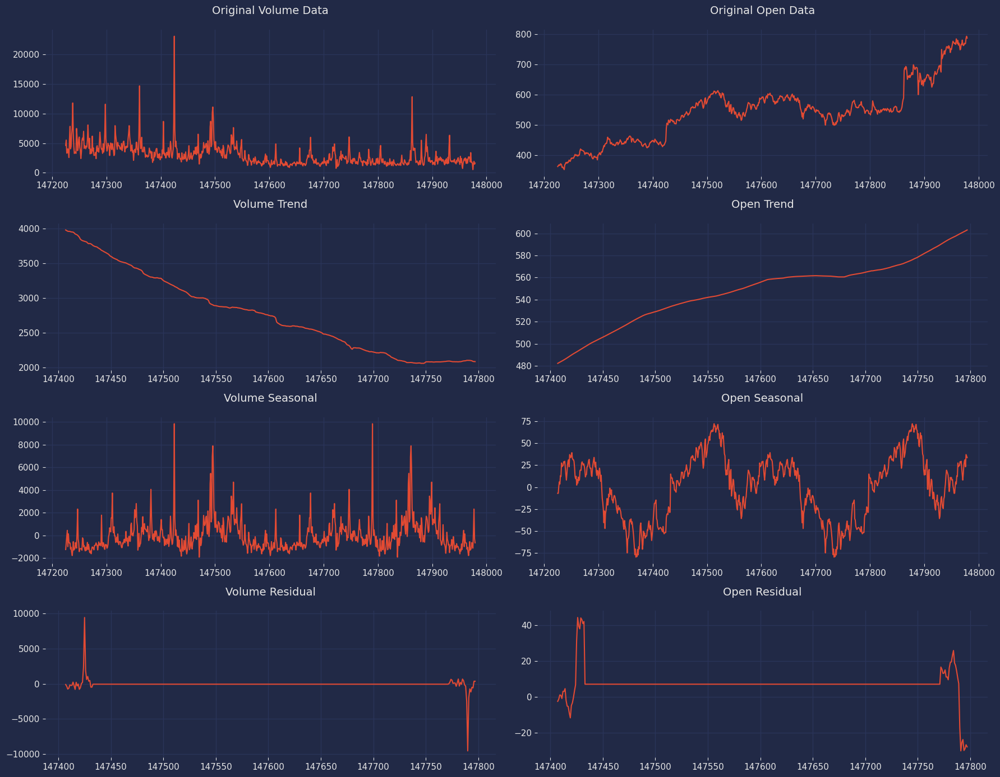

In [27]:
decomposed_volume = seasonal_decompose(prices_googl["volume (thousands)"], model='additive', period=365)
decomposed_open = seasonal_decompose(prices_googl["open"], model='additive', period=365)

fig, axs = plt.subplots(4, 2, figsize=(18, 14))

# Plot original data and decomposed components of 'volume (thousands)'
axs[0, 0].plot(decomposed_volume.observed)
axs[0, 0].set_title('Original Volume Data')
axs[1, 0].plot(decomposed_volume.trend)
axs[1, 0].set_title('Volume Trend')
axs[2, 0].plot(decomposed_volume.seasonal)
axs[2, 0].set_title('Volume Seasonal')
axs[3, 0].plot(decomposed_volume.resid)
axs[3, 0].set_title('Volume Residual')

# Plot original data and decomposed components of 'open'
axs[0, 1].plot(decomposed_open.observed)
axs[0, 1].set_title('Original Open Data')
axs[1, 1].plot(decomposed_open.trend)
axs[1, 1].set_title('Open Trend')
axs[2, 1].plot(decomposed_open.seasonal)
axs[2, 1].set_title('Open Seasonal')
axs[3, 1].plot(decomposed_open.resid)
axs[3, 1].set_title('Open Residual')

plt.tight_layout()
plt.show()

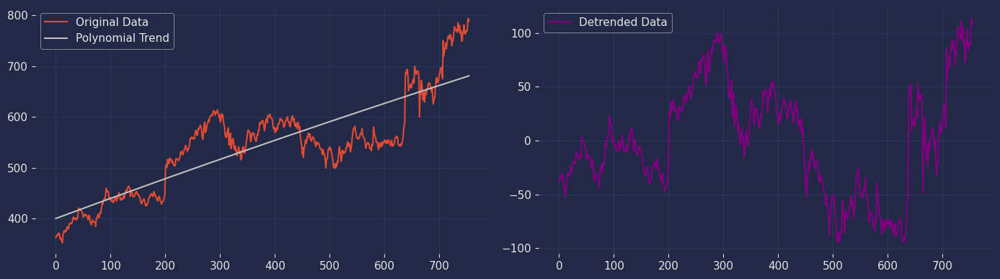

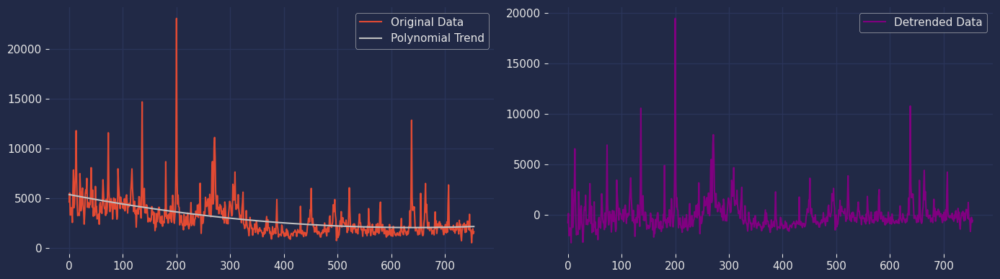

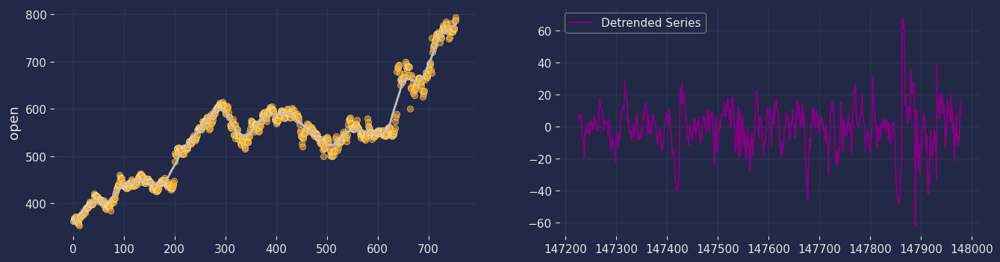

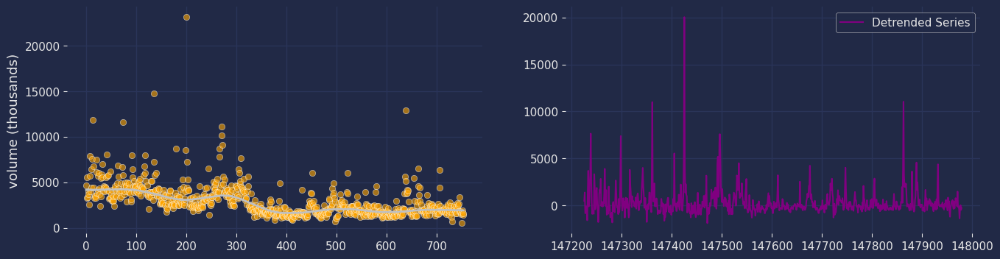

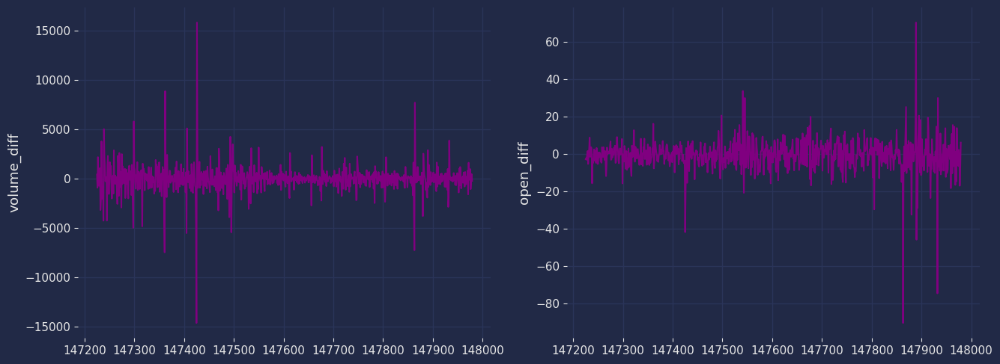

In [388]:
x = range(len(prices_googl['date']))
y_open = prices_googl['open']
coefficients = np.polyfit(x, y_open, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_open = y_open - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_open, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_open, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

y_vol = prices_googl['volume (thousands)']
coefficients = np.polyfit(x, y_vol, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_vol = y_vol - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_vol, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_vol, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothedGCLS = lowess(y_open, x, frac=0.075)
z = pd.DataFrame({'date': x, 'smoothed': smoothedGCLS[:,1]})

detrended_lowess_open = y_open - smoothedGCLS[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='open', data=prices_googl, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_open, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothedGVOL = lowess(y_vol, x, frac=.2)
z = pd.DataFrame({'date': x, 'smoothed': smoothedGVOL[:,1]})

detrended_lowess_vol = y_vol - smoothedGVOL[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='volume (thousands)', data=prices_googl, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_vol, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Difference plots
fig, axs = plt.subplots(1, 2, figsize=(13.5,5))
sns.lineplot(x=prices_googl_diff.index, y=prices_googl_diff['volume_diff'], color='purple', ax=axs[0])
sns.lineplot(x=prices_googl_diff.index, y=prices_googl_diff['open_diff'], color='purple', ax=axs[1])
plt.tight_layout()
plt.show()

### When comparing the detrending results, Lowess performed superior to others

In [29]:
print('Original variance:  ', prices_googl['open'].var())
print('Polynomial variance:  ', detrended_fit_open.var())
print('Lowess variance:  ', detrended_lowess_open.var())
print('Difference variance:  ', prices_googl_diff['open_diff'].var())

Original variance:   9110.567853381039
Polynomial variance:   2528.8855669626837
Lowess variance:   99.04907946598115
Difference variance:   78.94364996176827


In [30]:
print('Original variance:  ', prices_googl['volume (thousands)'].var())
print('Polynomial variance:  ', detrended_fit_vol.var())
print('Lowess variance:  ', detrended_lowess_vol.var())
print('Difference variance:  ', prices_googl_diff['volume_diff'].var())

Original variance:   3398566.932057969
Polynomial variance:   2413613.509006211
Lowess variance:   2220698.872997674
Difference variance:   2269446.63780554


### Testing stationary conversion methods for FDX dataframe
* Since open, close, low, and high share the same structure, open will represent them. Open is above plot and Volume is below plot.

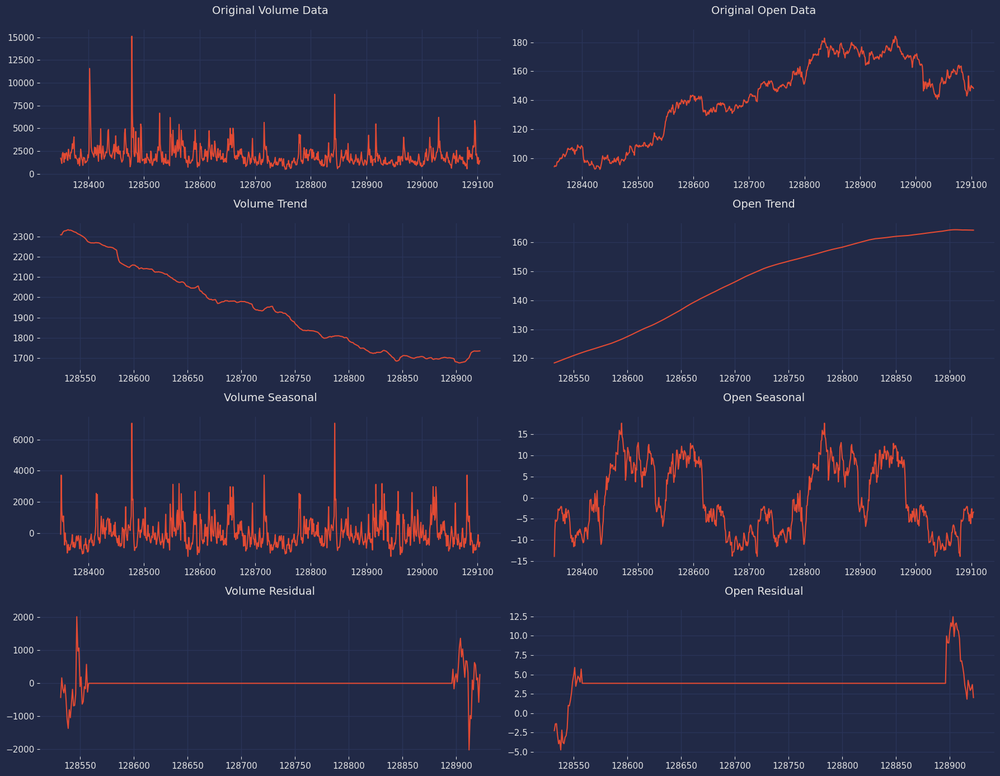

In [31]:
decomposed_volume = seasonal_decompose(prices_fdx["volume (thousands)"], model='additive', period=365)
decomposed_open = seasonal_decompose(prices_fdx["open"], model='additive', period=365)

fig, axs = plt.subplots(4, 2, figsize=(18, 14))

# Plot original data and decomposed components of 'volume (thousands)'
axs[0, 0].plot(decomposed_volume.observed)
axs[0, 0].set_title('Original Volume Data')
axs[1, 0].plot(decomposed_volume.trend)
axs[1, 0].set_title('Volume Trend')
axs[2, 0].plot(decomposed_volume.seasonal)
axs[2, 0].set_title('Volume Seasonal')
axs[3, 0].plot(decomposed_volume.resid)
axs[3, 0].set_title('Volume Residual')

# Plot original data and decomposed components of 'open'
axs[0, 1].plot(decomposed_open.observed)
axs[0, 1].set_title('Original Open Data')
axs[1, 1].plot(decomposed_open.trend)
axs[1, 1].set_title('Open Trend')
axs[2, 1].plot(decomposed_open.seasonal)
axs[2, 1].set_title('Open Seasonal')
axs[3, 1].plot(decomposed_open.resid)
axs[3, 1].set_title('Open Residual')

plt.tight_layout()
plt.show()

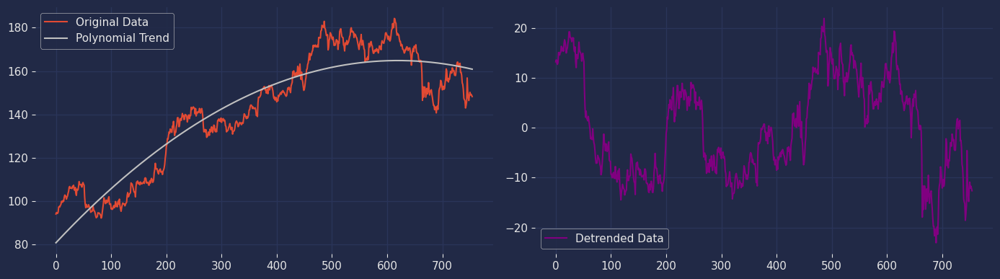

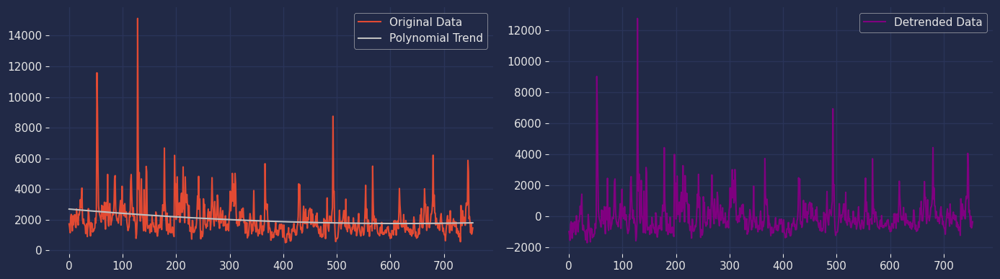

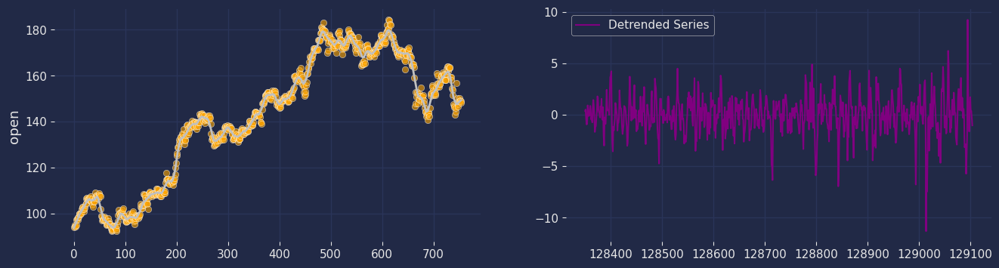

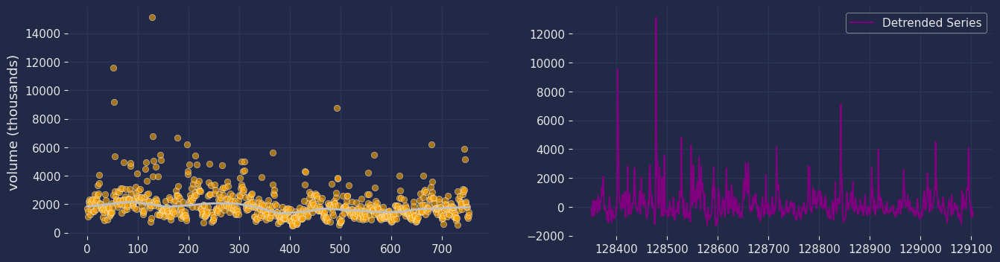

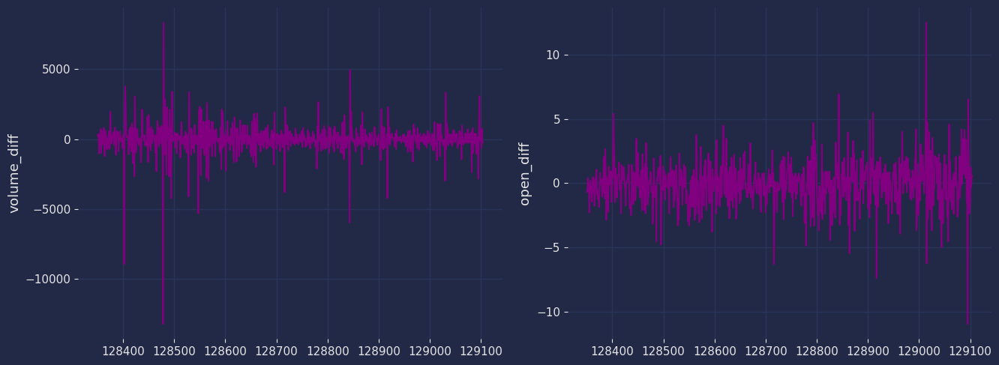

In [32]:
y_open = prices_fdx['open']
coefficients = np.polyfit(x, y_open, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_open = y_open - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_open, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_open, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

y_vol = prices_fdx['volume (thousands)']
coefficients = np.polyfit(x, y_vol, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_vol = y_vol - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_vol, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_vol, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_open, x, frac=0.025)
z = pd.DataFrame({'date': x, 'smoothed': smoothed[:,1]})

detrended_lowess_open = y_open - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='open', data=prices_fdx, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_open, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_vol, x, frac=0.2)
z = pd.DataFrame({'date': x, 'smoothed': smoothed[:,1]})

detrended_lowess_vol = y_vol - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='volume (thousands)', data=prices_fdx, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_vol, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Difference plots
fig, axs = plt.subplots(1, 2, figsize=(13.5,5))
sns.lineplot(x=prices_fdx_diff.index, y=prices_fdx_diff['volume_diff'], color='purple', ax=axs[0])
sns.lineplot(x=prices_fdx_diff.index, y=prices_fdx_diff['open_diff'], color='purple', ax=axs[1])
plt.tight_layout()
plt.show()

### When comparing the detrending results, Lowess performed superior to others

In [33]:
print('Original variance:  ', prices_fdx['open'].var())
print('Polynomial variance:  ', detrended_fit_open.var())
print('Lowess variance:  ', detrended_lowess_open.var())
print('Difference variance:  ', prices_fdx_diff['open_diff'].var())

Original variance:   719.3929566067769
Polynomial variance:   96.78384940782966
Lowess variance:   3.377067183437755
Difference variance:   3.267162145973341


In [34]:
print('Original variance:  ', prices_fdx['volume (thousands)'].var())
print('Polynomial variance:  ', detrended_fit_vol.var())
print('Lowess variance:  ', detrended_lowess_vol.var())
print('Difference variance:  ', prices_fdx_diff['volume_diff'].var())

Original variance:   1386024.5579436119
Polynomial variance:   1307946.5020125797
Lowess variance:   1272640.1893570598
Difference variance:   1311614.4781297802


### Testing stationary conversion methods for DD dataframe
* Since open, close, low, and high share the same structure, open will represent them. Open is above plot and Volume is below plot.

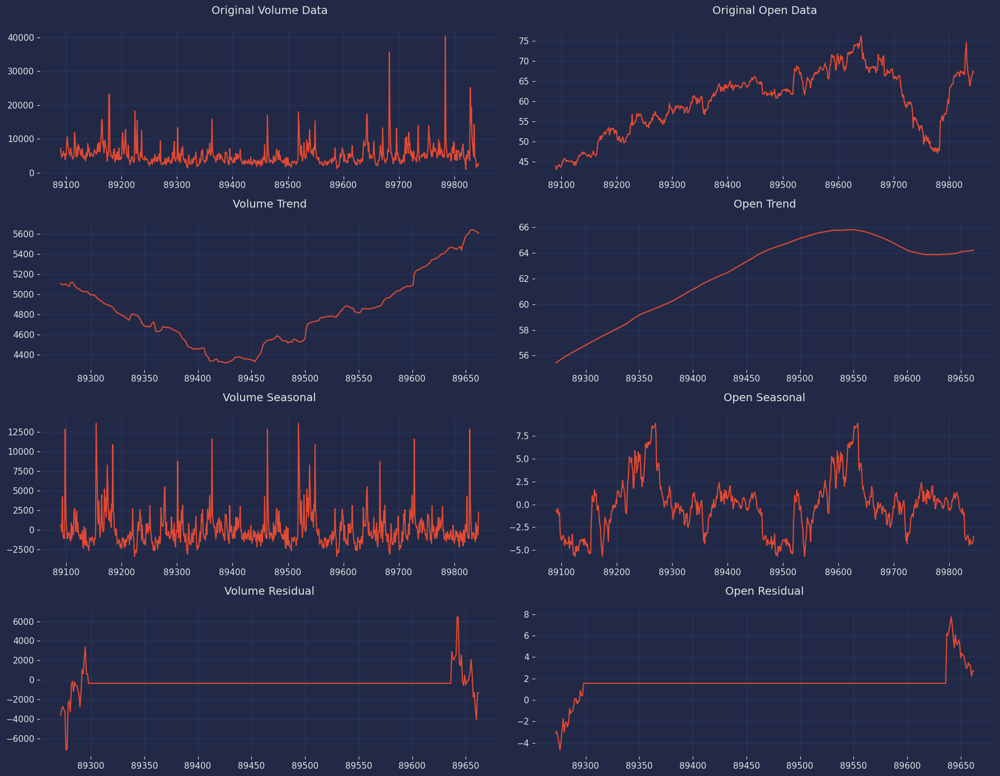

In [35]:
decomposed_volume = seasonal_decompose(prices_dd["volume (thousands)"], model='additive', period=365)
decomposed_open = seasonal_decompose(prices_dd["open"], model='additive', period=365)

fig, axs = plt.subplots(4, 2, figsize=(18, 14))

# Plot original data and decomposed components of 'volume (thousands)'
axs[0, 0].plot(decomposed_volume.observed)
axs[0, 0].set_title('Original Volume Data')
axs[1, 0].plot(decomposed_volume.trend)
axs[1, 0].set_title('Volume Trend')
axs[2, 0].plot(decomposed_volume.seasonal)
axs[2, 0].set_title('Volume Seasonal')
axs[3, 0].plot(decomposed_volume.resid)
axs[3, 0].set_title('Volume Residual')

# Plot original data and decomposed components of 'open'
axs[0, 1].plot(decomposed_open.observed)
axs[0, 1].set_title('Original Open Data')
axs[1, 1].plot(decomposed_open.trend)
axs[1, 1].set_title('Open Trend')
axs[2, 1].plot(decomposed_open.seasonal)
axs[2, 1].set_title('Open Seasonal')
axs[3, 1].plot(decomposed_open.resid)
axs[3, 1].set_title('Open Residual')

plt.tight_layout()
plt.show()

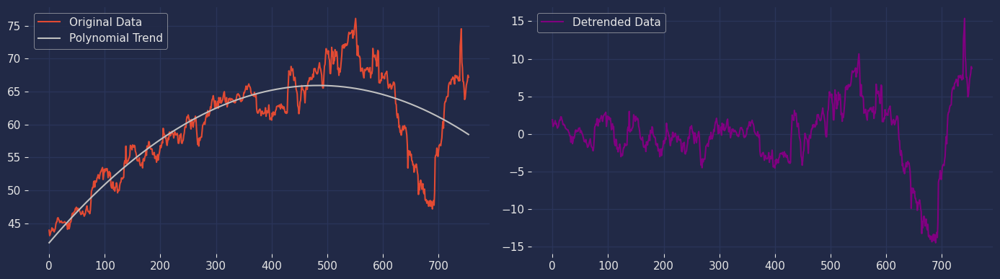

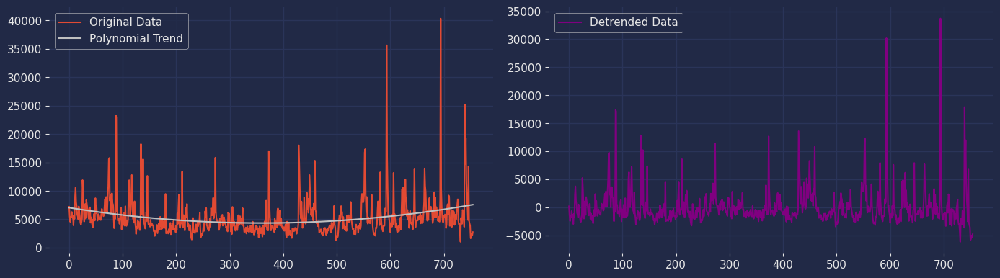

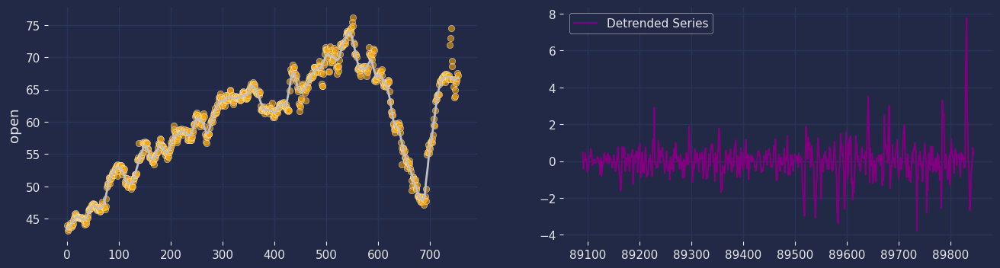

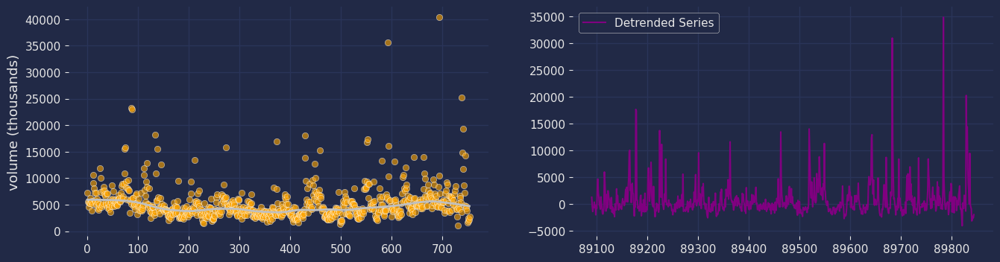

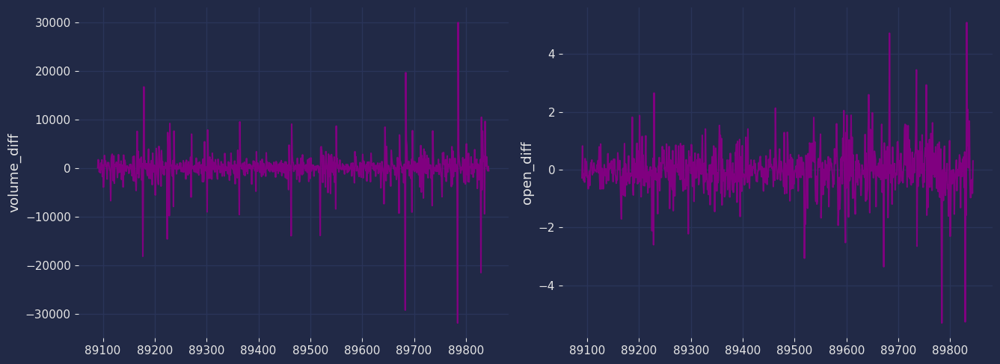

In [36]:
y_open = prices_dd['open']
coefficients = np.polyfit(x, y_open, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_open = y_open - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_open, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_open, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

y_vol = prices_dd['volume (thousands)']
coefficients = np.polyfit(x, y_vol, 2)

# Evaluate the polynomial to get the trend line
trend = np.polyval(coefficients, x)

# Detrend the data by subtracting the trend component
detrended_fit_vol = y_vol - trend

# Step 5: Visualize the original data, trend, and detrended data
fig, ax = plt.subplots(1, 2, figsize=(14,4))
ax[0].plot(x, y_vol, label='Original Data')
ax[0].plot(x, trend, label='Polynomial Trend', color='silver')
ax[1].plot(x, detrended_fit_vol, label='Detrended Data', color='purple')
ax[0].legend()
ax[1].legend()
plt.tight_layout()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_open, x, frac=0.025)
z = pd.DataFrame({'date': x, 'smoothed': smoothed[:,1]})

detrended_lowess_open = y_open - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='open', data=prices_dd, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_open, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Use statsmodels' LOWESS to get the smoothed curve with a specific frac value
smoothed = lowess(y_vol, x, frac=0.2)
z = pd.DataFrame({'date': x, 'smoothed': smoothed[:,1]})

detrended_lowess_vol = y_vol - smoothed[:,1]

fig, ax = plt.subplots(1, 2, figsize=(16,4))
sns.scatterplot(x=x, y='volume (thousands)', data=prices_dd, alpha=0.6, ax=ax[0], color='orange')
ax[0].plot(z['date'], z['smoothed'], color='silver', lw=2)
ax[1].plot(detrended_lowess_vol, label='Detrended Series', color='purple')
ax[1].legend()
plt.show()

# Difference plots
fig, axs = plt.subplots(1, 2, figsize=(13.5,5))
sns.lineplot(x=prices_dd_diff.index, y=prices_dd_diff['volume_diff'], color='purple', ax=axs[0])
sns.lineplot(x=prices_dd_diff.index, y=prices_dd_diff['open_diff'], color='purple', ax=axs[1])
plt.tight_layout()
plt.show()

### When comparing the detrending results, Lowess performed superior to others

In [37]:
print('Original variance:  ', prices_dd['open'].var())
print('Polynomial variance:  ', detrended_fit_open.var())
print('Lowess variance:  ', detrended_lowess_open.var())
print('Difference variance:  ', prices_dd_diff['open_diff'].var())

Original variance:   60.483498644301456
Polynomial variance:   18.95807051586739
Lowess variance:   0.820927203842118
Difference variance:   0.6666700742141101


In [38]:
print('Original variance:  ', prices_dd['volume (thousands)'].var())
print('Polynomial variance:  ', detrended_fit_vol.var())
print('Lowess variance:  ', detrended_lowess_vol.var())
print('Difference variance:  ', prices_dd_diff['volume_diff'].var())

Original variance:   11135524.651670314
Polynomial variance:   10328426.870213203
Lowess variance:   10221276.602706272
Difference variance:   11745186.700110387


### Creating test samples with the methods deemed most effective

In [959]:
overall_vol_sample = prices_v2[['volume_diff']].copy()
overall_avg_sample = pricesOG_v2.copy()

for count, col in enumerate(pricesOG_v2.columns):
    if count > 3:
        smoothed = lowess(pricesOG_v2[col], x, frac=0.015)
        detrended_lowess_open = pricesOG_v2[col] - smoothed[:,1]
        overall_avg_sample[col] = detrended_lowess_open 
    else:
        smoothed = lowess(pricesOG_v2[col], x, frac=0.5)
        detrended_lowess_open = pricesOG_v2[col] - smoothed[:,1]
        overall_avg_sample[col] = detrended_lowess_open 
        
overall_avg_sample.head(2)

,open,close,low,high,volume (thousands)
date,,,,,
2013-01-03,-0.902,-1.171,-0.967,-1.005,56.671
2013-01-04,-1.152,-0.924,-1.160,-1.048,-9.429


In [40]:
prices_googl

,date,open,close,low,high,volume (thousands)
147225,2013-01-03,362.828,362.197,360.721,366.331,4631.7
147226,2013-01-04,365.035,369.354,364.204,371.106,5521.4
147227,2013-01-07,368.093,367.743,365.656,370.060,3308.0
147228,2013-01-08,368.138,367.017,362.578,368.519,3348.8
147229,2013-01-09,366.502,369.429,364.665,369.545,4045.3
...,...,...,...,...,...,...
147975,2015-12-24,768.520,765.840,764.390,769.200,520.6
147976,2015-12-28,770.000,782.240,767.730,782.820,1557.8
147977,2015-12-29,786.990,793.960,786.200,798.690,1921.5
147978,2015-12-30,793.960,790.300,787.200,796.460,1428.3


In [41]:
sample_googl = prices_googl.copy()

for count, col in enumerate(prices_googl.columns):
    if count > 0:
        smoothed = lowess(prices_googl[col], x, frac=0.025)
        detrended_lowess_open = prices_googl[col] - smoothed[:,1]
        sample_googl[col] = detrended_lowess_open
    if count > 4:
        smoothed = lowess(prices_googl[col], x, frac=0.2)
        detrended_lowess_open = prices_googl[col] - smoothed[:,1]
        sample_googl[col] = detrended_lowess_open      

sample_fdx = prices_fdx.copy()

for count, col in enumerate(prices_fdx.columns):
    if count > 0:
        smoothed = lowess(prices_fdx[col], x, frac=0.025)
        detrended_lowess_open = prices_fdx[col] - smoothed[:,1]
        sample_fdx[col] = detrended_lowess_open
    if count > 4:
        smoothed = lowess(prices_fdx[col], x, frac=0.2)
        detrended_lowess_open = prices_fdx[col] - smoothed[:,1]
        sample_fdx[col] = detrended_lowess_open      


sample_dd = prices_dd.copy()

for count, col in enumerate(prices_dd.columns):
    if count > 0:
        smoothed = lowess(prices_dd[col], x, frac=0.025)
        detrended_lowess_open = prices_dd[col] - smoothed[:,1]
        sample_dd[col] = detrended_lowess_open
    if count > 4:
        smoothed = lowess(prices_dd[col], x, frac=0.2)
        detrended_lowess_open = prices_dd[col] - smoothed[:,1]
        sample_dd[col] = detrended_lowess_open      


sample_dd.head(2)

,date,open,close,low,high,volume (thousands)
89090,2013-01-03,0.478,-0.222,-0.055,0.378,1271.739
89091,2013-01-04,-0.416,0.084,0.053,-0.168,-422.133


In [42]:
prices_dd.head(2)

,date,open,close,low,high,volume (thousands)
89090,2013-01-03,43.922,43.010,42.840,43.970,7213.4
89091,2013-01-04,43.105,43.428,43.058,43.514,5519.8


In [43]:
sample_googl.describe()

,date,open,close,low,high,volume (thousands)
count,755,755.000,755.000,755.000,755.000,755.000
mean,2014-07-03 13:49:40.132450304,0.120,-0.069,-0.218,0.231,338.379
min,2013-01-03 00:00:00,-70.920,-56.250,-69.021,-50.265,-1907.772
25%,2013-10-02 12:00:00,-4.678,-4.470,-4.183,-3.922,-392.052
50%,2014-07-03 00:00:00,0.429,0.079,0.071,0.233,-18.858
75%,2015-04-04 00:00:00,4.009,4.166,4.022,3.758,577.089
max,2015-12-31 00:00:00,81.517,92.862,79.485,92.443,20033.094
std,NaN,9.952,9.962,9.754,9.834,1490.201


In [44]:
sample_fdx.describe()

,date,open,close,low,high,volume (thousands)
count,755,755.000,755.000,755.000,755.000,755.000
mean,2014-07-03 13:49:40.132450304,-0.033,-0.044,-0.073,0.026,247.702
min,2013-01-03 00:00:00,-11.335,-11.263,-26.157,-7.876,-1310.983
25%,2013-10-02 12:00:00,-1.073,-1.084,-1.042,-0.933,-356.266
50%,2014-07-03 00:00:00,0.005,0.043,-0.042,0.021,11.668
75%,2015-04-04 00:00:00,0.954,1.102,1.054,0.937,514.955
max,2015-12-31 00:00:00,9.215,6.759,5.437,8.008,13143.440
std,NaN,1.838,1.864,2.056,1.800,1128.114


In [45]:
sample_dd.describe()

,date,open,close,low,high,volume (thousands)
count,755,755.000,755.000,755.000,755.000,755.000
mean,2014-07-03 13:49:40.132450304,0.013,-0.010,-0.022,0.013,765.981
min,2013-01-03 00:00:00,-3.792,-3.989,-3.861,-3.143,-4048.086
25%,2013-10-02 12:00:00,-0.417,-0.405,-0.378,-0.337,-862.933
50%,2014-07-03 00:00:00,0.044,0.015,0.032,0.015,-12.111
75%,2015-04-04 00:00:00,0.368,0.400,0.359,0.337,1351.366
max,2015-12-31 00:00:00,7.785,7.806,5.607,7.911,34823.507
std,NaN,0.906,0.905,0.867,0.904,3197.073


### Truncating outliers in volume to stabilize variance

In [46]:
sample_googl = sample_googl[sample_googl['volume (thousands)']<577.089]
sample_fdx = sample_fdx[sample_fdx['volume (thousands)']<514.955]
sample_dd = sample_dd[(sample_dd['volume (thousands)']<150.459)&(sample_dd['volume (thousands)']>-1500)]

### Validating Stationary Significance of Company Samples

In [47]:
test_samples = [sample_googl, sample_fdx, sample_dd]
for c, df in enumerate(test_samples):
    for col in df:
         output = check_stationarity(test=df[col], df=names[c], col=col)

DF: prices_googl  |  COL: date
ADF Statistic: 8.687424
p-value: 1.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Non-stationary 

DF: prices_googl  |  COL: open
ADF Statistic: -14.089846
p-value: 0.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Stationary 

DF: prices_googl  |  COL: close
ADF Statistic: -12.591708
p-value: 0.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Stationary 

DF: prices_googl  |  COL: low
ADF Statistic: -5.448266
p-value: 0.000003
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Stationary 

DF: prices_googl  |  COL: high
ADF Statistic: -12.979100
p-value: 0.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Stationary 

DF: prices_googl  |  COL: volume (thousands)
ADF Statistic: -13.410480
p-value: 0.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Stationary 

DF: prices_fdx  |  COL: date
ADF Statistic: 11.111870
p-value: 1.000000
Critical Values:
	1%: -3.442
	5%: -2.867
	10%: -2.570
Non-sta

### Complementary KPSS Test

In [48]:
for c, df in enumerate(test_samples):
    for col in df:
         output = check_stationarityII(test=df[col], df=names[c], col=col)

DF: prices_googl  |  COL: date
KPSS Statistic: 3.422755
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_googl  |  COL: open
KPSS Statistic: 0.141273
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_googl  |  COL: close
KPSS Statistic: 0.348190
p-value: 0.099487
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_googl  |  COL: low
KPSS Statistic: 0.231886
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_googl  |  COL: high
KPSS Statistic: 0.186140
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_googl  |  COL: volume (thousands)
KPSS Statistic: 1.196292
p-value: 0.010000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: prices_fdx  |  COL: date
KPSS Statistic: 3.426552
p-value: 0.010000
Critical

C:\Users\tekre\AppData\Local\Temp\ipykernel_12916\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12916\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12916\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12916\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. T

### Validating Stationary Significance of Overall Samples

In [417]:
for col in overall_avg_sample.columns:
    output = check_stationarity(test=overall_avg_sample[col], df='overall_avg_sample', col=col)

DF: overall_avg_sample  |  COL: open
ADF Statistic: -4.916974
p-value: 0.000032
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 

DF: overall_avg_sample  |  COL: close
ADF Statistic: -5.488985
p-value: 0.000002
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 

DF: overall_avg_sample  |  COL: low
ADF Statistic: -5.494545
p-value: 0.000002
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 

DF: overall_avg_sample  |  COL: high
ADF Statistic: -5.009303
p-value: 0.000021
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 

DF: overall_avg_sample  |  COL: volume (thousands)
ADF Statistic: -9.090927
p-value: 0.000000
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 



### Complemetary KPSS Test


In [418]:
for col in overall_avg_sample.columns:
    output = check_stationarityII(test=overall_avg_sample[col], df='overall_avg_sample', col=col)

DF: overall_avg_sample  |  COL: open
KPSS Statistic: 0.103789
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: overall_avg_sample  |  COL: close
KPSS Statistic: 0.104726
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: overall_avg_sample  |  COL: low
KPSS Statistic: 0.105635
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: overall_avg_sample  |  COL: high
KPSS Statistic: 0.110857
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 

DF: overall_avg_sample  |  COL: volume (thousands)
KPSS Statistic: 0.081677
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 



C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)
C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. T

In [419]:
check_stationarity(test=overall_avg_sample['volume (thousands)'], df='overall_vol_sample', col='vol')

DF: overall_vol_sample  |  COL: vol
ADF Statistic: -9.090927
p-value: 0.000000
Critical Values:
	1%: -3.439
	5%: -2.865
	10%: -2.569
Stationary 



### Complemetary KPSS Test

In [420]:
check_stationarityII(test=overall_avg_sample['volume (thousands)'], df='overall_vol_sample', col='vol')

DF: overall_vol_sample  |  COL: vol
KPSS Statistic: 0.081677
p-value: 0.100000
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Stationary 



C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4072267356.py:85: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(kwargs['test'].values)


## Modelling Googl's Time-Series
Close represents the other 4 features from their similarity. Google is focused on due to it's abnormal similarity with FDX and DD.

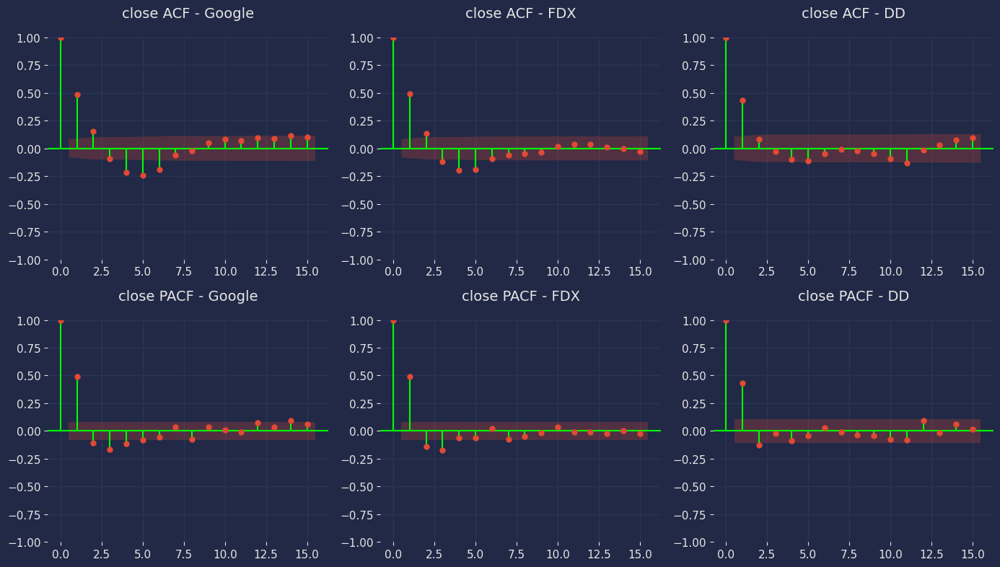

In [53]:
fig, ax = plt.subplots(2, 3, figsize=(14,8))

plot_acf(sample_googl['close'],lags=15, ax=ax[0,0])
plot_pacf(sample_googl['close'],lags=15, ax=ax[1,0], method='ldadjusted')
ax[0,0].set_title('close ACF - Google')
ax[1,0].set_title('close PACF - Google')

plot_acf(sample_fdx['close'],lags=15, ax=ax[0,1])
plot_pacf(sample_fdx['close'],lags=15, ax=ax[1,1], method='ldadjusted')
ax[0,1].set_title('close ACF - FDX')
ax[1,1].set_title('close PACF - FDX')

plot_acf(sample_dd['close'],lags=15, ax=ax[0,2])
plot_pacf(sample_dd['close'],lags=15, ax=ax[1,2], method='ldadjusted')
ax[0,2].set_title('close ACF - DD')
ax[1,2].set_title('close PACF - DD')

plt.tight_layout()
plt.show()

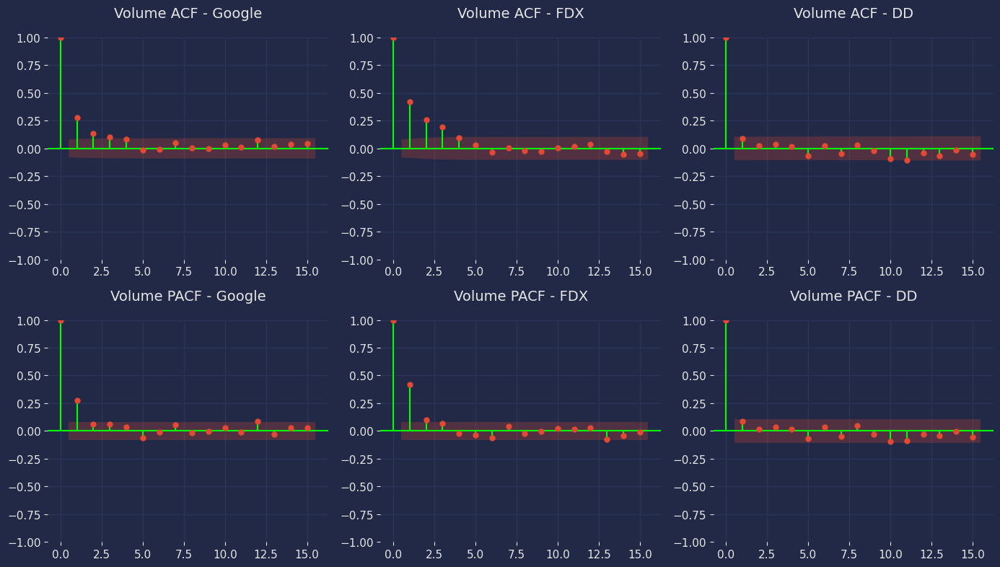

In [54]:
fig, ax = plt.subplots(2, 3, figsize=(14,8))

plot_acf(sample_googl['volume (thousands)'],lags=15, ax=ax[0,0])
plot_pacf(sample_googl['volume (thousands)'],lags=15, ax=ax[1,0], method='ldadjusted')
ax[0,0].set_title('Volume ACF - Google')
ax[1,0].set_title('Volume PACF - Google')

plot_acf(sample_fdx['volume (thousands)'],lags=15, ax=ax[0,1])
plot_pacf(sample_fdx['volume (thousands)'],lags=15, ax=ax[1,1], method='ldadjusted')
ax[0,1].set_title('Volume ACF - FDX')
ax[1,1].set_title('Volume PACF - FDX')

plot_acf(sample_dd['volume (thousands)'],lags=15, ax=ax[0,2])
plot_pacf(sample_dd['volume (thousands)'],lags=15, ax=ax[1,2], method='ldadjusted')
ax[0,2].set_title('Volume ACF - DD')
ax[1,2].set_title('Volume PACF - DD')

plt.tight_layout()
plt.show()

In [55]:
googl_scaled_vol, RS_googl_vol = RSstandardize(sample_googl[['volume (thousands)']])
googl_scaled_close, RS_googl_close = RSstandardize(sample_googl[['close']])

In [56]:
ar_model = ARIMA(googl_scaled_vol, order=(1, 0, 0), trend='c').fit()
pred = ar_model.predict(start=454, end=566)
forecast = ar_model.get_forecast(steps=153, fitted=True)
print(ar_model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  566
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -609.168
Date:                Sun, 14 Apr 2024   AIC                           1224.337
Time:                        16:29:17   BIC                           1237.352
Sample:                             0   HQIC                          1229.416
                                - 566                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0812      0.044     -1.836      0.066      -0.168       0.005
ar.L1          0.2765      0.040      6.932      0.000       0.198       0.355
sigma2         0.5038      0.027     18.769      0.0

In [57]:
train = RS_googl_vol.inverse_transform(googl_scaled_vol[:453].reshape(-1, 1)).reshape(-1)
pred_plot_googl = RS_googl_vol.inverse_transform(pred.reshape(-1, 1)).reshape(-1)

# converting scaled array into unscaled dataframe for chart
plot_Gvol = sample_googl[['date']].copy()
plot_Gvol['volume'] = RS_googl_vol.inverse_transform(googl_scaled_vol.reshape(-1, 1)).reshape(-1)
plot_Gvol

,date,volume
147225,2013-01-03,467.422
147227,2013-01-07,-857.760
147228,2013-01-08,-817.706
147229,2013-01-09,-121.954
147230,2013-01-10,-500.304
...,...,...
147975,2015-12-24,-1405.396
147976,2015-12-28,-366.816
147977,2015-12-29,-1.723
147978,2015-12-30,-493.516


In [58]:
print(plot_Gvol.iloc[453, 1] - pred_plot_googl[0])
print(plot_Gvol.iloc[-1, 1] - pred_plot_googl[-1])

residuals_Gvol = plot_Gvol.iloc[453:, 1] - pred_plot_googl
residuals_Gvol

-0.8396641252961956
-47.31405384570803


147837     -0.840
147838   -163.018
147839   -179.127
147840   -119.848
147841     72.993
           ...   
147975   -853.517
147976   -102.098
147977    162.049
147978   -193.767
147979    -47.314
Name: volume, Length: 113, dtype: float64

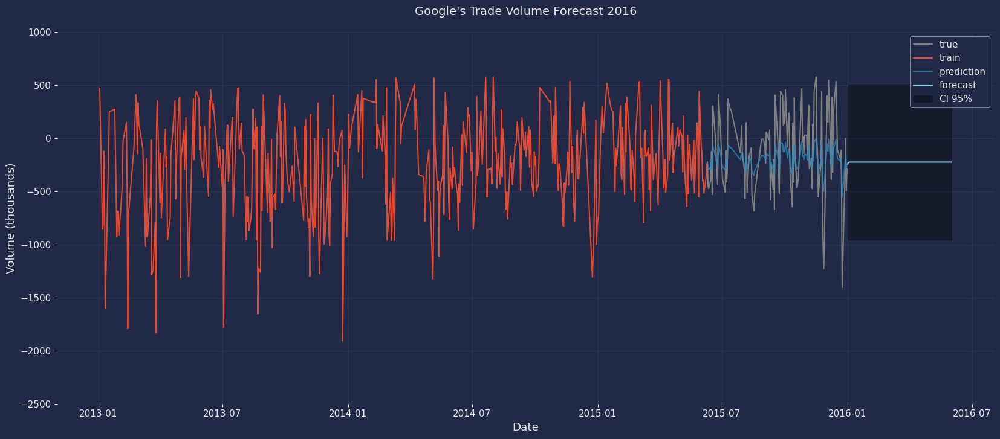

In [59]:
fcast = forecast.summary_frame(alpha=0.1)
Sfcast = RS_googl_vol.inverse_transform(fcast)

fig, axs = plt.subplots(1, 1, figsize=(20, 8))
dates = pd.date_range(start='2016-01-01', end='2016-06-01')
sns.lineplot(x=plot_Gvol.iloc[453:, 0], y=plot_Gvol.iloc[453:, 1], label='true', color='gray', ax=axs)
sns.lineplot(x=plot_Gvol.iloc[:453, 0], y=train, label='train', ax=axs)
sns.lineplot(x=plot_Gvol.iloc[453:, 0], y=pred_plot_googl, label='prediction', alpha=0.75, ax=axs)
sns.lineplot(x=dates, y=Sfcast[:, 0], label='forecast', color='skyblue', ax=axs)
axs.fill_between(dates, 
                Sfcast[:, 2], 
                Sfcast[:, 3],
                alpha=.35,
                color='black',
                label='CI 95%')
axs.set_title('Google\'s Trade Volume Forecast 2016')
axs.set_ylabel('Volume (thousands)')
axs.set_xlabel('Date')
axs.set_yticks(range(-2500, 1500, 500))
axs.legend(loc='best')
axs.legend()
plt.show()

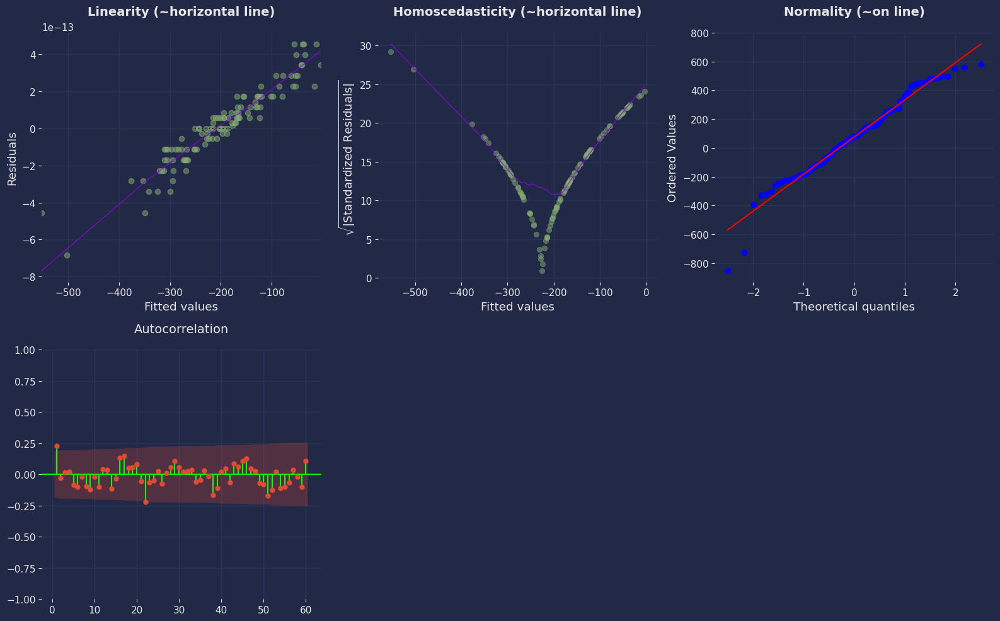

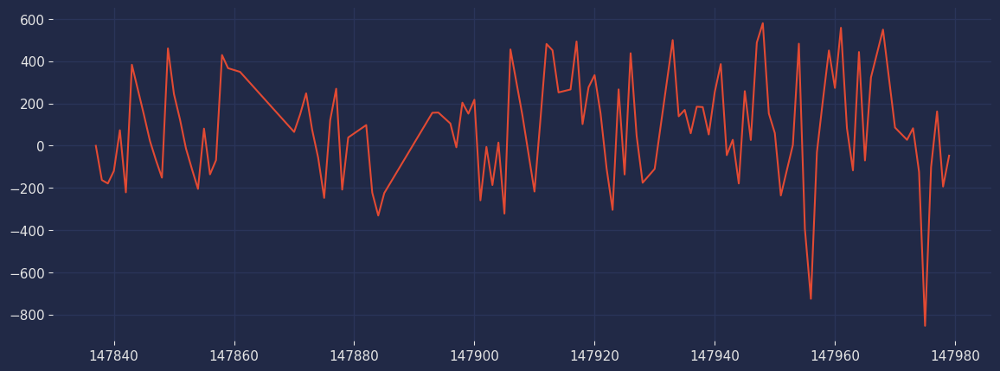

In [60]:
diagnostic_plots(pred_plot_googl, residuals_Gvol)

In [61]:
VOL = pd.DataFrame({'date':pd.date_range(start='2016-01-01', end='2016-06-01'), 'arima':Sfcast[:, 0], 'high':Sfcast[:,2], 'low':Sfcast[:, 3]})
forecastVOL = plot_Gvol.copy(deep=True)
forecastVOL = pd.concat([forecastVOL, VOL], axis=0)
forecastVOL

,date,volume,arima,high,low
147225,2013-01-03,467.422,NaN,NaN,NaN
147227,2013-01-07,-857.760,NaN,NaN,NaN
147228,2013-01-08,-817.706,NaN,NaN,NaN
147229,2013-01-09,-121.954,NaN,NaN,NaN
147230,2013-01-10,-500.304,NaN,NaN,NaN
...,...,...,...,...,...
148,2016-05-28,NaN,-225.7,-958.274,506.873
149,2016-05-29,NaN,-225.7,-958.274,506.873
150,2016-05-30,NaN,-225.7,-958.274,506.873
151,2016-05-31,NaN,-225.7,-958.274,506.873


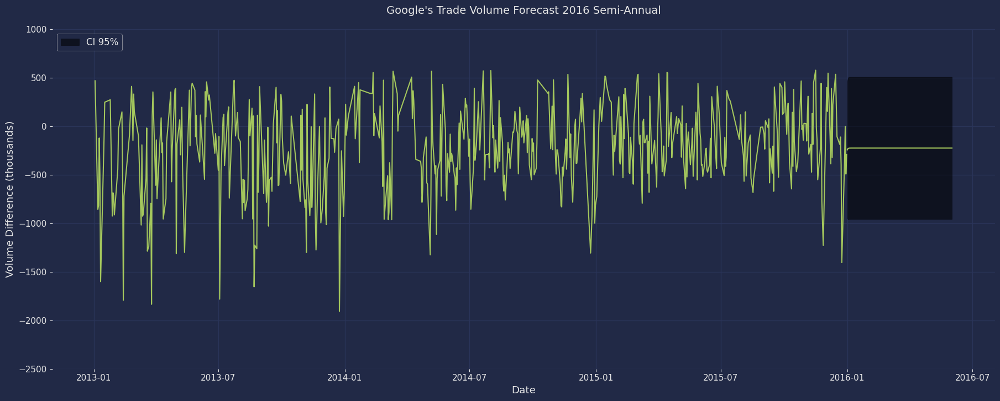

In [62]:
fig, axs = plt.subplots(1,1,figsize=(22, 8))
sns.lineplot(forecastVOL, y='volume', x='date', color='#a4c75d')
sns.lineplot(forecastVOL, y='arima', x='date', color='#a4c75d')
axs.fill_between(forecastVOL['date'], 
                forecastVOL['high'], 
                forecastVOL['low'],
                alpha=.55,
                color='black',
                label='CI 95%')
axs.legend(prop={'size': 12}, loc='upper left')
axs.set_title('Google\'s Trade Volume Forecast 2016 Semi-Annual')
axs.set_ylabel('Volume Difference (thousands)')
axs.set_xlabel('Date')
axs.set_yticks(range(-2500, 1500, 500))
plt.show()

In [63]:
ar_model = ARIMA(googl_scaled_close, order=(1, 0, 0), trend='c').fit()
pred = ar_model.predict(start=454, end=566)
forecast = ar_model.get_forecast(steps=153, fitted=True)
print(ar_model.summary())

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  566
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -630.896
Date:                Sun, 14 Apr 2024   AIC                           1267.791
Time:                        16:29:19   BIC                           1280.807
Sample:                             0   HQIC                          1272.871
                                - 566                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0526      0.065     -0.812      0.417      -0.180       0.074
ar.L1          0.4884      0.023     20.860      0.000       0.443       0.534
sigma2         0.5439      0.018     30.110      0.0

In [64]:
train = RS_googl_close.inverse_transform(googl_scaled_close[:453].reshape(-1, 1)).reshape(-1)
pred_plot_googl = RS_googl_close.inverse_transform(pred.reshape(-1, 1)).reshape(-1)

# converting scaled array into unscaled dataframe for chart
plot_googl = sample_googl[['date']].copy()
plot_googl['close'] = RS_googl_close.inverse_transform(googl_scaled_close.reshape(-1, 1)).reshape(-1)
plot_googl

,date,close
147225,2013-01-03,-6.229
147227,2013-01-07,0.414
147228,2013-01-08,0.245
147229,2013-01-09,3.194
147230,2013-01-10,5.370
...,...,...
147975,2015-12-24,-8.954
147976,2015-12-28,5.375
147977,2015-12-29,14.949
147978,2015-12-30,9.059


In [65]:
print(plot_googl.iloc[453, 1] - pred_plot_googl[0])
print(plot_googl.iloc[-1, 1] - pred_plot_googl[-1])

residuals_googl = plot_googl.iloc[453:, 1] - pred_plot_googl
residuals_googl

2.2334293611135094
-2.7210514549442366


147837    2.233
147838    0.864
147839   -0.692
147840   -3.403
147841   -2.984
          ...  
147975   -4.471
147976    2.860
147977    7.758
147978    4.744
147979   -2.721
Name: close, Length: 113, dtype: float64

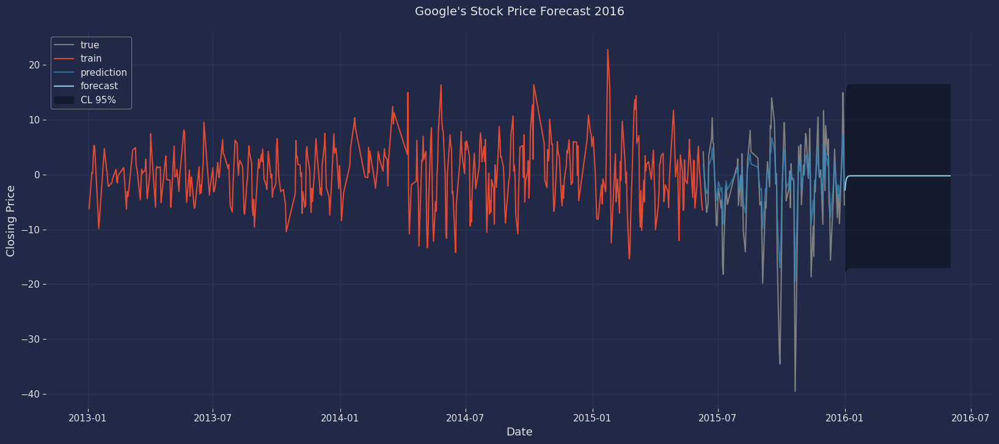

In [66]:
fcast = forecast.summary_frame(alpha=0.01)
Sfcast = RS_googl_close.inverse_transform(fcast)

fig, axs = plt.subplots(1, 1, figsize=(20, 8))
sns.lineplot(x=plot_googl.iloc[453:, 0], y=plot_googl.iloc[453:, 1], label='true', color='gray', ax=axs)
sns.lineplot(x=plot_googl.iloc[:453, 0], y=train, label='train', ax=axs)
sns.lineplot(x=plot_googl.iloc[453:, 0], y=pred_plot_googl, label='prediction', alpha=0.75, ax=axs)
sns.lineplot(x=dates, y=Sfcast[:, 0], label='forecast', color='skyblue', ax=axs)
axs.fill_between(dates, 
                Sfcast[:, 2], 
                Sfcast[:, 3],
                alpha=.35,
                color='black',
                label='CL 95%')
axs.legend(loc='upper left')
axs.set_title('Google\'s Stock Price Forecast 2016')
axs.set_ylabel('Closing Price')
axs.set_xlabel('Date')
plt.show()

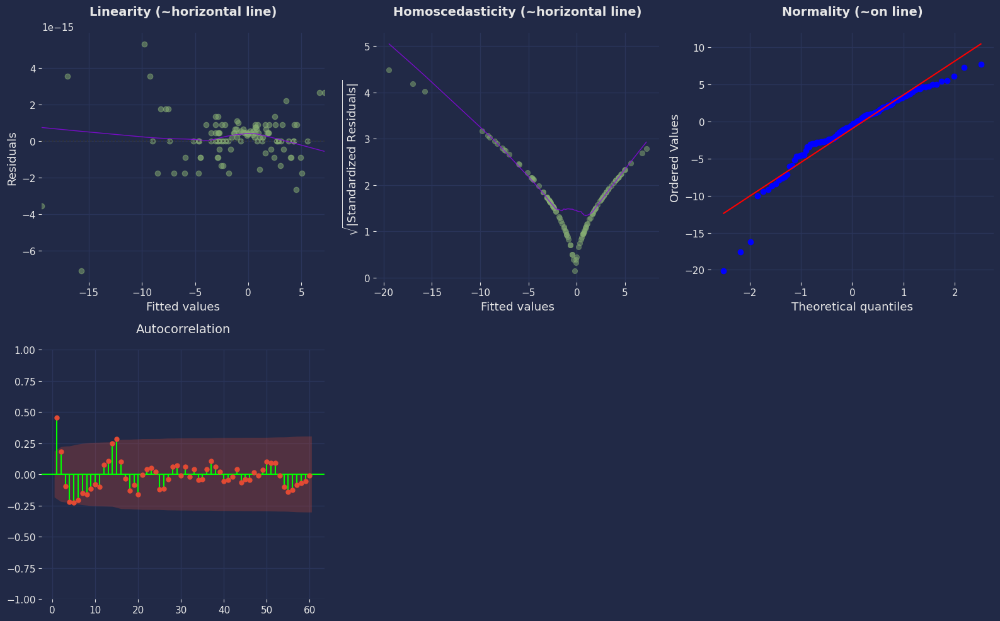

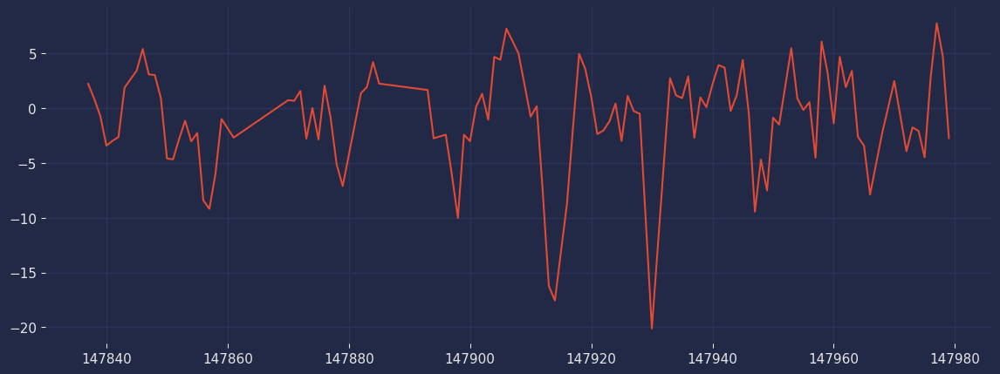

In [67]:
diagnostic_plots(pred_plot_googl, residuals_googl)

In [68]:
CLS = pd.DataFrame({'date':pd.date_range(start='2016-01-01', end='2016-06-01'), 'arima':Sfcast[:, 0], 'high':Sfcast[:,2], 'low':Sfcast[:, 3]})
forecastCLS = plot_googl.copy(deep=True)
forecastCLS = pd.concat([forecastCLS, CLS], axis=0)
forecastCLS

,date,close,arima,high,low
147225,2013-01-03,-6.229,NaN,NaN,NaN
147227,2013-01-07,0.414,NaN,NaN,NaN
147228,2013-01-08,0.245,NaN,NaN,NaN
147229,2013-01-09,3.194,NaN,NaN,NaN
147230,2013-01-10,5.370,NaN,NaN,NaN
...,...,...,...,...,...
148,2016-05-28,NaN,-0.214,-16.944,16.515
149,2016-05-29,NaN,-0.214,-16.944,16.515
150,2016-05-30,NaN,-0.214,-16.944,16.515
151,2016-05-31,NaN,-0.214,-16.944,16.515


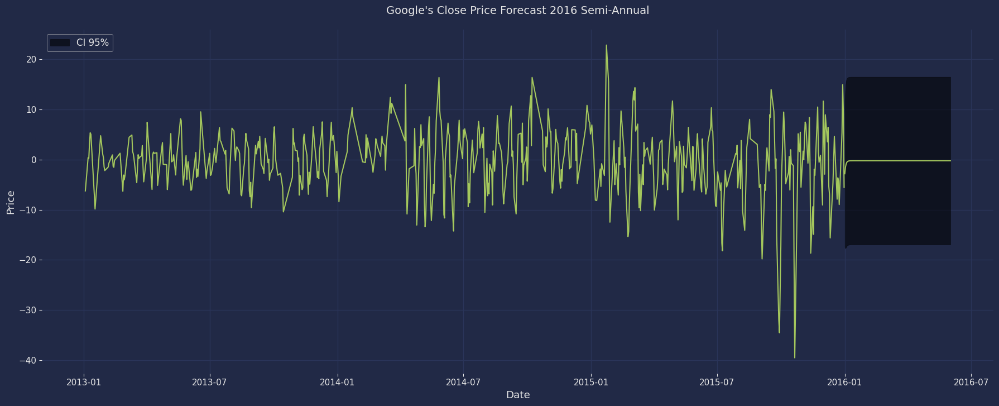

In [69]:
fig, axs = plt.subplots(1,1,figsize=(22, 8))
sns.lineplot(forecastCLS, y='close', x='date', color='#a4c75d')
sns.lineplot(forecastCLS, y='arima', x='date', color='#a4c75d')
axs.fill_between(forecastCLS['date'], 
                forecastCLS['high'], 
                forecastCLS['low'],
                alpha=.55,
                color='black',
                label='CI 95%')
axs.legend(prop={'size': 12}, loc='upper left')
axs.set_title('Google\'s Close Price Forecast 2016 Semi-Annual')
axs.set_ylabel('Price')
axs.set_xlabel('Date')
plt.show()

## Forecasting volatility of closing price via GARCH model

In [135]:
returns = pd.DataFrame({'close':googl_scaled_close.reshape(-1)})
returns.index = pd.to_datetime(sample_googl['date'].values)
returns.dropna(inplace=True)
garch_model = arch_model(returns, vol='ARCH', mean='constant', dist='skewstudent', p=1, q=1)
Ores = garch_model.fit(disp="off")
print(Ores.summary())

                            Constant Mean - ARCH Model Results                           
Dep. Variable:                             close   R-squared:                       0.000
Mean Model:                        Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                  ARCH   Log-Likelihood:               -654.607
Distribution:      Standardized Skew Student's t   AIC:                           1319.21
Method:                       Maximum Likelihood   BIC:                           1340.91
                                                   No. Observations:                  566
Date:                           Sun, Apr 14 2024   Df Residuals:                      565
Time:                                   20:36:02   Df Model:                            1
                                Mean Model                                
                 coef    std err          t      P>|t|    95.0% Conf. Int.
----------------------------------------

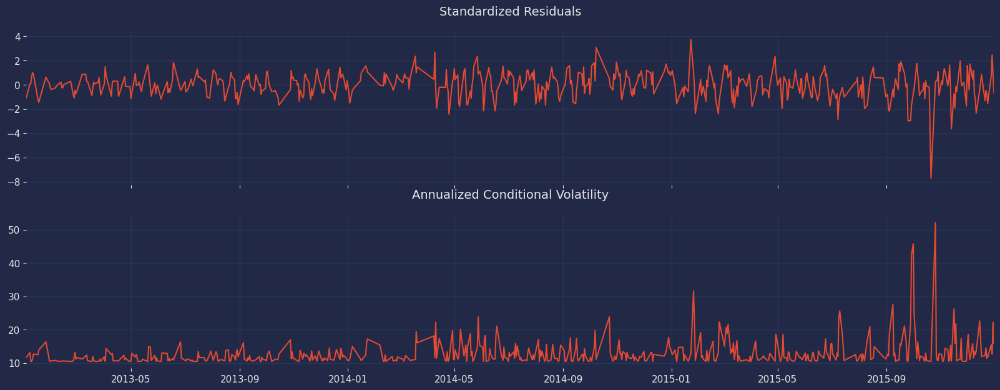

In [548]:
fig = Ores.plot(annualize="D")

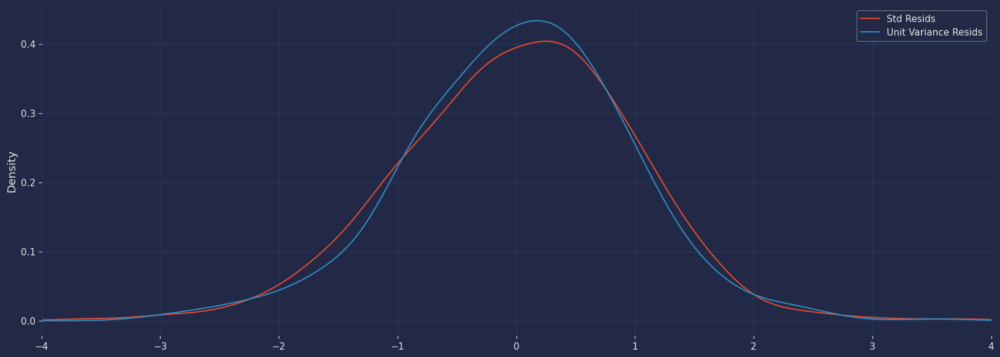

In [549]:
std_resid = Ores.resid / Ores.conditional_volatility
unit_var_resid = Ores.resid / Ores.resid.std()
df = pd.DataFrame({"Std Resids": std_resid, "Unit Variance Resids":unit_var_resid})
subplot = df.plot(kind="kde", xlim=(-4, 4))

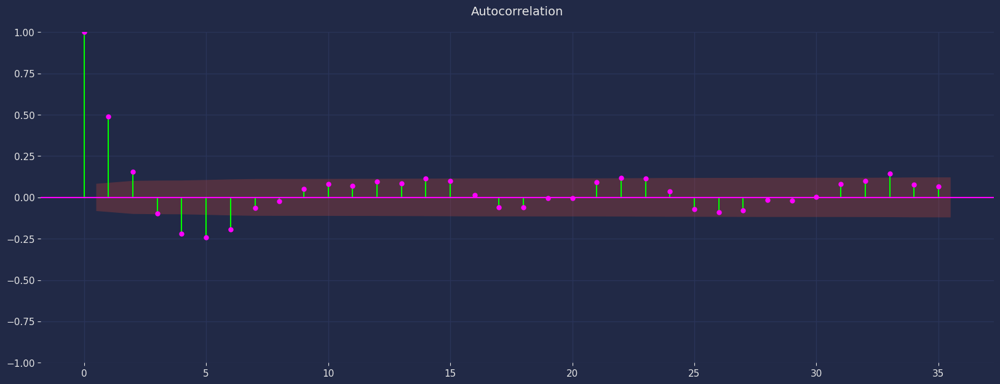

In [550]:
plot_acf(Ores.resid, lags=35, color="fuchsia")
plt.show()

In [551]:
res = garch_model.fit(last_obs='2014-12-31', disp="off")
print(res.summary())

                            Constant Mean - ARCH Model Results                           
Dep. Variable:                             close   R-squared:                       0.000
Mean Model:                        Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                  ARCH   Log-Likelihood:               -363.669
Distribution:      Standardized Skew Student's t   AIC:                           737.338
Method:                       Maximum Likelihood   BIC:                           756.797
                                                   No. Observations:                  362
Date:                           Sun, Apr 14 2024   Df Residuals:                      361
Time:                                   19:18:57   Df Model:                            1
                                 Mean Model                                
                 coef    std err          t      P>|t|     95.0% Conf. Int.
--------------------------------------

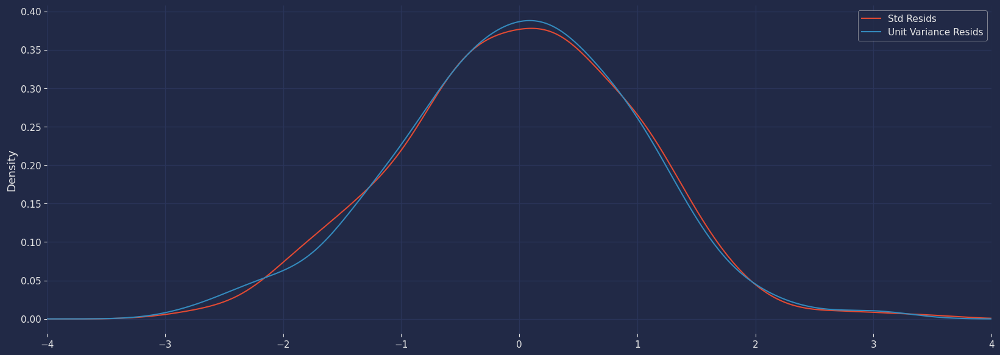

In [552]:
std_resid = res.resid / res.conditional_volatility
unit_var_resid = res.resid / res.resid.std()
df = pd.DataFrame({"Std Resids": std_resid, "Unit Variance Resids":unit_var_resid})
subplot = df.plot(kind="kde", xlim=(-4, 4))

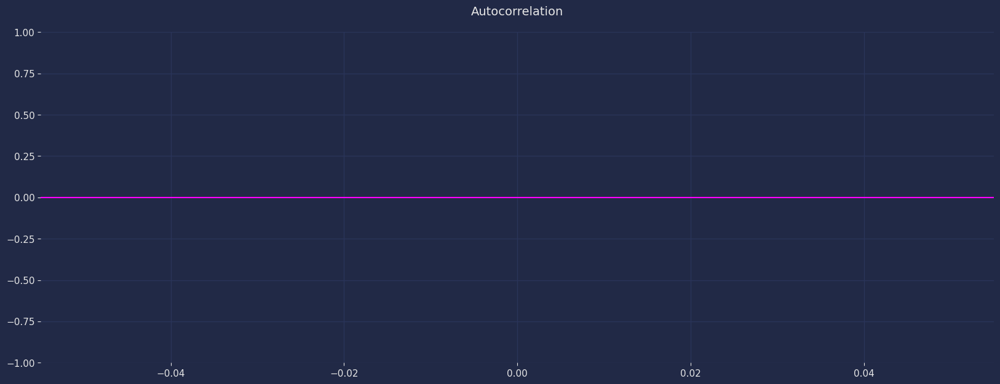

In [553]:
plot_acf(res.resid, lags=35, color="fuchsia")
plt.show()

### Inspecting daily shocks for unusually high volatility
Indicated by a residual variance of > 1. Shocks are sorted in descending order for swift analysis

In [554]:
split_date = '2015-01-01'
# 10 horizons to witness varying time periods' individual effect on volatility
# 5000 simulations to prevent obtaining identical results to the recusive analytics (default) method
sim_forecasts = res.forecast(horizon=10, start=split_date, method='simulation', simulations=100)
print(sim_forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50))

             h.01   h.02   h.03   h.04   h.05   h.06   h.07   h.08   h.09  \
2015-10-21  8.125  2.869  1.306  0.686  0.497  0.471  0.447  0.456  0.456   
2015-09-29  6.297  1.619  0.761  0.492  0.517  0.454  0.484  0.452  0.415   
2015-09-28  5.446  1.987  1.065  0.608  0.525  0.457  0.467  0.447  0.464   
2015-01-23  2.790  1.223  0.731  0.588  0.462  0.486  0.434  0.470  0.522   
2015-09-04  2.330  1.037  0.583  0.531  0.520  0.514  0.472  0.462  0.476   
2015-11-13  2.110  0.999  0.661  0.549  0.447  0.474  0.461  0.449  0.455   
2015-07-09  2.022  1.048  0.606  0.551  0.513  0.471  0.497  0.506  0.457   
2015-10-01  1.845  0.769  0.572  0.499  0.491  0.493  0.480  0.490  0.459   
2015-07-08  1.756  0.822  0.524  0.478  0.482  0.451  0.477  0.464  0.447   
2015-12-11  1.587  0.674  0.515  0.472  0.428  0.440  0.480  0.484  0.439   
2015-02-23  1.546  0.737  0.480  0.463  0.482  0.467  0.486  0.452  0.427   
2015-09-25  1.516  0.745  0.603  0.497  0.502  0.461  0.477  0.473  0.483   

In [555]:
forecasts = res.forecast(horizon=10, start=split_date)
print(forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50))

             h.01   h.02   h.03   h.04   h.05   h.06   h.07   h.08   h.09  \
2015-10-21  8.125  2.675  1.104  0.651  0.520  0.482  0.472  0.468  0.468   
2015-09-29  6.297  2.148  0.952  0.607  0.507  0.479  0.470  0.468  0.467   
2015-09-28  5.446  1.903  0.881  0.586  0.502  0.477  0.470  0.468  0.467   
2015-01-23  2.790  1.137  0.660  0.523  0.483  0.472  0.468  0.468  0.467   
2015-09-04  2.330  1.004  0.622  0.512  0.480  0.471  0.468  0.467  0.467   
2015-11-13  2.110  0.941  0.604  0.507  0.478  0.470  0.468  0.467  0.467   
2015-07-09  2.022  0.916  0.596  0.504  0.478  0.470  0.468  0.467  0.467   
2015-10-01  1.845  0.864  0.582  0.500  0.477  0.470  0.468  0.467  0.467   
2015-07-08  1.756  0.839  0.574  0.498  0.476  0.470  0.468  0.467  0.467   
2015-12-11  1.587  0.790  0.560  0.494  0.475  0.469  0.468  0.467  0.467   
2015-02-23  1.546  0.778  0.557  0.493  0.475  0.469  0.468  0.467  0.467   
2015-09-25  1.516  0.770  0.554  0.492  0.474  0.469  0.468  0.467  0.467   

In [556]:
volatile_dates = forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50).index
volatile_dates.sort_values()

DatetimeIndex(['2015-01-07', '2015-01-09', '2015-01-23', '2015-01-26',
               '2015-01-28', '2015-02-13', '2015-02-23', '2015-02-24',
               '2015-02-25', '2015-03-02', '2015-03-03', '2015-03-04',
               '2015-03-05', '2015-03-11', '2015-03-13', '2015-04-02',
               '2015-04-28', '2015-04-29', '2015-05-06', '2015-06-23',
               '2015-06-29', '2015-06-30', '2015-07-08', '2015-07-09',
               '2015-07-10', '2015-08-07', '2015-08-10', '2015-09-03',
               '2015-09-04', '2015-09-15', '2015-09-17', '2015-09-21',
               '2015-09-25', '2015-09-28', '2015-09-29', '2015-10-01',
               '2015-10-05', '2015-10-21', '2015-11-13', '2015-11-16',
               '2015-11-17', '2015-11-23', '2015-11-30', '2015-12-01',
               '2015-12-04', '2015-12-11', '2015-12-21', '2015-12-24',
               '2015-12-29', '2015-12-30'],
              dtype='datetime64[ns]', freq=None)

### Forecast efficacy evaluation
The peak discrepencies of period 1 occurs occurs on 3/05 with a residual variance of 2.5. - on the other hand, period 2's peak is 07/07 of 12. It's apparent the model is less accurate on days of higher volatility. The Annualized Conditional Volatility line chart above depicts swings in the July and after. Since this GARCH model doesn't prioritize accuracy of outliers and instead maintains a degree sensitivity towards the main distribution, swings can be under-weighted and result in misinterpeting returns. Expectations for these scenarios must accomadate this nature, and any perceived risk notated from outliers are benefitted from projecing extra-value upon each.

### Shock evaluation
The second half of year 2014 shows eratic behavor which has implications regarding investment strategies. If shocks in the pivotal end-of-year Q4 are of greater value from exogenous market variables that persist longer than a short-term event, like a financial crisis or interest rate hikes, what would the associated risk be quantified as? For mitigating losses when such a scenario arises, I'm keen towards designing a Monte Carlo simulation that can portray a systematic wide effect on the 2015 forecast from these shocks. The true dataset, average of Monte Carlo simulation, and original forecast are plotted along with others for valuable insights.

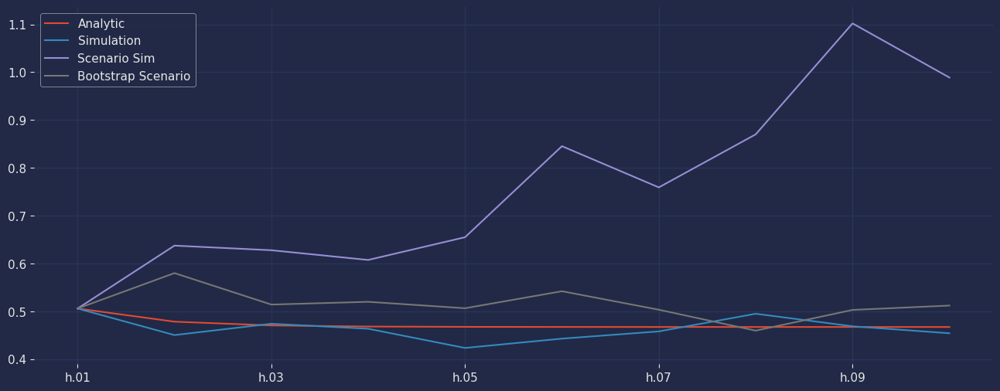

In [567]:
random_state = np.random.RandomState(14)
def scenario_rng(size):
    shocks = random_state.standard_normal(size)
    shocks *= 1.4 # shock magnification of 2014 Q4 for 2015 forecast
    return shocks
std_shocks = res.resid / res.conditional_volatility
shocks = std_shocks["2014-09-01":"2014-12-31"].dropna()

# By using historical shocks as the basis for future simulations, this approach can capture the empirical distribution and characteristics of the historical data,
# which might be more realistic than assuming the model's theoretical distribution (Gaussian).
class ScenarioBootstrapRNG(object):
    def __init__(self, shocks, random_state):
        self._shocks = np.asarray(shocks)
        self._rs = random_state
        self.n = shocks.shape[0]

    def rng(self, size):
        end = self._rs.randint(0, self.n, size=size)
        return self._shocks[end]
        
scenario_forecasts = res.forecast(horizon=10, start=split_date, method='simulation', rng=scenario_rng, simulations=100)
scenario_bootstrap = ScenarioBootstrapRNG(shocks, random_state)
bs_forecasts = res.forecast(horizon=10, start=split_date, method='bootstrap', rng=scenario_bootstrap.rng, simulations=50)

df = pd.concat(
    [
        forecasts.residual_variance.iloc[-1],
        sim_forecasts.residual_variance.iloc[-1],
        scenario_forecasts.residual_variance.iloc[-1],
        bs_forecasts.residual_variance.iloc[-1],
    ],
    axis=1,
)
df.columns = ["Analytic", "Simulation", "Scenario Sim", "Bootstrap Scenario"]

subplot = df.plot(figsize=(16,6))
plt.show()

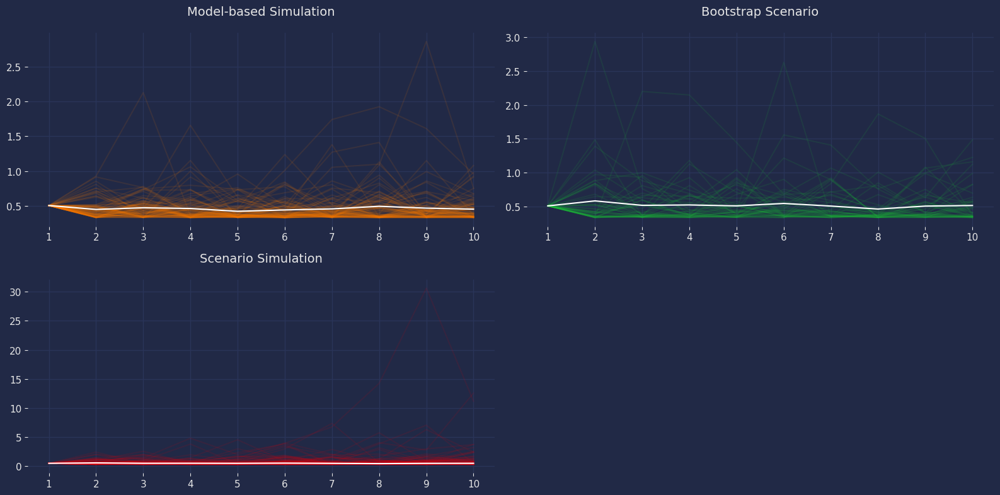

In [568]:
fig, axes = plt.subplots(2, 2, figsize=(16,8))
axes = axes.flatten()
colors = sns.color_palette("bright")

# The paths for the final observation
# Analytic version (default) has a single path from recursive formula
sim_paths = sim_forecasts.simulations.residual_variances[-1].T
bs_paths = bs_forecasts.simulations.residual_variances[-1].T
simS_paths = scenario_forecasts.simulations.residual_variances[-1].T

x = np.arange(1, 11)
# Plot the paths and the mean, set the axis to have the same limit
# .plot(x, np.sqrt(252 * bs_paths) to scale a daily volatility into annualized for 252 trading days
# also .plot(x, np.sqrt(252 * bs_forecasts.residual_variance.iloc[-1])
axes[0].plot(x, sim_paths, color=colors[1], alpha=0.1)
axes[0].plot(
    x, sim_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[0].set_title("Model-based Simulation")
axes[0].set_xticks(np.arange(1, 11))

axes[1].plot(x, bs_paths, color=colors[2], alpha=0.1)
axes[1].plot(
    x, bs_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[1].set_xticks(np.arange(1, 11))
title = axes[1].set_title("Bootstrap Scenario")

axes[2].plot(x, simS_paths, color=colors[3], alpha=0.1)
axes[2].plot(
    x, bs_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[2].set_xticks(np.arange(1, 11))
title = axes[2].set_title("Scenario Simulation")

fig.delaxes(axes[3])
plt.tight_layout()
plt.show()

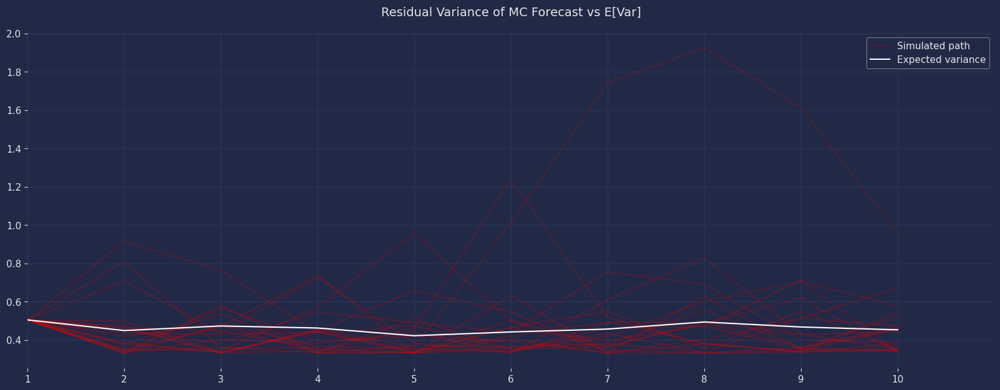

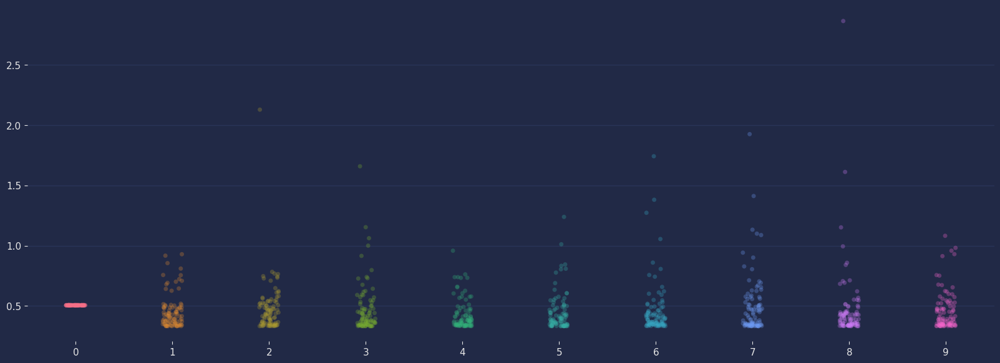

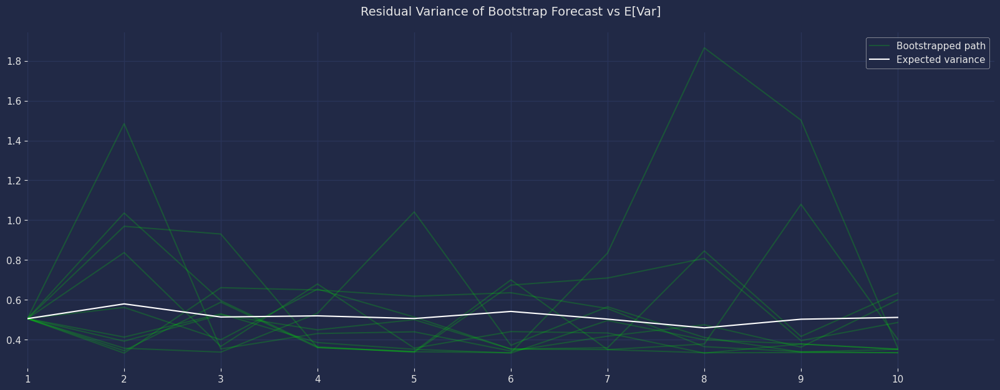

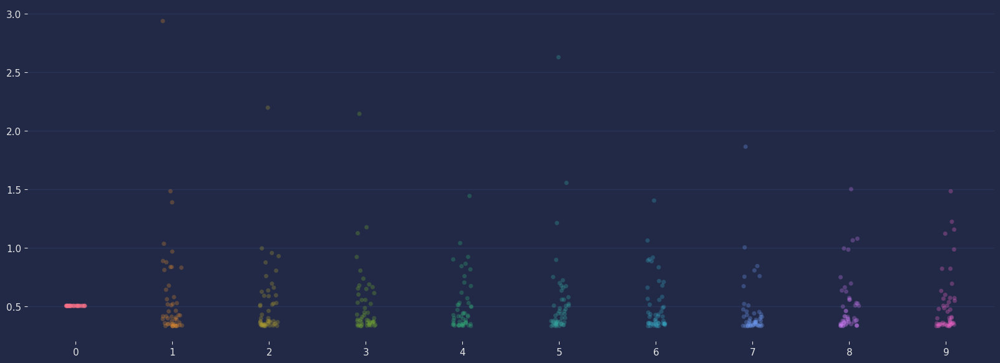

In [569]:
sims = sim_forecasts.simulations

x = np.arange(1, 11)
lines = plt.plot(x, sims.residual_variances[-1, ::5].T, color="red", alpha=0.2)
lines[0].set_label("Simulated path")
line = plt.plot(x, sim_forecasts.variance.iloc[-1].values, color="white")
line[0].set_label("Expected variance")
plt.gca().set_xticks(x)
plt.gca().set_xlim(1, 11)
legend = plt.legend()
plt.title('Residual Variance of MC Forecast vs E[Var]')
plt.show()
sns.stripplot(data=sims.variances[-1], alpha=0.3)
plt.show()

sims = bs_forecasts.simulations

lines = plt.plot(x, sims.residual_variances[-1, ::5].T, color="lime", alpha=0.2)
lines[0].set_label("Bootstrapped path")
line = plt.plot(x, bs_forecasts.variance.iloc[-1].values, color="white")
line[0].set_label("Expected variance")
plt.gca().set_xticks(x)
plt.gca().set_xlim(1, 11)
legend = plt.legend()
plt.title('Residual Variance of Bootstrap Forecast vs E[Var]')
plt.show()
sns.stripplot(data=sims.variances[-1], alpha=0.3)
plt.show()

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1613: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plot_fn(x_values, y_values, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1628: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  line = plot_fn(temp_x, temp_y, linewidth=3, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1613: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plot_fn(x_values, y_values, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\P

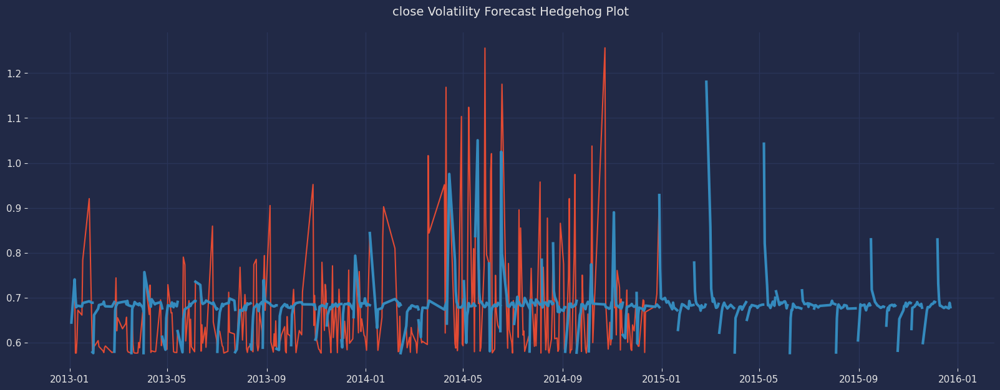

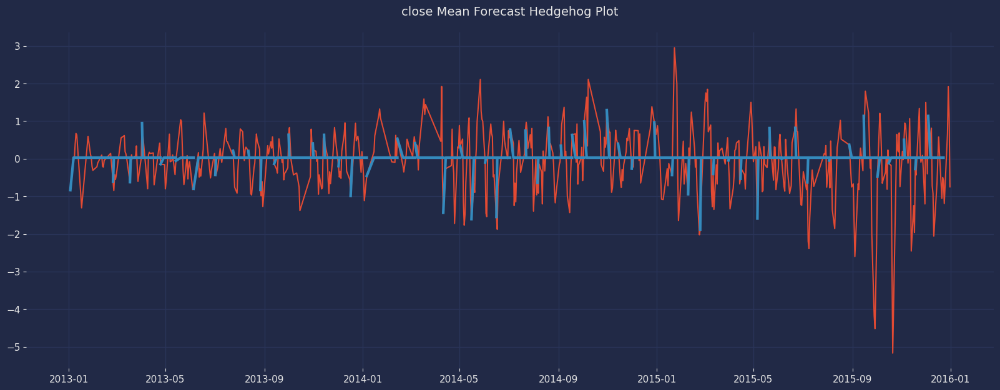

In [560]:
fig = res.hedgehog_plot(plot_type='volatility', horizon=10, method='simulation')
fig = res.hedgehog_plot(plot_type='mean', horizon=10, method='simulation')

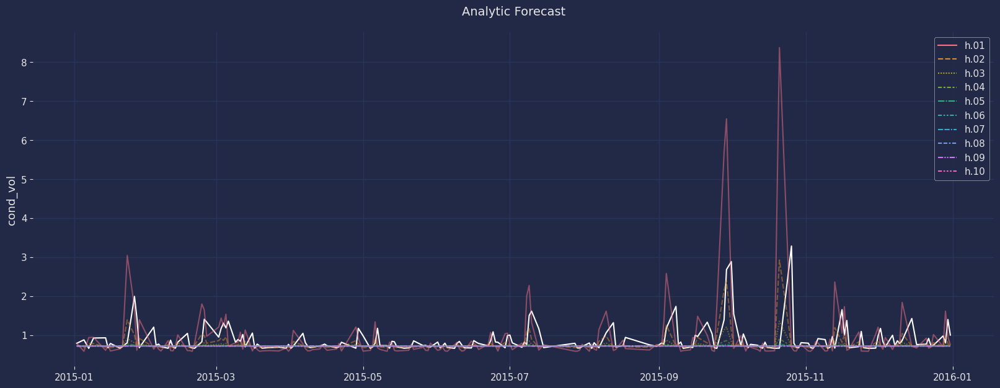

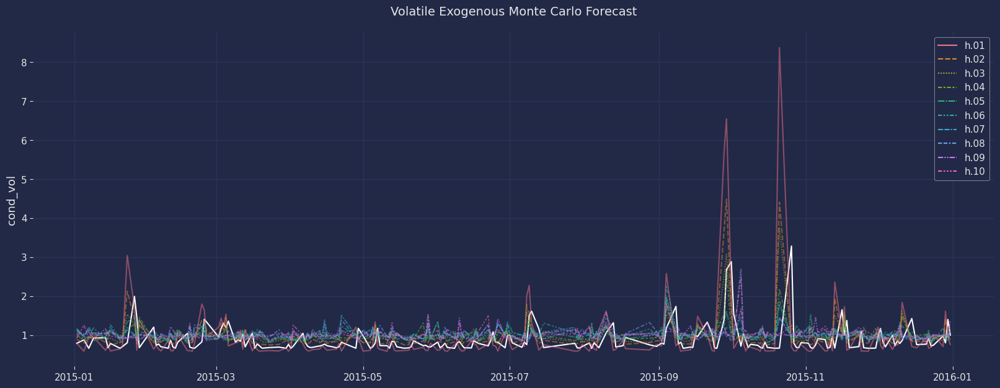

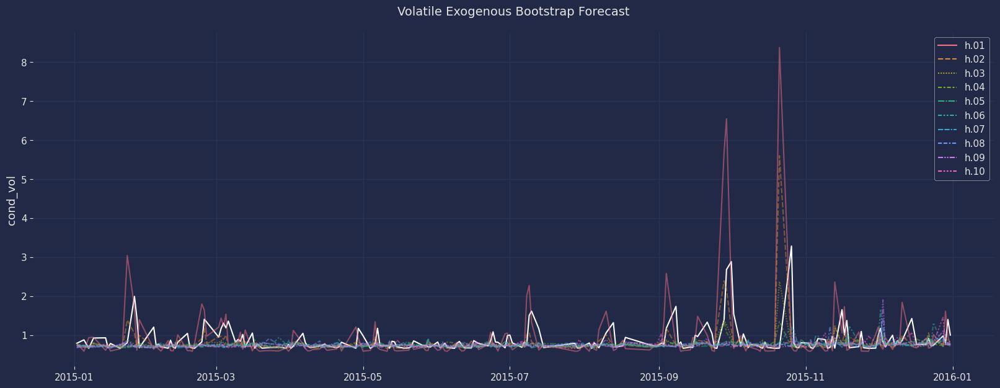

In [571]:
analytic = forecasts.residual_variance.dropna()
bs = bs_forecasts.residual_variance.dropna()
sc = scenario_forecasts.residual_variance.dropna()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(analytic+.25, alpha=0.5)
plt.title('Analytic Forecast')
plt.show()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(sc+.25, alpha=0.5)
plt.title('Volatile Exogenous Monte Carlo Forecast')
plt.show()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(bs+.25, alpha=0.5)
plt.title('Volatile Exogenous Bootstrap Forecast')
plt.show()

## Applying the Optimal Garch Parameters to Forecast Overall Returns

In [135]:
pd.set_option('display.max_rows', 10)
ljung_res = acorr_ljungbox(sample_googl['close'], lags=60, boxpierce=True)
ljung_res.sort_values(by='lb_pvalue')

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
35,336.395,6.175e-51,330.285,9.702e-50
34,333.797,6.296e-51,327.856,9.226e-50
33,330.224,9.902e-51,324.510,1.318e-49
36,337.812,1.023e-50,331.607,1.664e-49
37,338.291,2.553e-50,332.054,4.178e-49
...,...,...,...,...
57,352.017,4.240e-44,344.495,1.010e-42
4,181.837,3.006e-38,180.689,5.303e-38
3,154.382,2.988e-33,153.524,4.577e-33
2,149.104,4.192e-33,148.293,6.290e-33


In [136]:
ljung_res.sort_values(by='bp_pvalue')

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
34,333.797,6.296e-51,327.856,9.226e-50
35,336.395,6.175e-51,330.285,9.702e-50
33,330.224,9.902e-51,324.510,1.318e-49
36,337.812,1.023e-50,331.607,1.664e-49
37,338.291,2.553e-50,332.054,4.178e-49
...,...,...,...,...
57,352.017,4.240e-44,344.495,1.010e-42
4,181.837,3.006e-38,180.689,5.303e-38
3,154.382,2.988e-33,153.524,4.577e-33
2,149.104,4.192e-33,148.293,6.290e-33


In [474]:
train_GARCH = pd.DataFrame({'unique_id':1, 'ds':sample_googl.iloc[:453, 0].values, 'y':googl_scaled_close[:453].reshape(-1)})
test_GARCH = pd.DataFrame({'unique_id':1, 'ds':sample_googl.iloc[453:, 0].values, 'y':googl_scaled_close[453:].reshape(-1)})

horizon = len(test_GARCH) # number of predictions biasadj=True, include_drift=True
seasonal_length = 0

models = [GARCH(1,1),
          GARCH(1,2),
          GARCH(2,2),
          GARCH(2,1),
          GARCH(3,1),
          GARCH(3,2),
          GARCH(3,3), 
          GARCH(1,3), 
          GARCH(2,3)]

sf = StatsForecast(df=train_GARCH,
                   models=models,
                   freq='C', #custom business day for trading days
                   n_jobs=-1) #-1 for all cores

size, frame = step_sequence(train_GARCH, .1)

crossvalidation_df = sf.cross_validation(df=train_GARCH,
                                         h=horizon,
                                         step_size=size,
                                         n_windows=frame)

In [87]:
crossvalidation_df.rename(columns = {'y' : 'actual'}, inplace = True) # rename actual values 
rmse_cv = crossvalidation_df.groupby(['unique_id', 'cutoff']).apply(compute_cv_rmse)

agg_mae = rmse_cv.groupby('unique_id').mean()
agg_mae.style.highlight_min(color = 'lime', axis = 1)

,"GARCH(1,1)","GARCH(1,2)","GARCH(2,2)","GARCH(2,1)","GARCH(3,1)","GARCH(3,2)","GARCH(3,3)","GARCH(1,3)","GARCH(2,3)"
unique_id,,,,,,,,,
1,0.893707,0.882622,0.882374,0.876445,0.864462,0.864025,0.866778,0.882241,0.881939


In [88]:
sf = StatsForecast(df=train_GARCH, models=[GARCH(3,2)], freq="C", n_jobs=-1)
sf.fit()
result=sf.fitted_[0,0].model_
result

{'p': 3,
 'q': 2,
 'coeff': array([1.50403488e-01, 2.98766204e-01, 0.00000000e+00, 6.13491190e-14,
        2.21105527e-01, 2.04531045e-01]),
 'message': 'Optimization terminated successfully',
 'y_vals': array([-0.00116623, -0.7334317 , -0.86182869]),
 'sigma2_vals': array([0.31426205, 0.45020722]),
 'fitted': array([            nan,             nan,             nan,  6.29983693e-01,
        -2.92952332e-01, -3.20247385e-01, -6.77302120e-01,  6.63567588e-01,
        -2.14859546e+00,  1.31725835e+00, -5.15768895e-01,  1.93751494e-01,
        -1.45177720e-01,  8.38642938e-01, -1.13960798e+00, -1.73351704e-01,
        -2.03167193e-01,  6.03068071e-01, -5.87212901e-01, -8.99101497e-02,
        -4.60283375e-01,  2.59689185e-02,  4.13713560e-01, -6.89935620e-01,
         7.51123714e-01,  5.59700251e-01,  3.24228971e-01,  5.93789068e-01,
        -3.99956096e-01, -6.95080448e-02, -5.04915700e-01, -1.68508507e-01,
         2.98362358e-01, -3.81764666e-01, -2.10876079e-01, -3.60745668e-01,
     

In [89]:
residual=pd.DataFrame(result.get("actual_residuals"), columns=["residual Model"]).dropna()
residual

,residual Model
3,-0.239
4,0.967
5,0.954
6,-0.281
7,-1.970
...,...
448,0.411
449,0.790
450,-0.585
451,-0.518


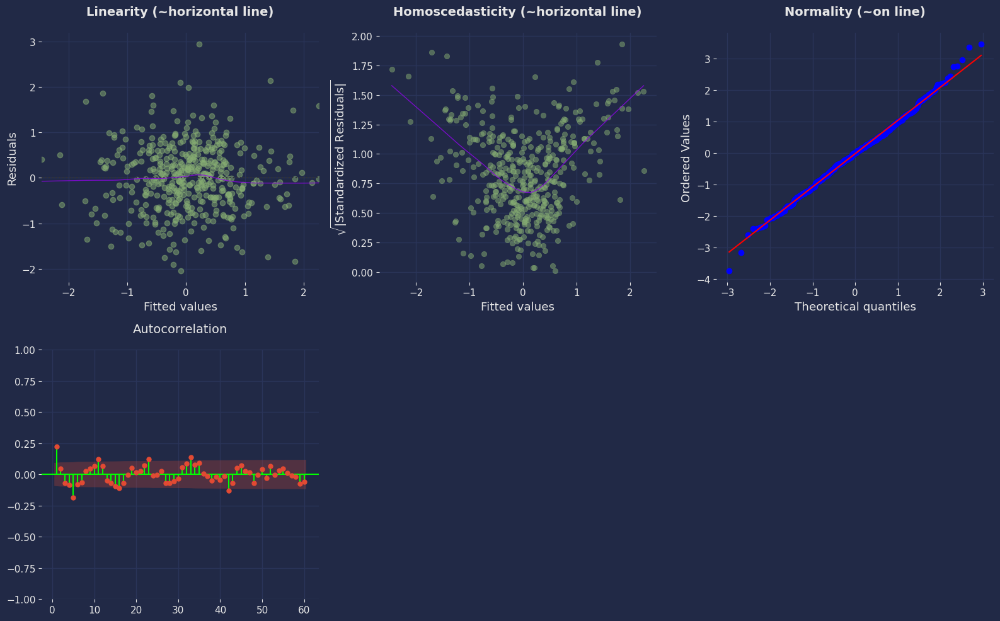

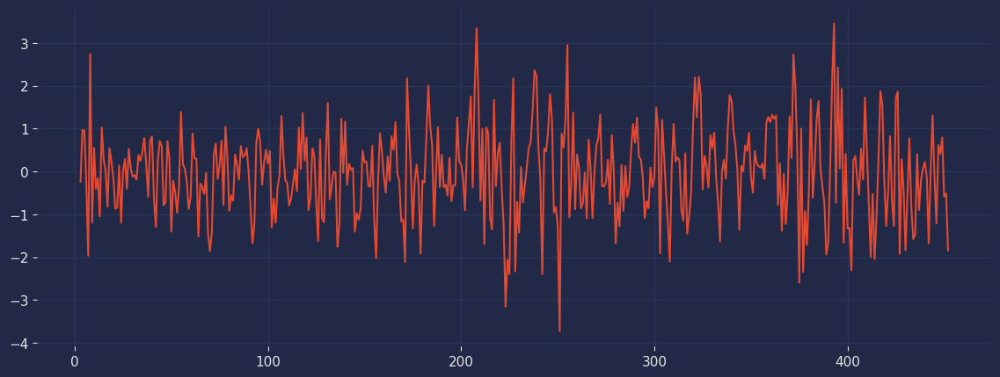

In [90]:
preds = result['fitted'][3:]
diagnostic_plots(preds, residual['residual Model'])

In [91]:
# contains test results & forecast into 2016
Y_hat = sf.forecast(255, fitted=True, level=[80, 95])
Y_hat=Y_hat.reset_index()
values=sf.forecast_fitted_values()
Y_hat

,unique_id,ds,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
0,1,2015-06-10,1.189,0.139,0.502,1.876,2.240
1,1,2015-06-11,-0.542,-2.077,-1.546,0.463,0.994
2,1,2015-06-12,-0.381,-1.402,-1.049,0.286,0.640
3,1,2015-06-15,-0.735,-1.655,-1.336,-0.134,0.185
4,1,2015-06-16,0.625,-0.398,-0.044,1.294,1.649
...,...,...,...,...,...,...,...
250,1,2016-05-25,-0.285,-1.624,-1.160,0.590,1.054
251,1,2016-05-26,-0.156,-1.048,-0.739,0.428,0.737
252,1,2016-05-27,-1.762,-2.542,-2.272,-1.252,-0.982
253,1,2016-05-30,2.174,-0.294,0.560,3.788,4.643


In [92]:
# compare test true values to GARCH model
test_GARCH['unique_id'] = test_GARCH['unique_id'].astype(int)
Y_hat1 = test_GARCH.merge(Y_hat, how='left', on=['unique_id', 'ds']).dropna()
Y_hat1

,unique_id,ds,y,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
0,1,2015-06-10,0.515,1.189,0.139,5.023e-01,1.876,2.240
1,1,2015-06-11,0.167,-0.542,-2.077,-1.546e+00,0.463,0.994
2,1,2015-06-12,-0.228,-0.381,-1.402,-1.049e+00,0.286,0.640
3,1,2015-06-15,-0.918,-0.735,-1.655,-1.336e+00,-0.134,0.185
4,1,2015-06-16,-0.812,0.625,-0.398,-4.381e-02,1.294,1.649
...,...,...,...,...,...,...,...,...
108,1,2015-12-24,-1.190,-0.057,-0.668,-4.563e-01,0.343,0.554
109,1,2015-12-28,0.675,0.440,-0.233,-1.204e-04,0.879,1.112
110,1,2015-12-29,1.921,0.310,-0.362,-1.295e-01,0.750,0.982
111,1,2015-12-30,1.154,0.079,-0.559,-3.382e-01,0.495,0.716


In [93]:
# table for fitted values on training dataset
fitted_df = train_GARCH.merge(values, on='ds').drop('y_x', axis=1).rename({'y_y':'y'}, axis=1).dropna().set_index('ds')
fitted_df

,unique_id,y,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
ds,,,,,,,
2013-01-09,1,0.391,0.630,-1.421,-0.711,1.971,2.681
2013-01-10,1,0.674,-0.293,-2.344,-1.634,1.048,1.758
2013-01-11,1,0.633,-0.320,-2.371,-1.661,1.021,1.731
2013-01-16,1,-0.958,-0.677,-2.728,-2.018,0.664,1.374
2013-01-17,1,-1.306,0.664,-1.388,-0.678,2.005,2.715
...,...,...,...,...,...,...,...
2015-06-03,1,0.650,0.239,-1.812,-1.102,1.581,2.290
2015-06-04,1,0.229,-0.560,-2.612,-1.902,0.781,1.491
2015-06-05,1,-0.001,0.584,-1.467,-0.757,1.925,2.635


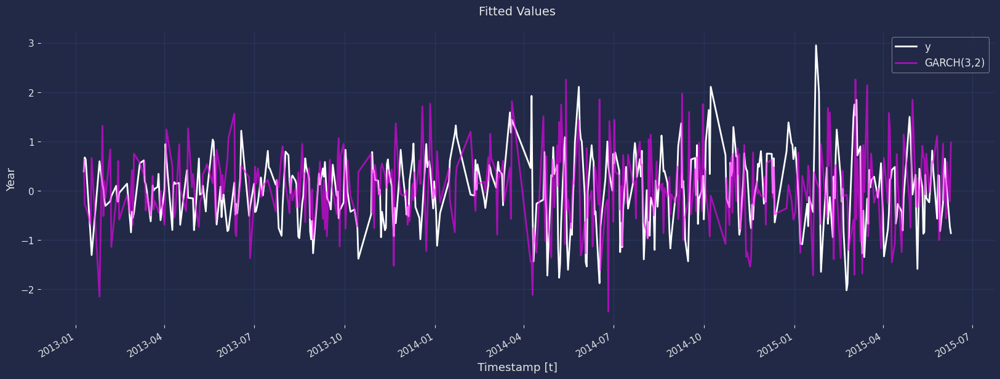

In [94]:
fig, ax = plt.subplots(1, 1)
fitted_df['y'].plot(ax=ax, linewidth=2, color='white')
fitted_df["GARCH(3,2)"].plot(ax=ax, linewidth=2, color='Fuchsia', alpha=.6)
ax.set_title('Fitted Values')
ax.set_ylabel('Year')
ax.set_xlabel('Timestamp [t]')
ax.legend(prop={'size': 12})
plt.show()

In [95]:
# table with the full historical data
df = pd.DataFrame()
df['y'] = sample_googl[['close']]
df['ds'] = sample_googl['date'].values
sg = sample_googl.rename({'date':'ds'}, axis=1)
len(sample_googl[['close']])

566

In [96]:
sg

,ds,open,close,low,high,volume (thousands)
147225,2013-01-03,-4.723,-6.229,-4.016,-3.654,467.422
147227,2013-01-07,1.169,0.414,1.788,0.482,-857.760
147228,2013-01-08,1.571,0.245,-0.850,-0.845,-817.706
147229,2013-01-09,0.300,3.194,1.661,0.387,-121.954
147230,2013-01-10,5.940,5.370,4.502,3.899,-500.304
...,...,...,...,...,...,...
147975,2015-12-24,-7.556,-8.954,-4.305,-12.153,-1405.396
147976,2015-12-28,-8.255,5.375,-3.261,-0.218,-366.816
147977,2015-12-29,6.496,14.949,12.847,13.905,-1.723
147978,2015-12-30,11.139,9.059,11.399,9.841,-493.516


In [97]:
forecast_df = sf.predict(h=255, level=[80, 95]) 
forecast_df.merge(sg[['close', 'ds']], on='ds', how='left')
forecast_df.rename({'close':'y'}, axis=1, inplace=True)

# table for period past original dataset being 2016 onward
df_plot=pd.concat([df, forecast_df]).set_index('ds').query('ds >= "2015-06-10"')
overcast2016 = df_plot[df_plot.index>='2016']
overcast2016

,y,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
ds,,,,,,
2016-01-01,NaN,0.329,-0.225,-0.033,0.691,0.882
2016-01-04,NaN,0.128,-0.470,-0.263,0.520,0.727
2016-01-05,NaN,0.362,-0.188,0.002,0.721,0.912
2016-01-06,NaN,-0.174,-0.789,-0.576,0.229,0.442
2016-01-07,NaN,-1.303,-1.864,-1.670,-0.936,-0.742
...,...,...,...,...,...,...
2016-05-25,NaN,-0.285,-1.624,-1.160,0.590,1.054
2016-05-26,NaN,-0.156,-1.048,-0.739,0.428,0.737
2016-05-27,NaN,-1.762,-2.542,-2.272,-1.252,-0.982


In [98]:
def plot_forecasts(y_hist, y_true, y_pred, df, models):
    _, ax = plt.subplots(2, 1, figsize = (20, 12))
    y_true = y_true.merge(y_pred, how='left', on=['unique_id', 'ds'])
    df_plot = pd.concat([y_hist, y_true]).set_index('ds').tail(125)
    df_plot[['y'] + models].plot(ax=ax[0], linewidth=2 )
    # Specify graph features:
    ax[0].fill_between(df_plot.index, 
                df_plot['GARCH(3,2)-lo-80'], 
                df_plot['GARCH(3,2)-hi-80'],
                alpha=.20,
                color='lime',
                label='CL_80')
    ax[0].fill_between(df_plot.index, 
                df_plot['GARCH(3,2)-lo-95'], 
                df_plot['GARCH(3,2)-hi-95'],
                alpha=.2,
                color='white',
                label='CL_95')

    overcast2016[models].plot(ax=ax[1], linewidth=2, color='Fuchsia')
    ax[1].fill_between(overcast2016.index, 
                overcast2016['GARCH(3,2)-lo-80'], 
                overcast2016['GARCH(3,2)-hi-80'],
                alpha=.20,
                color='lime',
                label='CL_80')
    ax[1].fill_between(overcast2016.index, 
                overcast2016['GARCH(3,2)-lo-95'], 
                overcast2016['GARCH(3,2)-hi-95'],
                alpha=.2,
                color='white',
                label='CL_95')
    ax[0].set_ylabel("Close Price")
    ax[0].set_xlabel("Months")
    ax[0].set_title("Google Close Price Test Semi-Annual")
    ax[0].legend(prop={'size': 12})
    ax[1].set_ylabel("Close Price")
    ax[1].set_xlabel("Months")
    ax[1].set_title("Google Close Price Forecast 2016 Semi-Annual")
    ax[1].legend(prop={'size': 12})
    plt.tight_layout()
    plt.show()

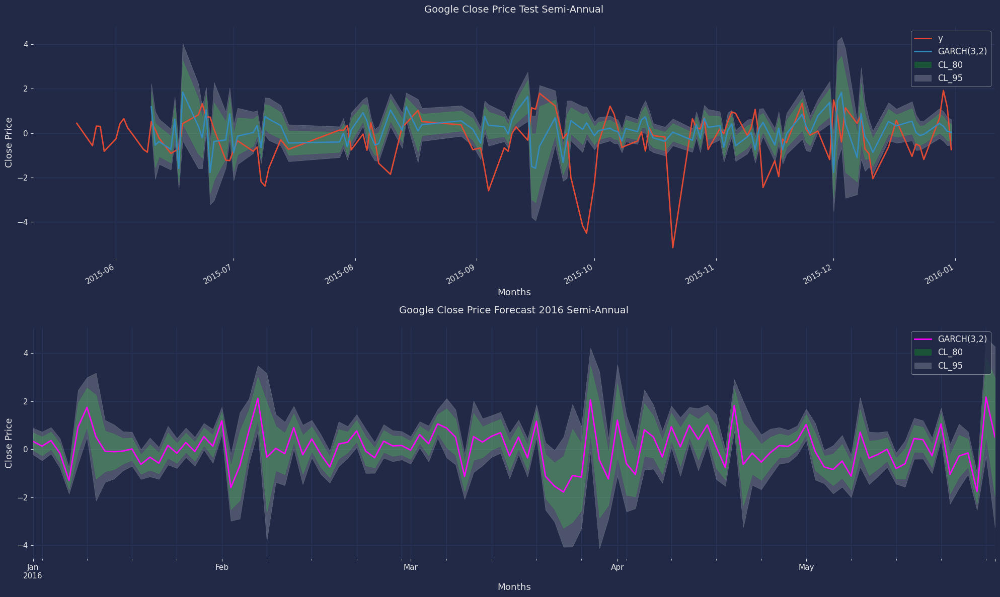

In [99]:
plot_forecasts(train_GARCH, test_GARCH, forecast_df, overcast2016, models=["GARCH(3,2)"])

## Converting GARCH closing price predictions into returns
googl_returns is unscaled overcast2016. googl_RET is with the true returns. Closing has been detrended but not differenced, allowing for this shorter operation
* log(losing price/previous closing price)

In [337]:
googl_returns = RS_googl_close.inverse_transform(overcast2016[['GARCH(3,2)']]).reshape(-1)
googl_returns = pd.DataFrame({'returns':googl_returns}).set_index(overcast2016.index)
googl_returns

,returns
ds,
2016-01-01,2.716
2016-01-04,1.177
2016-01-05,2.968
2016-01-06,-1.146
2016-01-07,-9.821
...,...
2016-05-25,-2.001
2016-05-26,-1.007
2016-05-27,-13.353


Text(0.5, 1.0, 'Closing Price Unscaled')

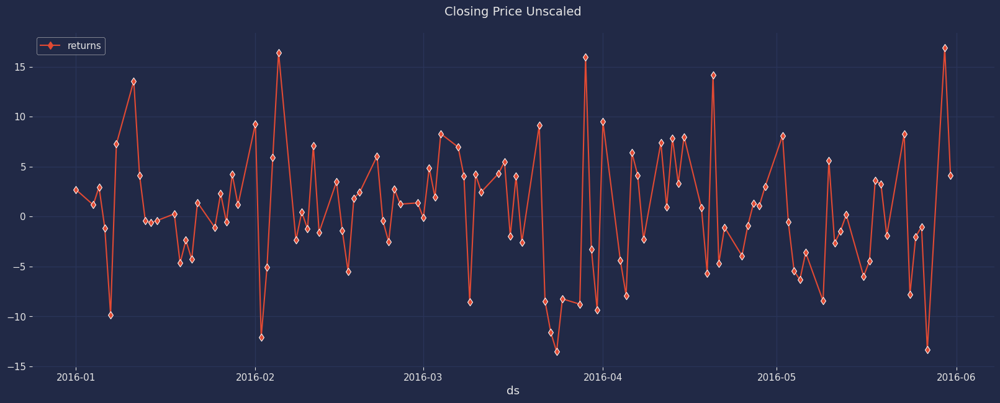

In [338]:
sns.lineplot(googl_returns, markers='d')
plt.title('Closing Price Unscaled')

In [339]:
googl_RET = np.log(googl_returns/googl_returns.shift(1))*100
googl_RET.dropna(inplace=True)
googl_RET

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\internals\blocks.py:366: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


,returns
ds,
2016-01-04,-83.602
2016-01-05,92.504
2016-01-07,214.859
2016-01-11,62.649
2016-01-12,-118.737
2016-01-14,33.071
2016-01-15,-41.497
2016-01-20,-67.749
2016-01-21,59.203


In [340]:
totals = googl_RET.sum()
totals

returns    639.517
dtype: float32

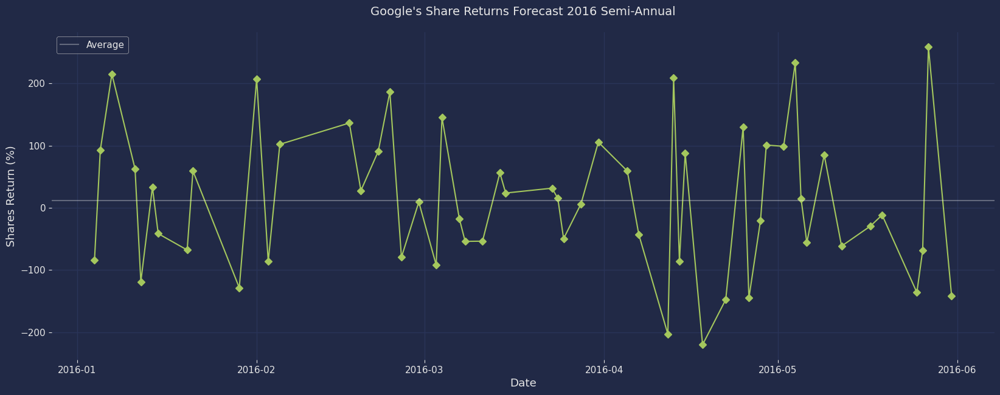

In [424]:
sns.lineplot(googl_RET, markers='d', y='returns', x=googl_RET.index, color='#a4c75d')
plt.plot(googl_RET.index, googl_RET['returns'], 'D', color='#a4c75d') 
plt.axhline(googl_RET['returns'].mean(), alpha=.3, color='white', label='Average')
plt.title('Google\'s Share Returns Forecast 2016 Semi-Annual')
plt.ylabel('Shares Return (%)')
plt.xlabel('Date')
plt.legend()
plt.show()

In [342]:
googl_RET.describe()

,returns
count,55.000
mean,11.628
std,113.573
min,-219.890
25%,-68.195
50%,9.341
75%,91.681
max,258.431


In [343]:
googl_RET.median()

returns    9.341
dtype: float32

## Simulating Google's 2016 forecast for extreme market conditions

In [344]:
overcast2016.tail(2)

,y,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
ds,,,,,,
2016-05-30,NaN,2.174,-0.294,0.560,3.788,4.643
2016-05-31,NaN,0.508,-3.260,-1.956,2.972,4.276


In [345]:
returns.head(2)

,close
2013-01-03,-0.835
2013-01-07,0.029


In [346]:
int = overcast2016.copy(deep=True)
int.rename({'GARCH(3,2)':'close'}, axis=1, inplace=True)
indx = [i for i in returns.index]
for i in overcast2016.index:
    indx.append(i)
returns_test = returns.merge(int['close'], on='close', how='outer').set_index(pd.to_datetime(indx))
returns_test

,close
2013-01-03,-0.835
2013-01-07,0.029
2013-01-08,0.007
2013-01-09,0.391
2013-01-10,0.674
...,...
2016-05-25,-0.285
2016-05-26,-0.156
2016-05-27,-1.762
2016-05-30,2.174


In [347]:
# insert into GARCH model with entire history including forecast
returns_test2 = pd.DataFrame()
returns_test2['close'] = RS_googl_close.inverse_transform(returns_test).reshape(-1)
returns_test2.set_index(returns_test.index, inplace=True)
returns_test2

,close
2013-01-03,-6.229
2013-01-07,0.414
2013-01-08,0.245
2013-01-09,3.194
2013-01-10,5.370
...,...
2016-05-25,-2.001
2016-05-26,-1.007
2016-05-27,-13.353
2016-05-30,16.899


In [348]:
# to specifically plot 2016 forecast
overcastARCH = pd.DataFrame()
overcastARCH['close'] = RS_googl_close.inverse_transform(overcast2016[['GARCH(3,2)']]).reshape(-1)
overcastARCH.set_index(overcast2016.index, inplace=True)
overcastARCH

,close
ds,
2016-01-01,2.716
2016-01-04,1.177
2016-01-05,2.968
2016-01-06,-1.146
2016-01-07,-9.821
...,...
2016-05-25,-2.001
2016-05-26,-1.007
2016-05-27,-13.353


In [444]:
garch_model = arch_model(returns_test2, vol='GARCH', mean='AR', dist='skewstudent', p=1, q=1)
Ores = garch_model.fit(disp="off")
print(Ores.summary())

                                 AR - GARCH Model Results                                
Dep. Variable:                             close   R-squared:                       0.000
Mean Model:                                   AR   Adj. R-squared:                  0.000
Vol Model:                                 GARCH   Log-Likelihood:               -2155.69
Distribution:      Standardized Skew Student's t   AIC:                           4323.38
Method:                       Maximum Likelihood   BIC:                           4350.46
                                                   No. Observations:                  674
Date:                           Sun, Apr 14 2024   Df Residuals:                      673
Time:                                   18:38:18   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
--------------------------------------------

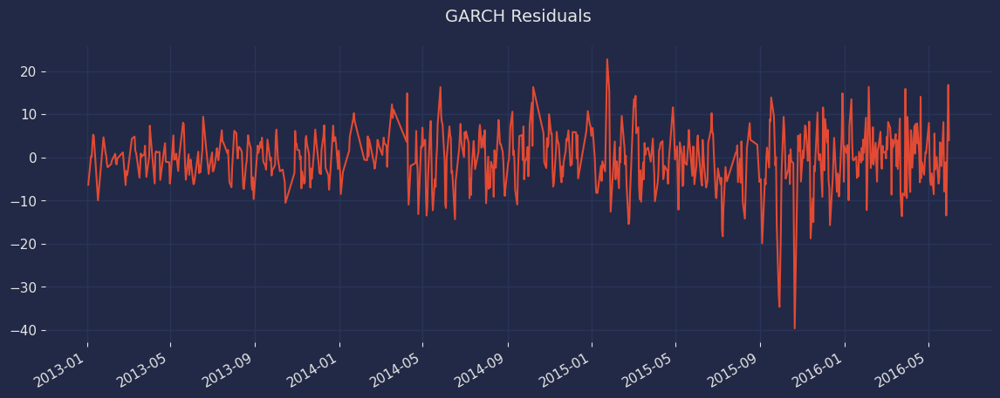

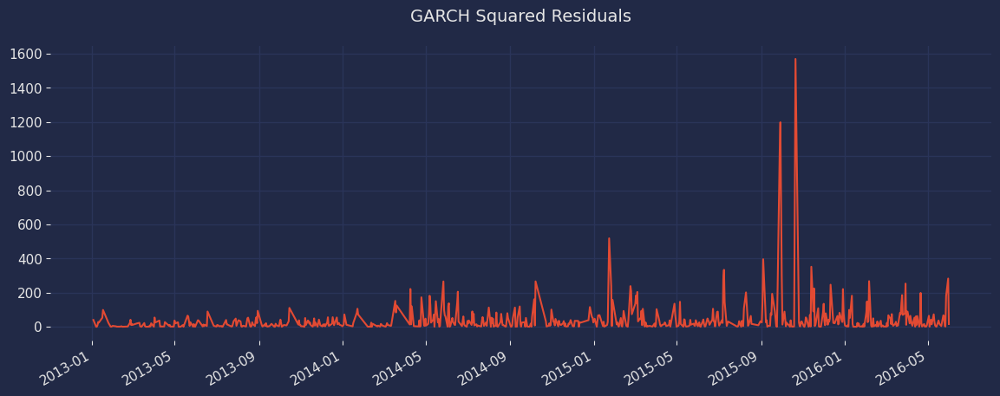

In [445]:
Ores.resid.plot(figsize=(14, 5))
plt.title('GARCH Residuals')
plt.show()
sq = Ores.resid**2
sq.plot(figsize=(14, 5))
plt.title('GARCH Squared Residuals')
plt.show()

In [357]:
res = garch_model.fit(last_obs='2016-01-01', disp="off")
print(res.summary())

                            Constant Mean - ARCH Model Results                           
Dep. Variable:                             close   R-squared:                       0.000
Mean Model:                        Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                  ARCH   Log-Likelihood:               -1808.83
Distribution:      Standardized Skew Student's t   AIC:                           3627.65
Method:                       Maximum Likelihood   BIC:                           3649.35
                                                   No. Observations:                  566
Date:                           Sun, Apr 14 2024   Df Residuals:                      565
Time:                                   18:05:20   Df Model:                            1
                               Mean Model                               
                 coef    std err          t      P>|t|  95.0% Conf. Int.
--------------------------------------------

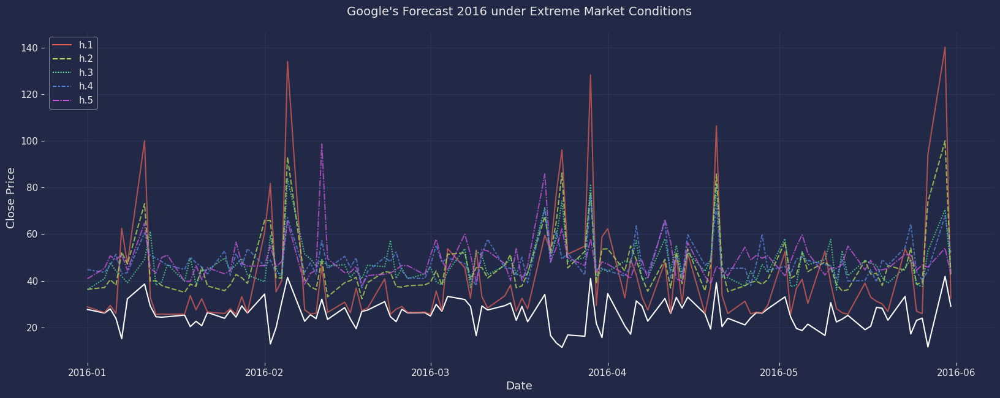

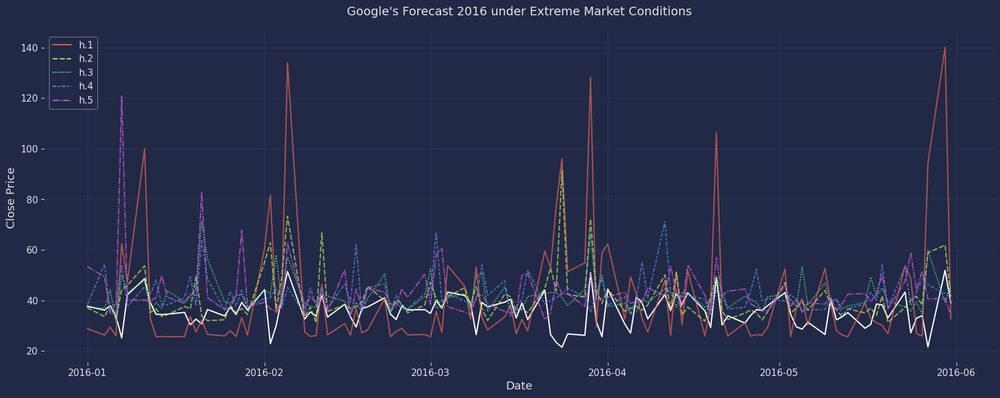

In [503]:
random_state = np.random.RandomState(453)
def scenario_rng(size):
    shocks = random_state.standard_normal(size)
    shocks *= 1.1 # shock magnification of 2014 Q4 for 2015 forecast
    return shocks
std_shocks = res.resid / res.conditional_volatility
shocks = std_shocks["2015-09-01":"2015-12-31"].dropna()

# By using historical shocks as the basis for future simulations, this approach can capture the empirical distribution and characteristics of the historical data,
# which might be more realistic than assuming the model's theoretical distribution (Gaussian).
class ScenarioBootstrapRNG(object):
    def __init__(self, shocks, random_state):
        self._shocks = np.asarray(shocks)
        self._rs = random_state
        self.n = shocks.shape[0]

    def rng(self, size):
        end = self._rs.randint(0, self.n, size=size)
        return self._shocks[end]
        
scenario_forecasts = res.forecast(horizon=5, start='2016-01-01', method='simulation', rng=scenario_rng, simulations=50)
bs_forecasts = res.forecast(horizon=5, start='2016-01-01', method='bootstrap', rng=ScenarioBootstrapRNG.rng, simulations=50)
bs = bs_forecasts.residual_variance.dropna()
sc = scenario_forecasts.residual_variance.dropna()
sns.lineplot(overcastARCH+25, x=overcastARCH.index, y='close', color='white')
sns.lineplot(sc, alpha=0.75, palette='hls')
plt.title('Google\'s Forecast 2016 under Extreme Market Conditions')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.show()
sns.lineplot(overcastARCH+35, x=overcastARCH.index, y='close', color='white')
sns.lineplot(bs, alpha=0.75, palette='hls')
plt.title('Google\'s Forecast 2016 under Extreme Market Conditions')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.show()

In [401]:
overall_avg_sample

,open,close,low,high,volume (thousands)
date,,,,,
2013-01-03,-0.902,-1.171,-0.967,-1.005,269.987
2013-01-04,-1.152,-0.924,-1.160,-1.048,145.796
2013-01-07,-0.899,-1.147,-0.973,-1.132,-95.296
2013-01-08,-1.002,-1.341,-1.175,-1.156,49.310
2013-01-09,-1.355,-1.044,-1.098,-1.130,65.616
...,...,...,...,...,...
2015-12-24,-0.955,-0.744,-0.993,-0.955,-1554.266
2015-12-28,-1.119,-0.828,-0.817,-1.329,-905.196
2015-12-29,-0.303,-0.242,-0.091,-0.383,-849.127


## Overall Stock Performance and Forecasting

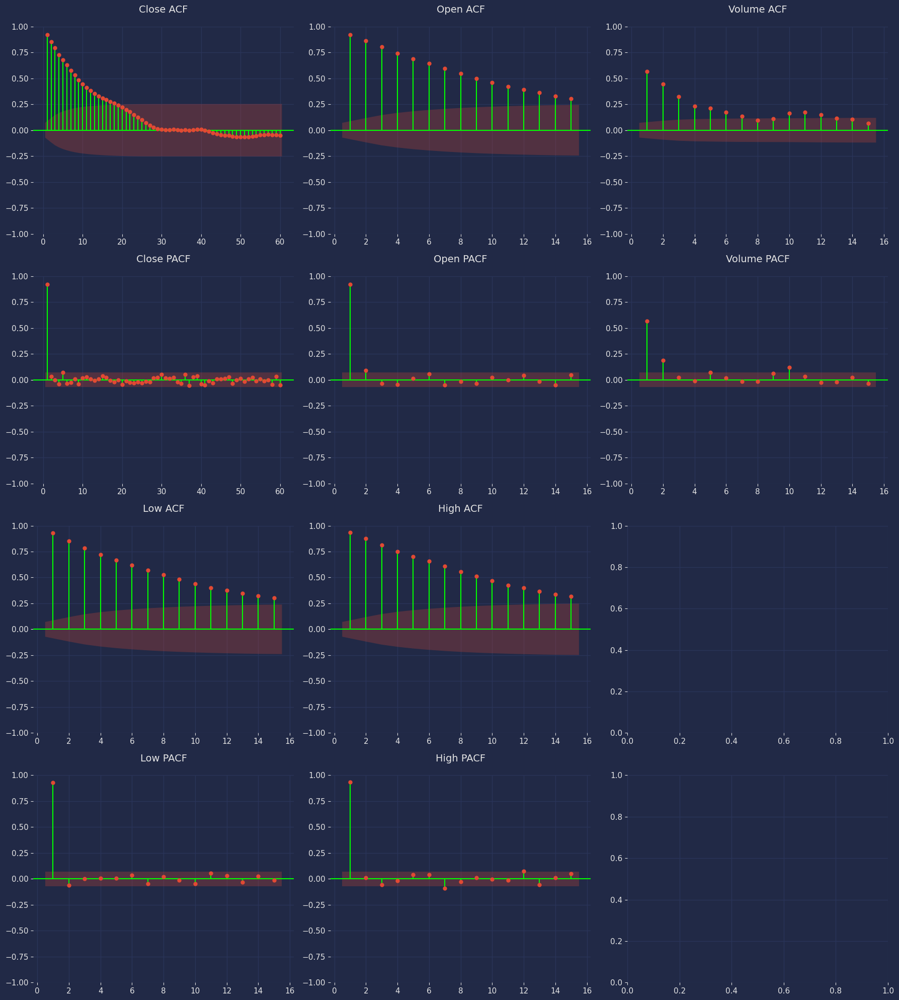

In [942]:
fig, ax = plt.subplots(4, 3, figsize=(18, 20))

plot_acf(overall_avg_sample['close'],lags=60, ax=ax[0,0], zero=False)
plot_pacf(overall_avg_sample['close'],lags=60, ax=ax[1,0], zero=False)
ax[0,0].set_title('Close ACF')
ax[1,0].set_title('Close PACF')

plot_acf(overall_avg_sample['open'],lags=15, ax=ax[0,1], zero=False)
plot_pacf(overall_avg_sample['open'],lags=15, ax=ax[1,1], zero=False)
ax[0,1].set_title('Open ACF')
ax[1,1].set_title('Open PACF')

plot_acf(pricesOG_v2['volume (thousands)'],lags=15, ax=ax[0,2], zero=False)
plot_pacf(pricesOG_v2['volume (thousands)'],lags=15, ax=ax[1,2], zero=False)
ax[0,2].set_title('Volume ACF')
ax[1,2].set_title('Volume PACF')

plot_acf(overall_avg_sample['low'],lags=15, ax=ax[2,0], zero=False)
plot_pacf(overall_avg_sample['low'],lags=15, ax=ax[3,0], zero=False)
ax[2,0].set_title('Low ACF')
ax[3,0].set_title('Low PACF')

plot_acf(overall_avg_sample['high'],lags=15, ax=ax[2,1], zero=False)
plot_pacf(overall_avg_sample['high'],lags=15, ax=ax[3,1], zero=False)
ax[2,1].set_title('High ACF')
ax[3,1].set_title('High PACF')


plt.tight_layout()
plt.show()

In [224]:
prices_scaled, RS_prices = RSstandardize(pricesOG_v2[['volume (thousands)']])

In [260]:
ar_model = ARIMA(prices_scaled, order=(1, 0, 1), seasonal_order=(0, 0, 1, 3)).fit()
pred = ar_model.predict(start=529, end=755)
print(ar_model.summary())

                                    SARIMAX Results                                    
Dep. Variable:                               y   No. Observations:                  755
Model:             ARIMA(1, 0, 1)x(0, 0, 1, 3)   Log Likelihood                -884.119
Date:                         Mon, 15 Apr 2024   AIC                           1778.239
Time:                                 17:37:56   BIC                           1801.372
Sample:                                      0   HQIC                          1787.150
                                         - 755                                         
Covariance Type:                           opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0678      0.098      0.689      0.491      -0.125       0.261
ar.L1          0.7833      0.038     20.727      0.000     

In [270]:
train = RS_prices.inverse_transform(prices_scaled[:528].reshape(-1, 1)).reshape(-1)
pred_plot_prices = RS_prices.inverse_transform(pred.reshape(-1, 1)).reshape(-1)

# converting scaled array into unscaled dataframe for chart
conversion = pd.DataFrame({'date':prices_v2.index})
plot_prices = pd.DataFrame({'date':conversion['date'].unique()})
plot_prices['volume'] = RS_prices.inverse_transform(prices_scaled.reshape(-1, 1)).reshape(-1)
plot_prices

,date,volume
0,2013-01-03,2629.9
1,2013-01-04,2504.8
2,2013-01-07,2262.8
3,2013-01-08,2406.5
4,2013-01-09,2421.9
...,...,...
750,2015-12-24,799.2
751,2015-12-28,1449.2
752,2015-12-29,1506.2
753,2015-12-30,1385.5


In [262]:
print(plot_prices.iloc[528, 1] - pred_plot_prices[0])
print(plot_prices.iloc[-1, 1] - pred_plot_prices[-1])

residuals_prices = plot_prices.iloc[528:, 1] - pred_plot_prices 
residuals_prices

-74.26104375083241
-169.53499693209915


528    -74.261
529     12.717
530   -124.512
531    -14.056
532     65.531
        ...   
750   -756.379
751   -204.157
752   -229.439
753   -286.922
754   -169.535
Name: volume, Length: 227, dtype: float64

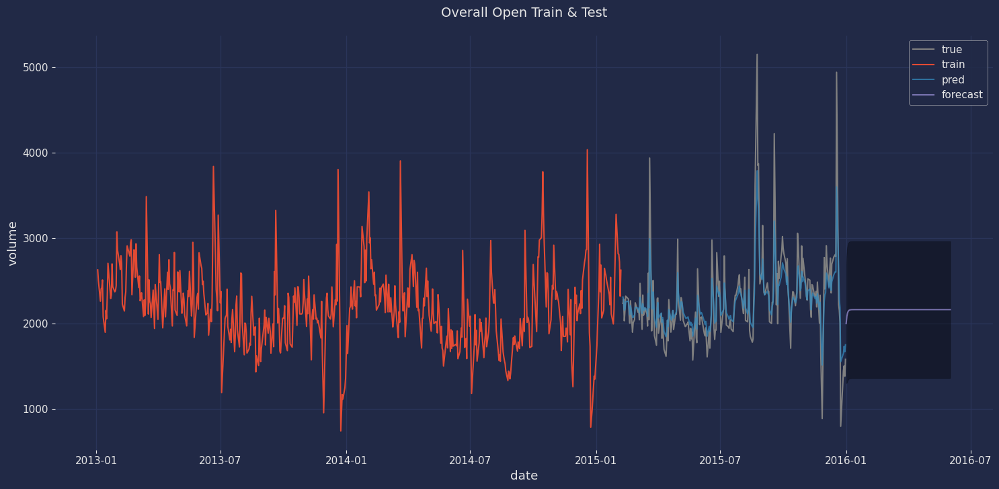

In [263]:
fcast = forecast.summary_frame(alpha=0.05)
OFcast = RS_prices.inverse_transform(fcast)

fig, axs = plt.subplots(1, 1, figsize=(18, 8))
sns.lineplot(x=plot_prices.iloc[528:, 0], y=plot_prices.iloc[528:, 1], label='true', color='gray', ax=axs)
sns.lineplot(x=plot_prices.iloc[:528, 0], y=train, label='train', ax=axs)
sns.lineplot(x=plot_prices.iloc[528:, 0], y=pred_plot_prices, label='pred', alpha=0.75, ax=axs)
sns.lineplot(x=dates, y=OFcast[:, 0], label='forecast', alpha=0.75, ax=axs)
axs.fill_between(dates, 
                OFcast[:, 2], 
                OFcast[:, 3],
                alpha=.35,
                color='black',
                label='CI 95%')
axs.set_title('Overall Open Train & Test')
plt.show()

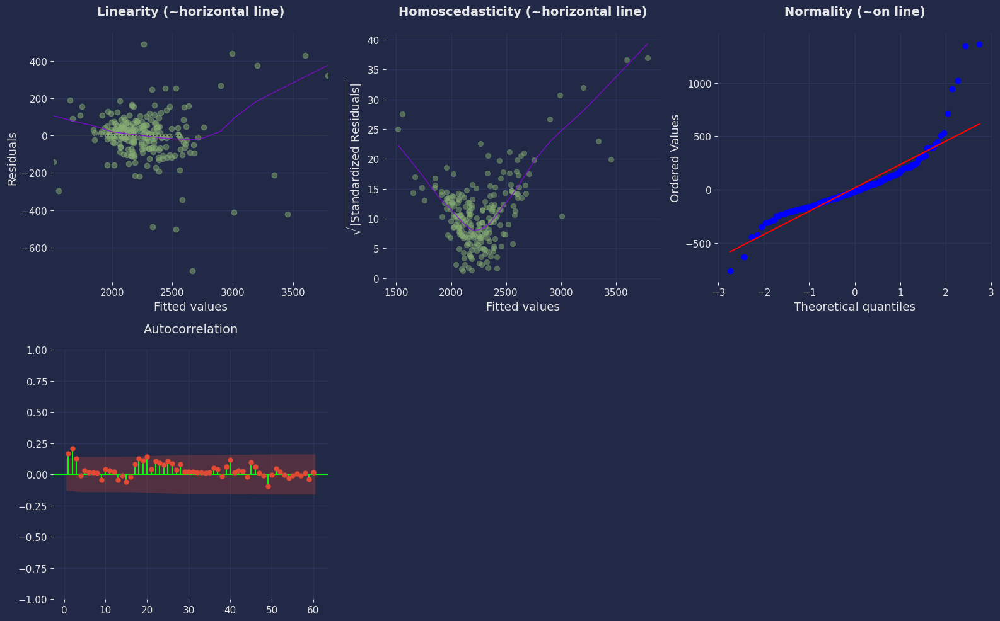

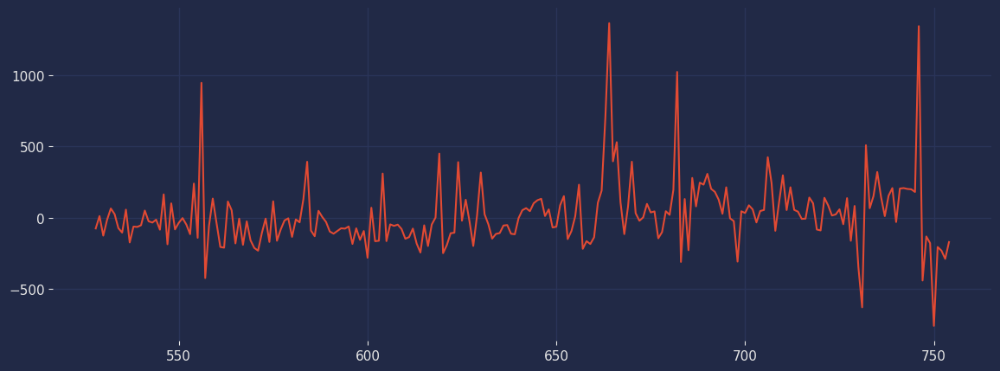

In [264]:
diagnostic_plots(pred_plot_prices, residuals_prices)

In [273]:
OVOL = pd.DataFrame({'date':pd.date_range(start='2016-01-01', end='2016-06-01'), 'arima':OFcast[:, 0], 'high':OFcast[:,2], 'low':OFcast[:, 3]})
forecastOVOL = plot_prices.copy(deep=True)
forecastOVOL = pd.concat([forecastOVOL, OVOL], axis=0)
forecastOVOL

,date,volume,arima,high,low
0,2013-01-03,2629.9,NaN,NaN,NaN
1,2013-01-04,2504.8,NaN,NaN,NaN
2,2013-01-07,2262.8,NaN,NaN,NaN
3,2013-01-08,2406.5,NaN,NaN,NaN
4,2013-01-09,2421.9,NaN,NaN,NaN
...,...,...,...,...,...
148,2016-05-28,NaN,2164.788,1364.325,2965.25
149,2016-05-29,NaN,2164.788,1364.325,2965.25
150,2016-05-30,NaN,2164.788,1364.325,2965.25
151,2016-05-31,NaN,2164.788,1364.325,2965.25


C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\4212855439.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs.set_xticklabels(axs.get_xticklabels(), rotation=0, ha='center')


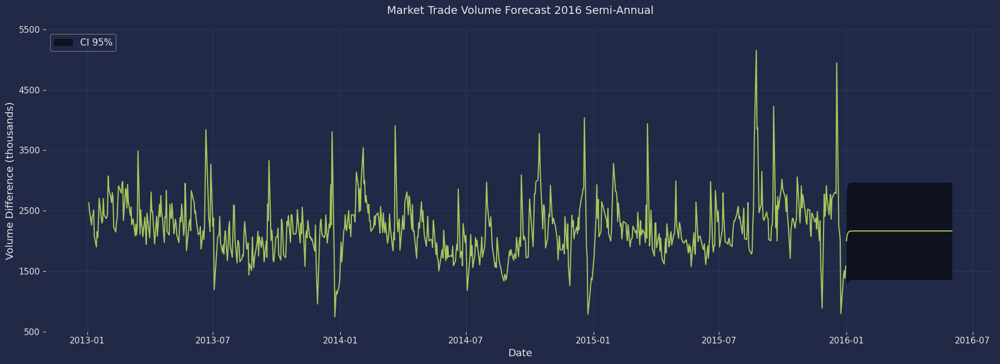

In [308]:
fig, axs = plt.subplots(1,1,figsize=(22, 8))
plot_prices.plot(y='volume', x='date', color='#a4c75d', ax=axs, label='_nolegend_')
forecastOVOL.plot(y='arima', x='date', color='#a4c75d', ax=axs, label='_nolegend_')
axs.fill_between(forecastOVOL['date'], 
                forecastOVOL['high'], 
                forecastOVOL['low'],
                alpha=.55,
                color='black',
                label='CI 95%')
axs.legend(prop={'size': 12}, loc='upper left')
axs.set_title('Market Trade Volume Forecast 2016 Semi-Annual')
axs.set_ylabel('Volume Difference (thousands)')
axs.set_xlabel('Date')
axs.set_yticks(range(500, 6500, 1000))
axs.set_xticklabels(axs.get_xticklabels(), rotation=0, ha='center')
plt.show()

## Forecasting volatility of overall close prices via GARCH model

In [370]:
returns = pd.DataFrame({'close':prices_scaled.reshape(-1)})
returns.index = pricesOG_v2.index
garch_model = arch_model(returns, vol='GARCH', mean='AR', dist='skewstudent', p=1, q=1, lags=5)
Ores = garch_model.fit(disp="off")
print(Ores.summary())

                                 AR - GARCH Model Results                                
Dep. Variable:                             close   R-squared:                       0.340
Mean Model:                                   AR   Adj. R-squared:                  0.336
Vol Model:                                 GARCH   Log-Likelihood:               -737.553
Distribution:      Standardized Skew Student's t   AIC:                           1497.11
Method:                       Maximum Likelihood   BIC:                           1547.93
                                                   No. Observations:                  750
Date:                           Mon, Apr 15 2024   Df Residuals:                      744
Time:                                   18:18:12   Df Model:                            6
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
----------------------------------

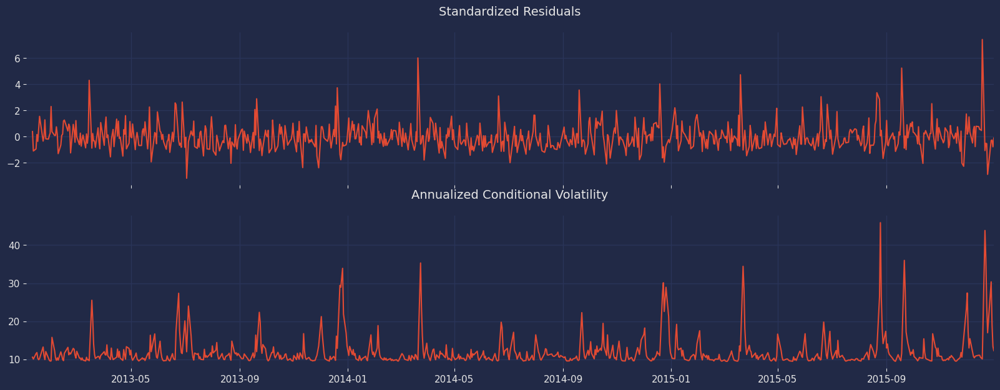

In [371]:
Ores.plot(annualize="D")
plt.show()

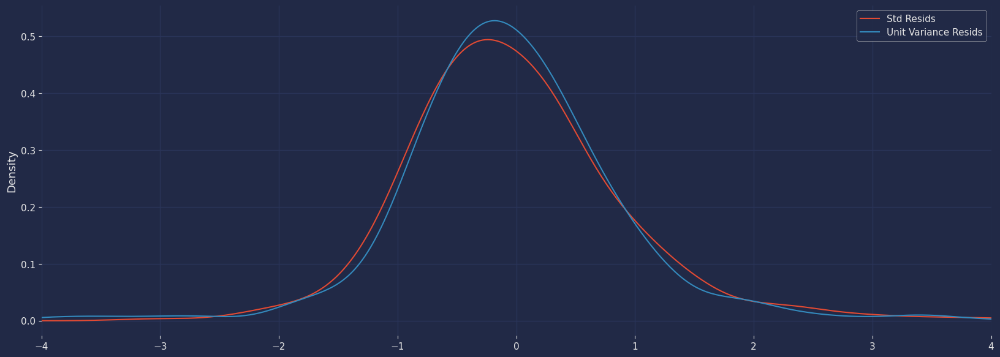

In [372]:
std_resid = Ores.resid / Ores.conditional_volatility
unit_var_resid = Ores.resid / Ores.resid.std()
df = pd.DataFrame({"Std Resids": std_resid, "Unit Variance Resids":unit_var_resid})
subplot = df.plot(kind="kde", xlim=(-4, 4))

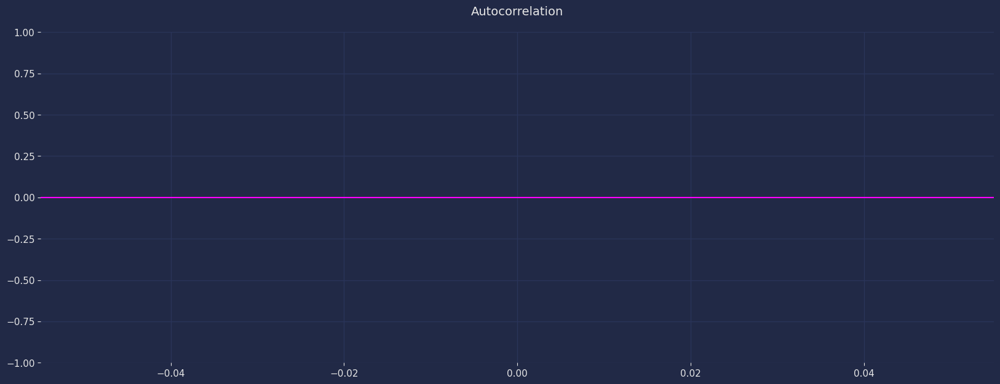

In [373]:
plot_acf(Ores.resid, lags=35, color="fuchsia")
plt.show()

In [374]:
res = garch_model.fit(last_obs='2014-12-31', disp="off")
print(res.summary())

                                 AR - GARCH Model Results                                
Dep. Variable:                             close   R-squared:                       0.369
Mean Model:                                   AR   Adj. R-squared:                  0.362
Vol Model:                                 GARCH   Log-Likelihood:               -485.861
Distribution:      Standardized Skew Student's t   AIC:                           993.722
Method:                       Maximum Likelihood   BIC:                           1040.02
                                                   No. Observations:                  497
Date:                           Mon, Apr 15 2024   Df Residuals:                      491
Time:                                   18:18:24   Df Model:                            6
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
----------------------------------

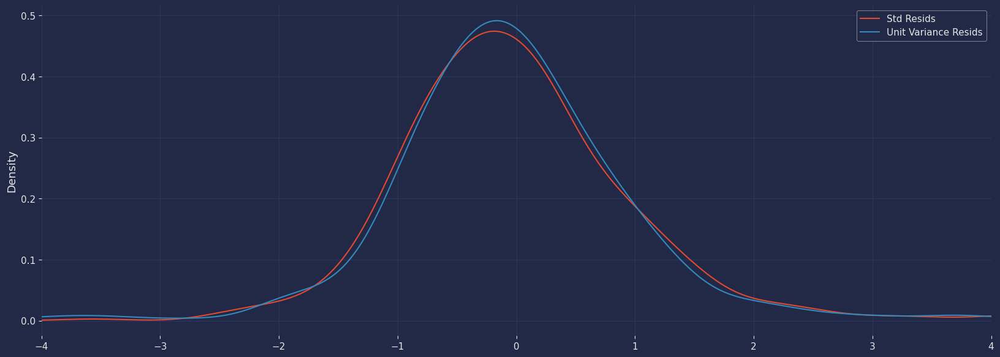

In [375]:
std_resid = res.resid / res.conditional_volatility
unit_var_resid = res.resid / res.resid.std()
df = pd.DataFrame({"Std Resids": std_resid, "Unit Variance Resids":unit_var_resid})
subplot = df.plot(kind="kde", xlim=(-4, 4))

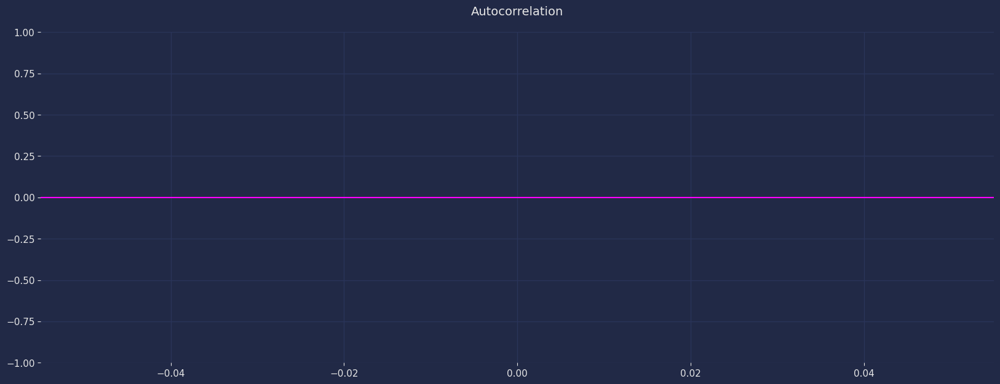

In [376]:
plot_acf(res.resid, lags=35, color="fuchsia")
plt.show()

In [377]:
split_date = '2015-01-01'
# 10 horizons to witness varying time periods' individual effect on volatility
# 5000 simulations to prevent obtaining identical results to the recusive analytics (default) method
sim_forecasts = res.forecast(horizon=10, start=split_date, method='simulation', simulations=1000)
print(sim_forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50))

             h.01   h.02   h.03   h.04   h.05   h.06   h.07   h.08   h.09  \
date                                                                        
2015-08-24  6.836  3.055  1.499  0.902  0.656  0.640  0.584  0.564  0.546   
2015-12-18  6.614  3.207  2.250  1.388  0.852  0.736  0.608  0.591  0.593   
2015-09-18  4.473  2.103  1.142  0.766  0.612  0.614  0.544  0.531  0.548   
2015-03-20  4.134  2.020  1.090  0.805  0.684  0.588  0.592  0.568  0.553   
2015-12-21  3.822  2.096  1.099  0.831  0.600  0.558  0.539  0.558  0.551   
...           ...    ...    ...    ...    ...    ...    ...    ...    ...   
2015-09-30  0.580  0.568  0.554  0.603  0.599  0.601  0.662  0.548  0.548   
2015-05-01  0.580  0.555  0.560  0.573  0.590  0.562  0.558  0.547  0.544   
2015-01-13  0.573  0.558  0.536  0.535  0.551  0.556  0.563  0.550  0.524   
2015-10-26  0.572  0.542  0.529  0.559  0.558  0.553  0.534  0.547  0.559   
2015-07-02  0.571  0.543  0.537  0.549  0.550  0.524  0.560  0.581  0.563   

In [378]:
forecasts = res.forecast(horizon=10, start=split_date)
print(forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50))

             h.01   h.02   h.03   h.04   h.05   h.06   h.07   h.08   h.09  \
date                                                                        
2015-08-24  6.836  3.195  1.664  1.021  0.751  0.638  0.590  0.570  0.561   
2015-12-18  6.614  3.101  1.625  1.005  0.744  0.635  0.589  0.569  0.561   
2015-09-18  4.473  2.202  1.247  0.846  0.677  0.607  0.577  0.564  0.559   
2015-03-20  4.134  2.059  1.187  0.821  0.667  0.602  0.575  0.564  0.559   
2015-12-21  3.822  1.928  1.132  0.798  0.657  0.598  0.573  0.563  0.558   
...           ...    ...    ...    ...    ...    ...    ...    ...    ...   
2015-09-30  0.580  0.566  0.560  0.557  0.556  0.556  0.555  0.555  0.555   
2015-05-01  0.580  0.566  0.560  0.557  0.556  0.556  0.555  0.555  0.555   
2015-01-13  0.573  0.563  0.558  0.557  0.556  0.555  0.555  0.555  0.555   
2015-10-26  0.572  0.562  0.558  0.556  0.556  0.555  0.555  0.555  0.555   
2015-07-02  0.571  0.562  0.558  0.556  0.556  0.555  0.555  0.555  0.555   

In [379]:
volatile_dates = forecasts.residual_variance.dropna().sort_values(by='h.01', ascending=False).head(50).index
volatile_dates.sort_values()

DatetimeIndex(['2015-01-05', '2015-01-06', '2015-01-09', '2015-01-13',
               '2015-01-29', '2015-01-30', '2015-03-18', '2015-03-20',
               '2015-03-23', '2015-03-24', '2015-03-27', '2015-04-30',
               '2015-05-01', '2015-05-29', '2015-06-01', '2015-06-19',
               '2015-06-22', '2015-06-26', '2015-07-02', '2015-07-07',
               '2015-08-12', '2015-08-13', '2015-08-20', '2015-08-21',
               '2015-08-24', '2015-08-25', '2015-08-26', '2015-08-28',
               '2015-09-01', '2015-09-18', '2015-09-21', '2015-09-22',
               '2015-09-23', '2015-09-24', '2015-09-30', '2015-10-12',
               '2015-10-22', '2015-10-26', '2015-10-28', '2015-11-25',
               '2015-11-27', '2015-11-30', '2015-12-01', '2015-12-03',
               '2015-12-18', '2015-12-21', '2015-12-22', '2015-12-23',
               '2015-12-24', '2015-12-28'],
              dtype='datetime64[ns]', name='date', freq=None)

### Forecast efficacy evaluation
The peak discrepencies of period 1 occurs occurs on 03/20 with a residual variance of 5.1 - on the other hand, period 2's peak is 08/24 of 14.8. It's apparent the model is less accurate on days of higher volatility. The Annualized Conditional Volatility line chart above depicts swings in the July and after. Since this GARCH model doesn't prioritize accuracy of outliers and instead maintains a degree sensitivity towards the main distribution, swings can be under-weighted and result in misinterpeting returns. Expectations for these scenarios must accomadate this nature, and any perceived risk notated from outliers are benefitted from projecing extra-value upon each.

### Shock evaluation
The second half of year 2014 shows eratic behavor which has implications regarding investment strategies. If shocks in the pivotal end-of-year Q4 are of greater value from exogenous market variables that persist longer than a short-term event, like a financial crisis or interest rate hikes, what would the associated risk be quantified as? For mitigating losses when such a scenario arises, I'm keen towards designing a Monte Carlo simulation that can portray a systematic wide effect on the 2015 forecast from these shocks. The true dataset, average of Monte Carlo simulation, and original forecast are plotted along with others for valuable insights.

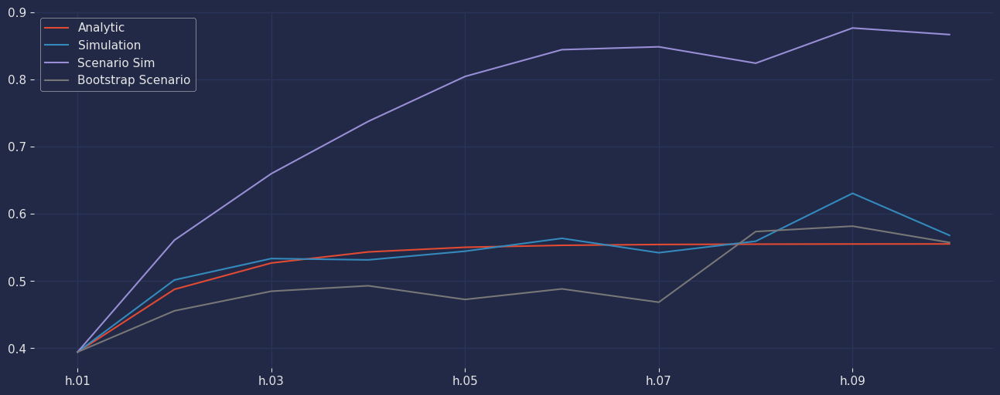

In [380]:
random_state = np.random.RandomState(8)
def scenario_rng(size):
    shocks = random_state.standard_normal(size)
    shocks *= 1.3 # shock magnification of 2014 Q4 for 2015 forecast
    return shocks
std_shocks = res.resid / res.conditional_volatility
shocks = std_shocks["2014-09-01":"2014-12-31"].dropna()

# By using historical shocks as the basis for future simulations, this approach can capture the empirical distribution and characteristics of the historical data,
# which might be more realistic than assuming the model's theoretical distribution (Gaussian).
class ScenarioBootstrapRNG(object):
    def __init__(self, shocks, random_state):
        self._shocks = np.asarray(shocks)
        self._rs = random_state
        self.n = shocks.shape[0]

    def rng(self, size):
        end = self._rs.randint(0, self.n, size=size)
        return self._shocks[end]
        
scenario_forecasts = res.forecast(horizon=10, start=split_date, method='simulation', rng=scenario_rng, simulations=1000)
scenario_bootstrap = ScenarioBootstrapRNG(shocks, random_state)
bs_forecasts = res.forecast(horizon=10, start=split_date, method='bootstrap', rng=scenario_bootstrap.rng, simulations=100)

df = pd.concat(
    [
        forecasts.residual_variance.iloc[-1],
        sim_forecasts.residual_variance.iloc[-1],
        scenario_forecasts.residual_variance.iloc[-1],
        bs_forecasts.residual_variance.iloc[-1],
    ],
    axis=1,
)
df.columns = ["Analytic", "Simulation", "Scenario Sim", "Bootstrap Scenario"]

subplot = df.plot(figsize=(16,6))
plt.show()

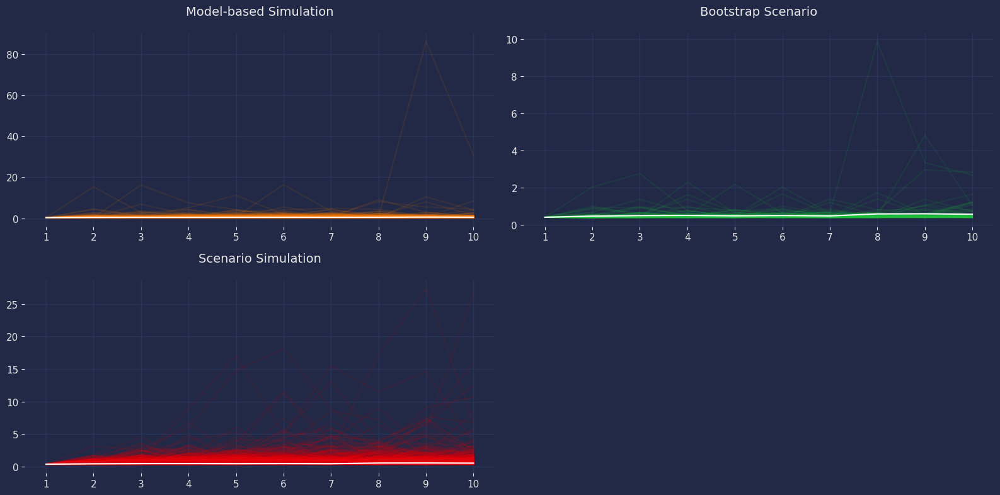

In [381]:
fig, axes = plt.subplots(2, 2, figsize=(16,8))
axes = axes.flatten()
colors = sns.color_palette("bright")

# The paths for the final observation
# Analytic version (default) has a single path from recursive formula
sim_paths = sim_forecasts.simulations.residual_variances[-1].T
bs_paths = bs_forecasts.simulations.residual_variances[-1].T
simS_paths = scenario_forecasts.simulations.residual_variances[-1].T

x = np.arange(1, 11)
# Plot the paths and the mean, set the axis to have the same limit
# .plot(x, np.sqrt(252 * bs_paths) to scale a daily volatility into annualized for 252 trading days
# also .plot(x, np.sqrt(252 * bs_forecasts.residual_variance.iloc[-1])
axes[0].plot(x, sim_paths, color=colors[1], alpha=0.1)
axes[0].plot(
    x, sim_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[0].set_title("Model-based Simulation")
axes[0].set_xticks(np.arange(1, 11))

axes[1].plot(x, bs_paths, color=colors[2], alpha=0.1)
axes[1].plot(
    x, bs_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[1].set_xticks(np.arange(1, 11))
title = axes[1].set_title("Bootstrap Scenario")

axes[2].plot(x, simS_paths, color=colors[3], alpha=0.1)
axes[2].plot(
    x, bs_forecasts.residual_variance.iloc[-1], color="white", alpha=1
)
axes[2].set_xticks(np.arange(1, 11))
title = axes[2].set_title("Scenario Simulation")

fig.delaxes(axes[3])
plt.tight_layout()
plt.show()

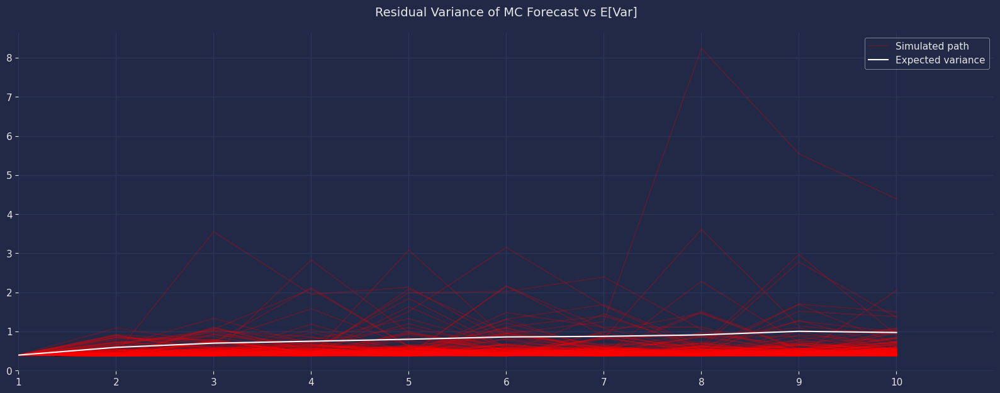

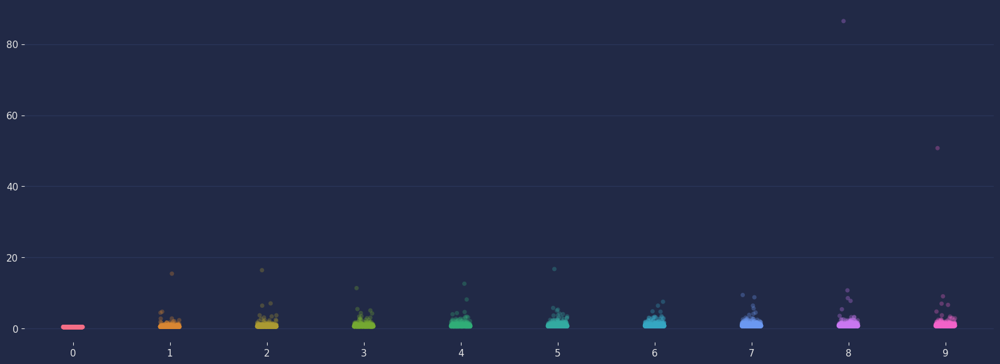

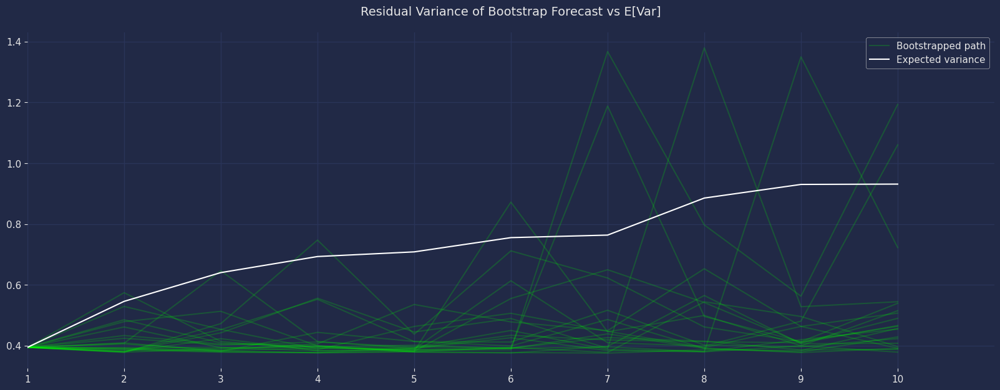

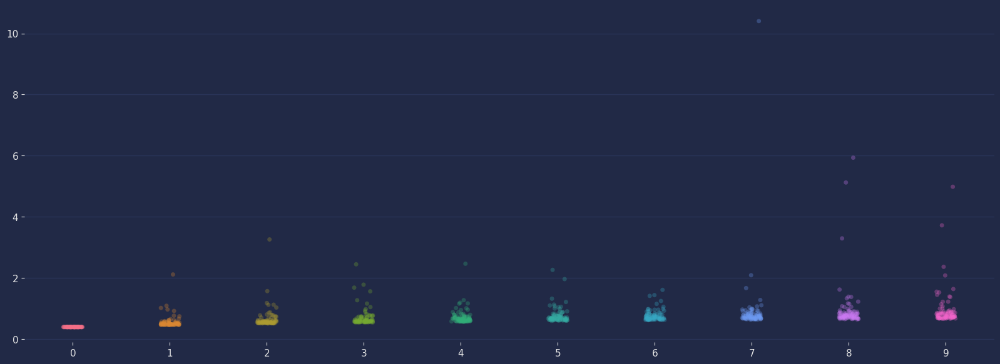

In [382]:
sims = sim_forecasts.simulations

x = np.arange(1, 11)
lines = plt.plot(x, sims.residual_variances[-1, ::5].T, color="red", alpha=0.2)
lines[0].set_label("Simulated path")
line = plt.plot(x, sim_forecasts.variance.iloc[-1].values, color="white")
line[0].set_label("Expected variance")
plt.gca().set_xticks(x)
plt.gca().set_xlim(1, 11)
legend = plt.legend()
plt.title('Residual Variance of MC Forecast vs E[Var]')
plt.show()
sns.stripplot(data=sims.variances[-1], alpha=0.3)
plt.show()

sims = bs_forecasts.simulations

lines = plt.plot(x, sims.residual_variances[-1, ::5].T, color="lime", alpha=0.2)
lines[0].set_label("Bootstrapped path")
line = plt.plot(x, bs_forecasts.variance.iloc[-1].values, color="white")
line[0].set_label("Expected variance")
plt.gca().set_xticks(x)
plt.gca().set_xlim(1, 11)
legend = plt.legend()
plt.title('Residual Variance of Bootstrap Forecast vs E[Var]')
plt.show()
sns.stripplot(data=sims.variances[-1], alpha=0.3)
plt.show()

C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1613: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plot_fn(x_values, y_values, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1628: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  line = plot_fn(temp_x, temp_y, linewidth=3, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\Programs\Python\Python312\Lib\site-packages\arch\univariate\base.py:1613: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "o" (-> marker='o'). The keyword argument will take precedence.
  plot_fn(x_values, y_values, linestyle="-", marker="")
C:\Users\tekre\AppData\Local\P

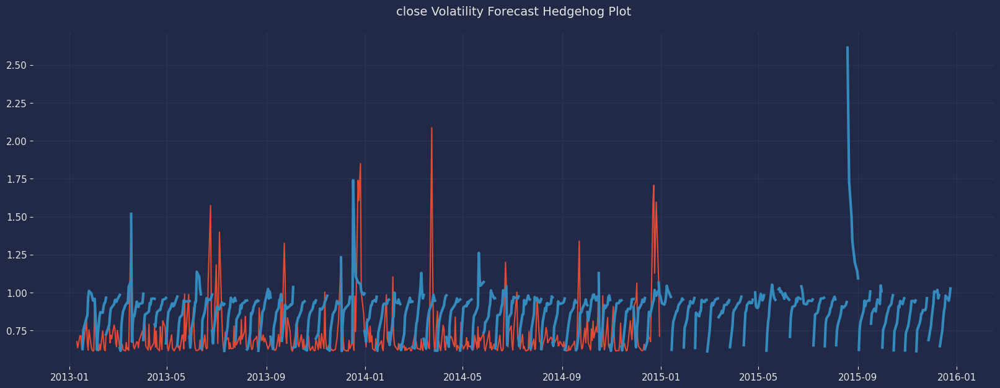

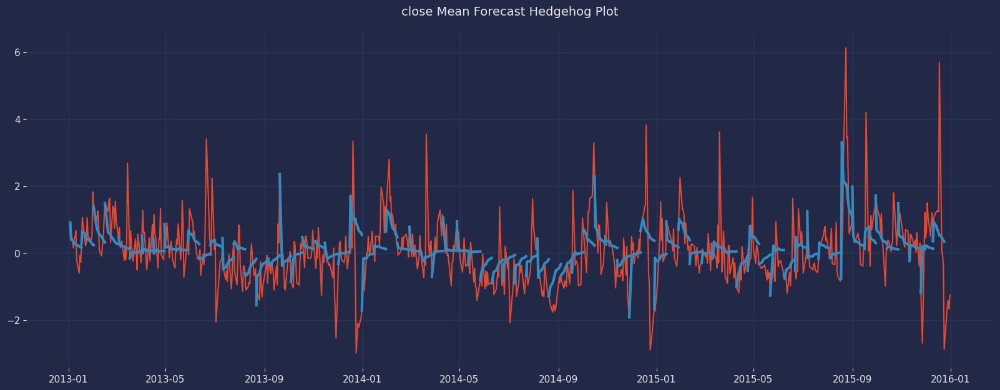

In [385]:
fig = res.hedgehog_plot(plot_type='volatility', horizon=10, method='simulation', simulations=100)
fig = res.hedgehog_plot(plot_type='mean', horizon=10, method='simulation', simulations=100)

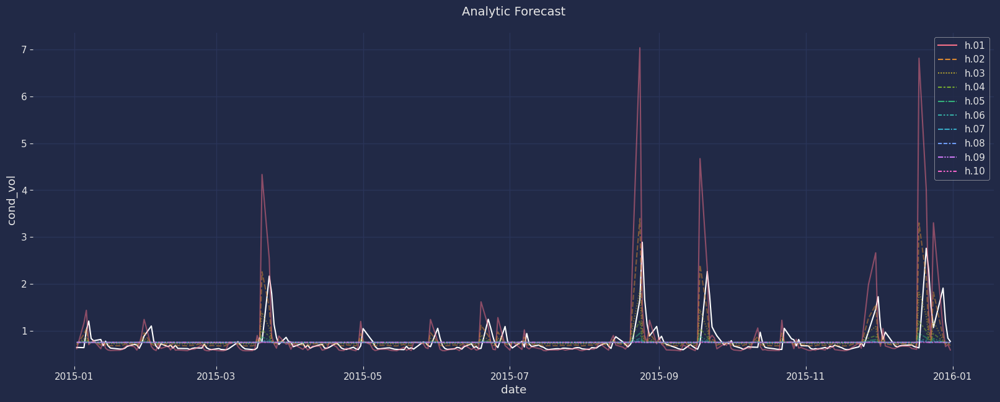

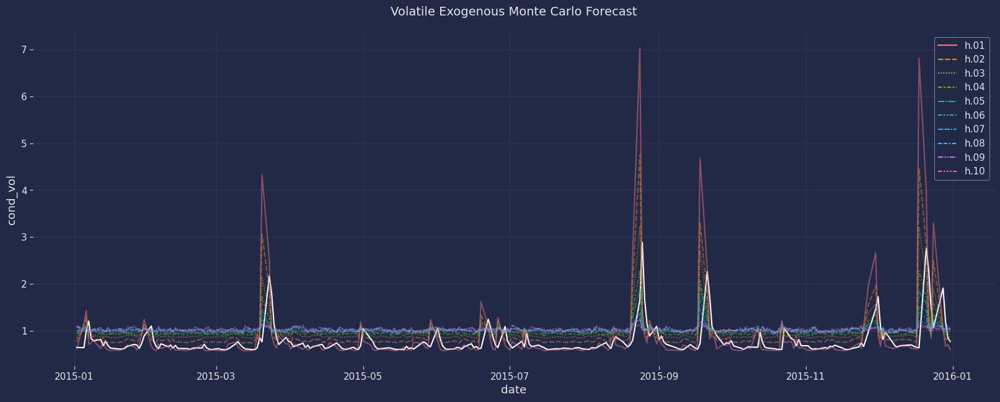

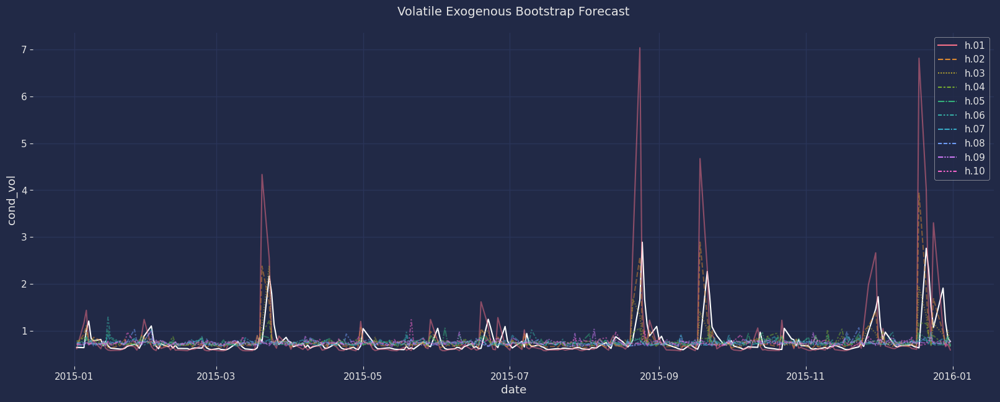

In [384]:
analytic = forecasts.residual_variance.dropna()
bs = bs_forecasts.residual_variance.dropna()
sc = scenario_forecasts.residual_variance.dropna()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(analytic+.2, alpha=0.5)
plt.title('Analytic Forecast')
plt.show()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(sc+.2, alpha=0.5)
plt.title('Volatile Exogenous Monte Carlo Forecast')
plt.show()
sns.lineplot(Ores.conditional_volatility["2015-01-01":"2015-12-31"], color='white')
sns.lineplot(bs+.2, alpha=0.5)
plt.title('Volatile Exogenous Bootstrap Forecast')
plt.show()

## Forecasting overall NYSE closing prces

In [427]:
overall_avg_sample.head(2)

,open,close,low,high,volume (thousands)
date,,,,,
2013-01-03,-0.902,-1.171,-0.967,-1.005,166.767
2013-01-04,-1.152,-0.924,-1.160,-1.048,69.051


In [428]:
ljung_res = acorr_ljungbox(overall_avg_sample['close'], lags=60, boxpierce=True)
ljung_res.sort_values(by='lb_pvalue')

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
30,4394.962,0.000e+00,4346.099,0.000e+00
33,4395.012,0.000e+00,4346.147,0.000e+00
34,4395.035,0.000e+00,4346.169,0.000e+00
35,4395.036,0.000e+00,4346.170,0.000e+00
36,4395.061,0.000e+00,4346.193,0.000e+00
...,...,...,...,...
27,4394.315,0.000e+00,4345.478,0.000e+00
28,4394.831,0.000e+00,4345.973,0.000e+00
16,4100.010,0.000e+00,4059.630,0.000e+00
2,1199.825,2.892e-261,1194.337,4.498e-260


In [429]:
ljung_res.sort_values(by='bp_pvalue')

,lb_stat,lb_pvalue,bp_stat,bp_pvalue
30,4394.962,0.000e+00,4346.099,0.000e+00
33,4395.012,0.000e+00,4346.147,0.000e+00
34,4395.035,0.000e+00,4346.169,0.000e+00
35,4395.036,0.000e+00,4346.170,0.000e+00
36,4395.061,0.000e+00,4346.193,0.000e+00
...,...,...,...,...
27,4394.315,0.000e+00,4345.478,0.000e+00
28,4394.831,0.000e+00,4345.973,0.000e+00
16,4100.010,0.000e+00,4059.630,0.000e+00
2,1199.825,2.892e-261,1194.337,4.498e-260


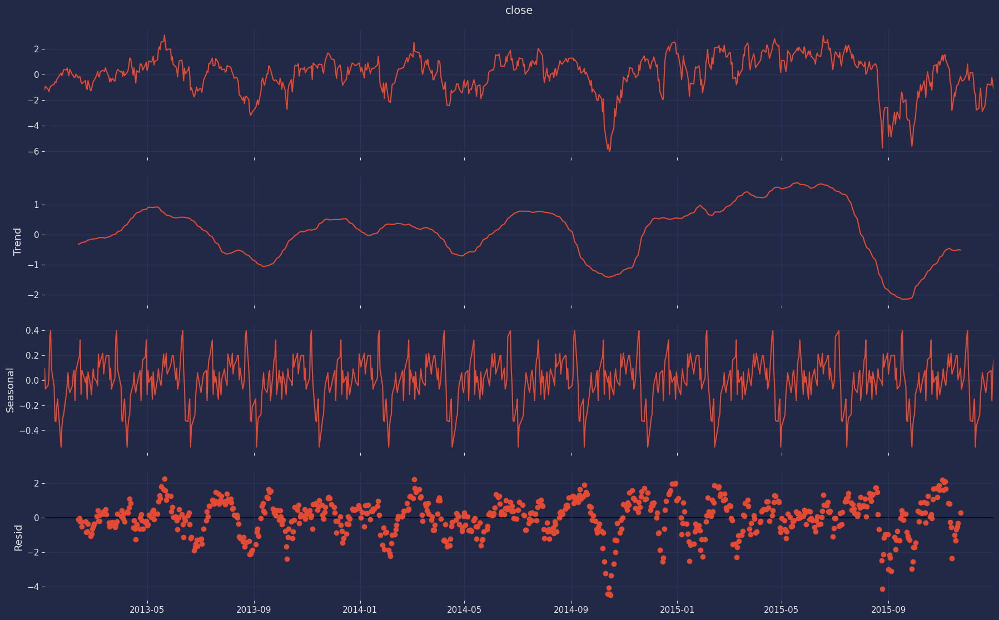

In [964]:
decomp_result = seasonal_decompose(overall_avg_sample['close'], model="additive", period=52)
fig = decomp_result.plot()
fig.set_figwidth(18)
fig.set_figheight(12)
plt.show()

In [961]:
overallS, unscale_overall = SSstandardize(overall_avg_sample[['close']])
train = pd.DataFrame({'unique_id':1, 'ds':overall_avg_sample.iloc[:612].index, 'y':overallS[:612]})
test = pd.DataFrame({'unique_id':1, 'ds':overall_avg_sample.iloc[612:].index, 'y':overallS[612:]})

horizon = len(test)+102
season_length = 52
dfAR = [AutoARIMA(season_length=season_length, alias='Arima', biasadj=True)] #Box-Cox transform with biasadj=True
dfAT = [AutoTheta(season_length=season_length, decomposition_type="additive", model="OTM", alias='Theta')]
dfETS = [AutoETS(model=["Z","Z","Z"], season_length=season_length, alias='ETS')] #Z identifies the optimal parameter
sfAR = StatsForecast(df=train,
                   models=dfAR,
                   freq='C', 
                   n_jobs=-1)
sfAT = StatsForecast(df=train,
                   models=dfAT,
                   freq='C', 
                   n_jobs=-1)
sfETS = StatsForecast(df=train,
                   models=dfETS,
                   freq='C', 
                   n_jobs=-1)
sfAR.fit()
sfAT.fit()
sfETS.fit()

StatsForecast(models=[ETS])

In [962]:
print(arima_string(sfAR.fitted_[0,0].model_))
resultAR=sfAR.fitted_[0,0].model_
print(resultAR.keys())
resultAR

ARIMA(0,1,1)                   
dict_keys(['coef', 'sigma2', 'var_coef', 'mask', 'loglik', 'aic', 'arma', 'residuals', 'code', 'n_cond', 'nobs', 'model', 'bic', 'aicc', 'ic', 'xreg', 'x', 'lambda'])


{'coef': {'ma1': -0.06616356994731447},
 'sigma2': 0.12672197963876056,
 'var_coef': array([[0.00163666]]),
 'mask': array([ True]),
 'loglik': -235.38362791169277,
 'aic': 474.76725582338554,
 'arma': (0, 1, 0, 0, 1, 1, 0),
 'residuals': array([-8.26585620e-04,  1.67028039e-01, -1.40351526e-01, -1.40311554e-01,
         1.92038169e-01,  8.51618574e-02,  5.09675972e-02,  8.26216724e-02,
         1.32197548e-01, -4.08619393e-02,  1.64732749e-01,  7.66004630e-02,
         2.81033622e-01, -1.05606691e-01,  1.22481396e-01,  1.93196371e-01,
        -9.66944595e-03,  1.03070642e-01, -2.23170265e-01, -1.99985055e-01,
         3.34209539e-01, -2.69353990e-01, -6.64837421e-02, -1.01429714e-01,
         4.77891773e-03,  1.67810665e-01, -1.94440854e-01,  5.63250013e-02,
        -1.53227097e-02, -2.81156318e-01, -8.84788541e-02,  1.54875427e-01,
        -3.64840978e-01, -1.21137495e-01,  4.64722294e-01, -5.07111426e-01,
        -1.67475416e-03,  2.96286983e-01,  1.73571670e-01,  7.04964481e-02,
  

In [963]:
resultAT=sfAT.fitted_[0,0].model_
print(resultAT.keys())
resultAT

dict_keys(['mse', 'amse', 'fit', 'residuals', 'm', 'states', 'par', 'n', 'modeltype', 'mean_y', 'fitted'])


{'mse': 114.09780512507756,
 'amse': array([0.12650229, 0.23724207, 0.3468805 ]),
 'fit': results(x=array([-0.41640146,  0.93511571,  1.        ]), fn=114.09780481320429, nit=29, simplex=array([[-0.41438666,  0.9330786 ,  1.        ],
        [-0.41678054,  0.93265971,  1.        ],
        [-0.41330063,  0.93545083,  1.        ],
        [-0.41640146,  0.93511571,  1.        ]])),
 'residuals': array([-4.13293234e-01,  1.40577076e-01, -1.42258690e-01, -1.40255852e-01,
         1.92221262e-01,  8.49280571e-02,  5.08434555e-02,  8.25483907e-02,
         1.32087088e-01, -4.10382218e-02,  1.64773596e-01,  7.63923647e-02,
         2.80922122e-01, -1.05973446e-01,  1.22592700e-01,  1.93046906e-01,
        -9.92629164e-03,  1.03066347e-01, -2.23302407e-01, -1.99708135e-01,
         3.34483347e-01, -2.69763765e-01, -6.61657505e-02, -1.01324031e-01,
         4.91553513e-03,  1.67813419e-01, -1.94655352e-01,  5.65598354e-02,
        -1.53795253e-02, -2.81140406e-01, -8.81181519e-02,  1.55012001

In [947]:
resultETS=sfETS.fitted_[0,0].model_
print(resultETS.keys())
resultETS

dict_keys(['loglik', 'aic', 'bic', 'aicc', 'mse', 'amse', 'fit', 'residuals', 'components', 'm', 'nstate', 'fitted', 'states', 'par', 'sigma2', 'n_params', 'method', 'actual_residuals'])


{'loglik': -1330.3960059635867,
 'aic': 2666.7920119271735,
 'bic': 2680.0422087747106,
 'aicc': 2666.831485611384,
 'mse': 0.1263078729042082,
 'amse': 0.23649376673636668,
 'fit': results(x=array([ 0.93343127, -0.81639623]), fn=2660.7920119271735, nit=34, simplex=array([[ 0.93428331, -0.81202845],
        [ 0.93419331, -0.81928212],
        [ 0.93343127, -0.81639623]])),
 'residuals': array([-1.01902148e-02,  1.66714937e-01, -1.40281925e-01, -1.40363880e-01,
         1.91977837e-01,  8.52356471e-02,  5.10070134e-02,  8.26449462e-02,
         1.32232573e-01, -4.08060468e-02,  1.64719915e-01,  7.66663515e-02,
         2.81069044e-01, -1.05490469e-01,  1.22446345e-01,  1.93243662e-01,
        -9.58802267e-03,  1.03072145e-01, -2.23128405e-01, -2.00072688e-01,
         3.34122680e-01, -2.69224364e-01, -6.65842441e-02, -1.01463340e-01,
         4.73558411e-03,  1.67809716e-01, -1.94372927e-01,  5.62507437e-02,
        -1.53048323e-02, -2.81161336e-01, -8.85931010e-02,  1.54831973e-01,
   

In [948]:
residualAR = pd.DataFrame(resultAR.get("residuals"), columns=["residual Model"])
residualAR

,residual Model
0,-8.266e-04
1,1.670e-01
2,-1.404e-01
3,-1.403e-01
4,1.920e-01
...,...
607,1.891e-01
608,-3.028e-01
609,-1.996e-02
610,-1.844e-01


In [949]:
residualAT = pd.DataFrame(resultAT.get("residuals"), columns=["residual Model"])
residualAT

,residual Model
0,-0.413
1,0.141
2,-0.142
3,-0.140
4,0.192
...,...
607,0.189
608,-0.303
609,-0.020
610,-0.184


In [950]:
residualETS = pd.DataFrame(resultETS.get("residuals"), columns=["residual Model"])
residualETS

,residual Model
0,-0.010
1,0.167
2,-0.140
3,-0.140
4,0.192
...,...
607,0.189
608,-0.303
609,-0.020
610,-0.184


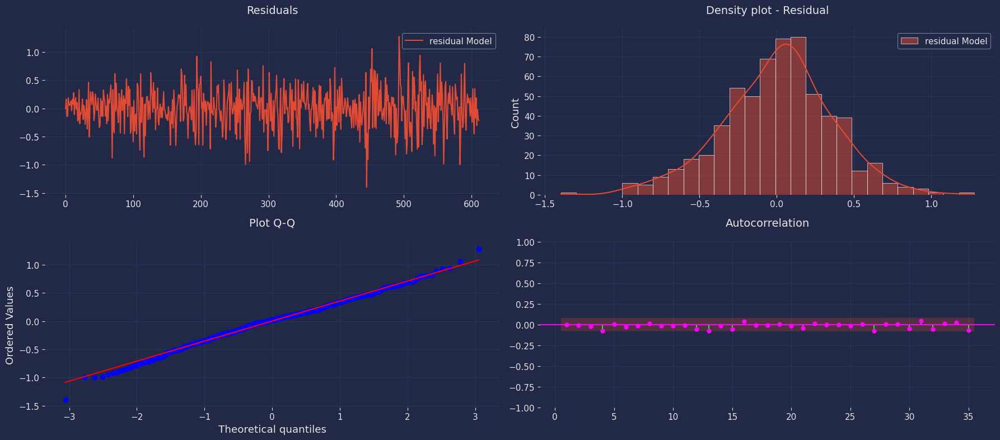

In [919]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(18,8))

residualAR.plot(ax=axs[0,0])
axs[0,0].set_title("Residuals");

sns.histplot(residualAR, ax=axs[0,1], kde=True);
axs[0,1].set_title("Density plot - Residual");

stats.probplot(residualAR["residual Model"], dist="norm", plot=axs[1,0])
axs[1,0].set_title('Plot Q-Q')

plot_acf(residualAR, lags=35, ax=axs[1,1],color="fuchsia", zero=False)
axs[1,1].set_title("Autocorrelation");

plt.tight_layout()
plt.show()

C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\200421432.py:354: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KP = kpss(x, level)


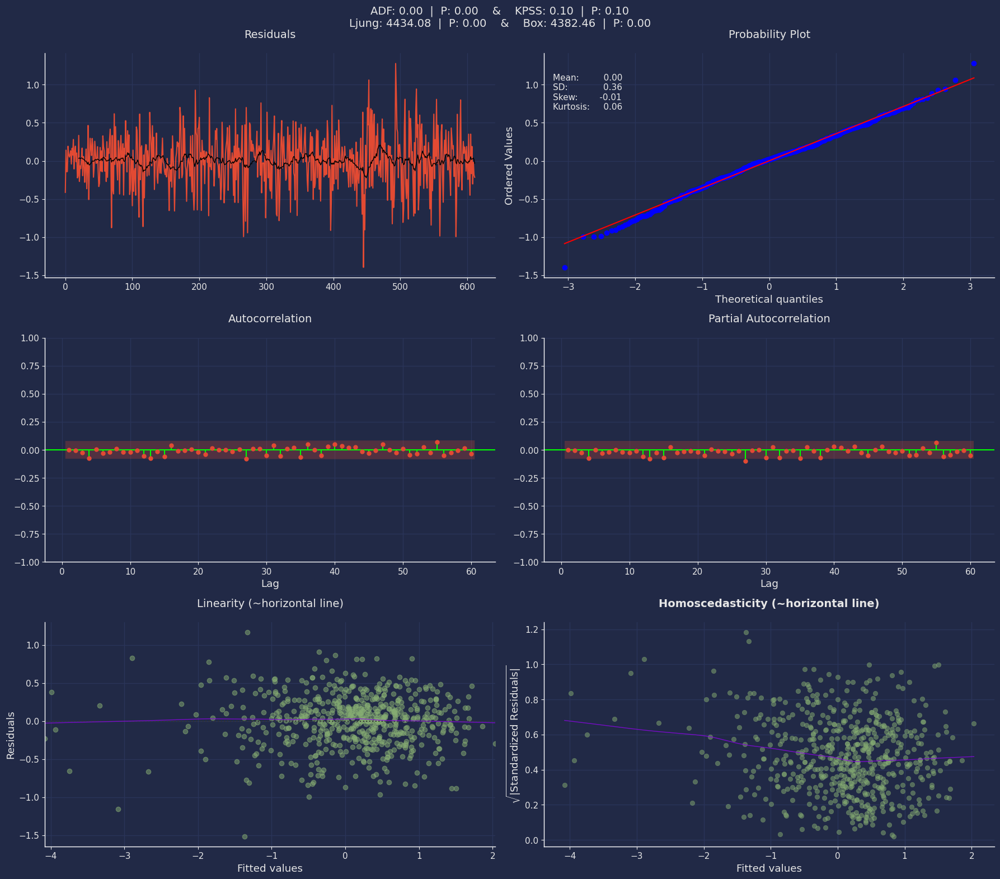

In [920]:
preds = resultAT['fitted']
diagnostic_plots(overall_avg_sample['close'], preds, residualAT['residual Model'])

C:\Users\tekre\AppData\Local\Temp\ipykernel_12444\200421432.py:354: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  KP = kpss(x, level)


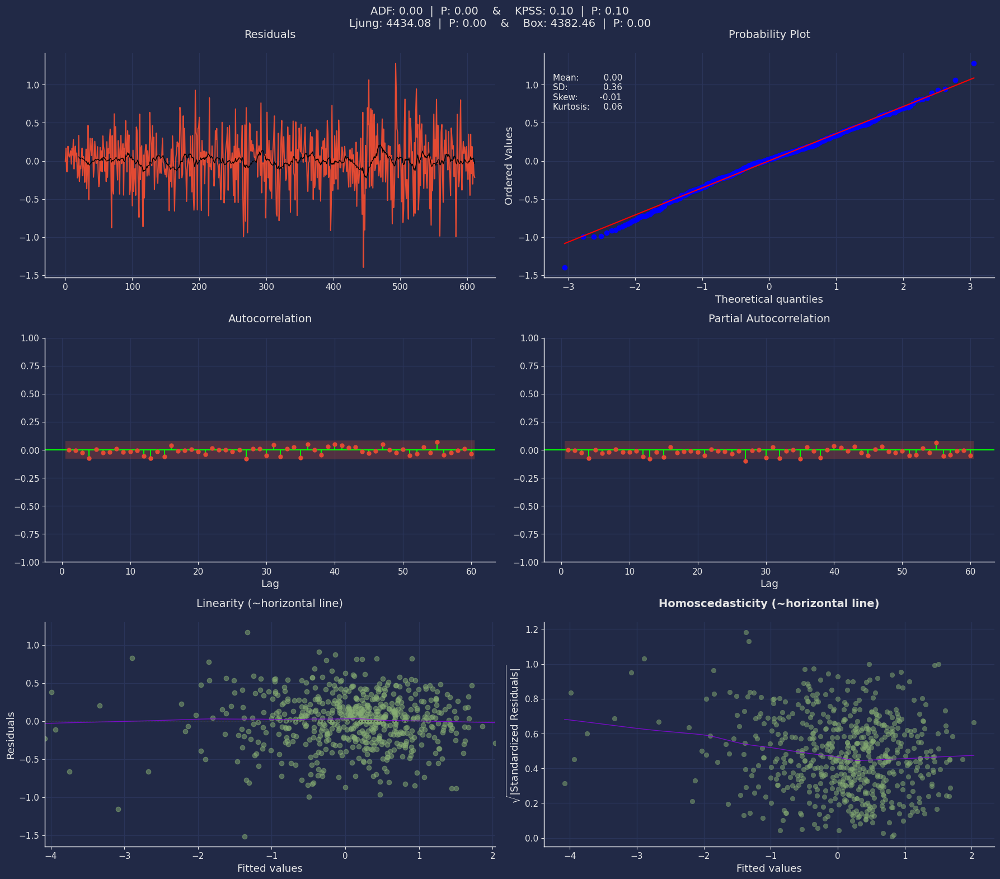

In [921]:
preds = resultETS['fitted']
diagnostic_plots(overall_avg_sample['close'], preds, residualETS['residual Model'])

In [953]:
Y_hatAR = sfAR.forecast(horizon, fitted=True, level=[80, 95])
Y_hatAR.reset_index(inplace=True)
Y_hatAR.tail()

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
240,1,2016-05-11,0.531,-9.587,-6.085,7.147,10.649
241,1,2016-05-12,0.531,-9.608,-6.098,7.160,10.670
242,1,2016-05-13,0.531,-9.629,-6.112,7.174,10.691
243,1,2016-05-16,0.531,-9.650,-6.126,7.188,10.712
244,1,2016-05-17,0.531,-9.670,-6.139,7.201,10.732


In [923]:
Y_hatAR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   unique_id    245 non-null    int64         
 1   ds           245 non-null    datetime64[ns]
 2   Arima        245 non-null    float32       
 3   Arima-lo-95  245 non-null    float32       
 4   Arima-lo-80  245 non-null    float32       
 5   Arima-hi-80  245 non-null    float32       
 6   Arima-hi-95  245 non-null    float32       
dtypes: datetime64[ns](1), float32(5), int64(1)
memory usage: 8.7 KB


In [924]:
Y_hatAT = sfAT.forecast(horizon, fitted=True, level=[80, 95])
Y_hatAT.reset_index(inplace=True)
Y_hatAT.tail()

,unique_id,ds,Theta,Theta-lo-80,Theta-hi-80,Theta-lo-95,Theta-hi-95
240,1,2016-05-11,0.531,-5.793,6.653,-8.663,9.884
241,1,2016-05-12,0.531,-5.771,6.731,-8.734,10.710
242,1,2016-05-13,0.531,-5.717,6.694,-8.954,10.570
243,1,2016-05-16,0.531,-5.752,7.153,-8.754,10.365
244,1,2016-05-17,0.531,-5.622,7.163,-9.038,10.740


In [925]:
Y_hatAT.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   unique_id    245 non-null    int64         
 1   ds           245 non-null    datetime64[ns]
 2   Theta        245 non-null    float32       
 3   Theta-lo-80  245 non-null    float32       
 4   Theta-hi-80  245 non-null    float32       
 5   Theta-lo-95  245 non-null    float32       
 6   Theta-hi-95  245 non-null    float32       
dtypes: datetime64[ns](1), float32(5), int64(1)
memory usage: 8.7 KB


In [926]:
Y_hatETS = sfETS.forecast(horizon, fitted=True, level=[80, 95])
Y_hatETS.reset_index(inplace=True)
Y_hatETS.tail()

,unique_id,ds,ETS,ETS-lo-95,ETS-lo-80,ETS-hi-80,ETS-hi-95
240,1,2016-05-11,0.531,-9.599,-6.093,7.155,10.661
241,1,2016-05-12,0.531,-9.620,-6.106,7.169,10.682
242,1,2016-05-13,0.531,-9.641,-6.120,7.182,10.703
243,1,2016-05-16,0.531,-9.662,-6.134,7.196,10.724
244,1,2016-05-17,0.531,-9.683,-6.147,7.209,10.745


In [927]:
Y_hatETS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 245 entries, 0 to 244
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   unique_id  245 non-null    int64         
 1   ds         245 non-null    datetime64[ns]
 2   ETS        245 non-null    float32       
 3   ETS-lo-95  245 non-null    float32       
 4   ETS-lo-80  245 non-null    float32       
 5   ETS-hi-80  245 non-null    float32       
 6   ETS-hi-95  245 non-null    float32       
dtypes: datetime64[ns](1), float32(5), int64(1)
memory usage: 8.7 KB


In [928]:
valuesAR=sfAR.forecast_fitted_values()
valuesAR.tail()

,ds,y,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
unique_id,,,,,,,
1,2015-06-03,1.218,1.029,0.332,0.573,1.486,1.727
1,2015-06-04,0.903,1.206,0.508,0.750,1.662,1.904
1,2015-06-05,0.903,0.923,0.225,0.467,1.379,1.621
1,2015-06-08,0.720,0.905,0.207,0.448,1.361,1.602
1,2015-06-09,0.517,0.732,0.035,0.276,1.189,1.430


In [929]:
valuesAT=sfAT.forecast_fitted_values()
valuesAT.tail()

,ds,y,Theta,Theta-lo-95,Theta-lo-80,Theta-hi-80,Theta-hi-95
unique_id,,,,,,,
1,2015-06-03,1.218,1.029,0.330,0.572,1.486,1.728
1,2015-06-04,0.903,1.206,0.508,0.749,1.663,1.905
1,2015-06-05,0.903,0.923,0.224,0.466,1.380,1.621
1,2015-06-08,0.720,0.904,0.206,0.448,1.361,1.603
1,2015-06-09,0.517,0.732,0.033,0.275,1.189,1.431


In [930]:
valuesETS=sfETS.forecast_fitted_values()
valuesETS.tail()

,ds,y,ETS,ETS-lo-95,ETS-lo-80,ETS-hi-80,ETS-hi-95
unique_id,,,,,,,
1,2015-06-03,1.218,1.029,0.331,0.573,1.486,1.728
1,2015-06-04,0.903,1.206,0.508,0.749,1.662,1.904
1,2015-06-05,0.903,0.923,0.225,0.467,1.380,1.622
1,2015-06-08,0.720,0.905,0.206,0.448,1.361,1.603
1,2015-06-09,0.517,0.732,0.034,0.276,1.189,1.431


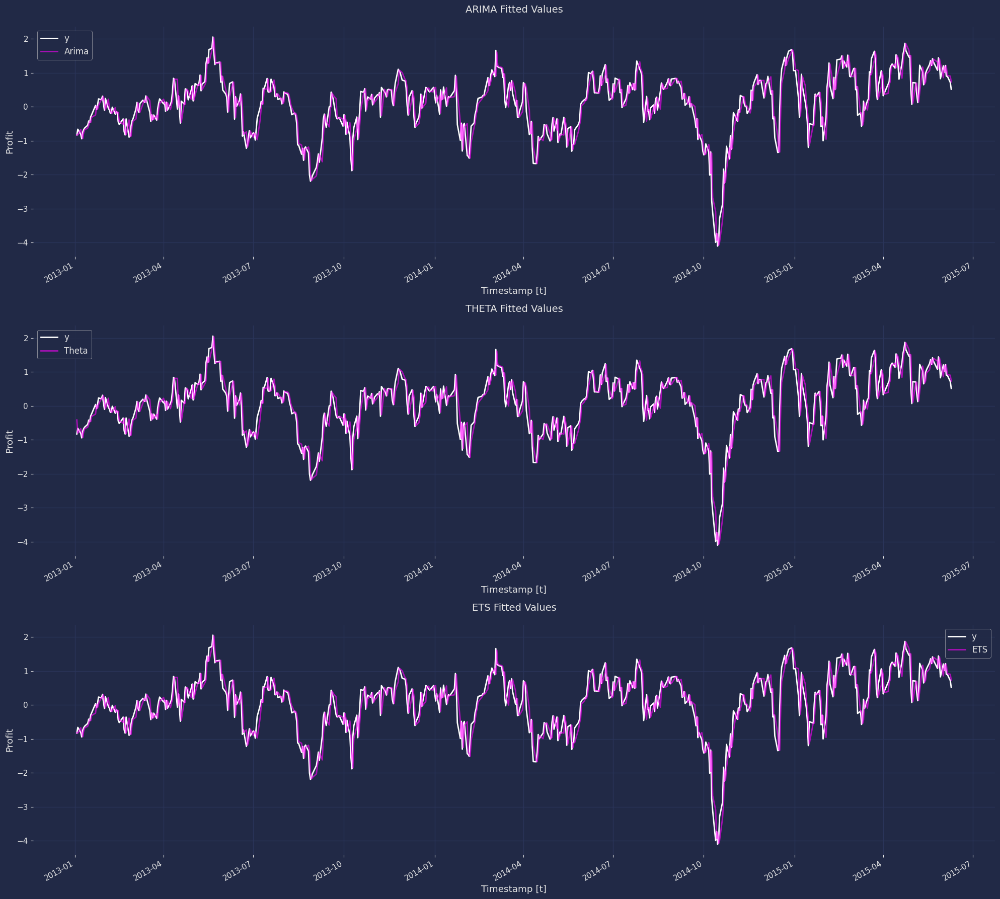

In [971]:
# SEABORN CAN'T USED DATETIME AS INDEX .plot() is applied instead
fig, axs = plt.subplots(3, 1, figsize=(20, 18))
fitted_dfAR = valuesAR[['y', 'Arima']].copy(deep=True)
fitted_dfAR.index = valuesAR['ds']
fitted_dfAR['y'].plot(ax=axs[0], linewidth=2, color='white')
fitted_dfAR["Arima"].plot(ax=axs[0], linewidth=2, color='Fuchsia', alpha=.6)
axs[0].set_title('ARIMA Fitted Values')
axs[0].set_ylabel('Profit')
axs[0].set_xlabel('Timestamp [t]')
axs[0].legend(prop={'size': 12})

fitted_dfAT = valuesAT[['y', 'Theta']].copy(deep=True)
fitted_dfAT.index = valuesAT['ds']
fitted_dfAT['y'].plot(ax=axs[1], linewidth=2, color='white')
fitted_dfAT["Theta"].plot(ax=axs[1], linewidth=2, color='Fuchsia', alpha=.6)
axs[1].set_title('THETA Fitted Values')
axs[1].set_ylabel('Profit')
axs[1].set_xlabel('Timestamp [t]')
axs[1].legend(prop={'size': 12})

fitted_dfETS = valuesETS[['y', 'ETS']].copy(deep=True)
fitted_dfETS.index = valuesETS['ds']
fitted_dfETS['y'].plot(ax=axs[2], linewidth=2, color='white')
fitted_dfETS["ETS"].plot(ax=axs[2], linewidth=2, color='Fuchsia', alpha=.6)
axs[2].set_title('ETS Fitted Values')
axs[2].set_ylabel('Profit')
axs[2].set_xlabel('Timestamp [t]')
axs[2].legend(prop={'size': 12})
plt.tight_layout()
plt.show()

In [932]:
overall_avg_sample['close'].tail()

date
2015-12-24   -0.744
2015-12-28   -0.828
2015-12-29   -0.242
2015-12-30   -0.717
2015-12-31   -1.161
Name: close, dtype: float64

In [933]:
overall_avg_sample['close'].head()

date
2013-01-03   -1.171
2013-01-04   -0.924
2013-01-07   -1.147
2013-01-08   -1.341
2013-01-09   -1.044
Name: close, dtype: float64

In [934]:
Y_hatAR.head(2)

,unique_id,ds,Arima,Arima-lo-95,Arima-lo-80,Arima-hi-80,Arima-hi-95
0,1,2015-06-10,0.531,-0.167,0.075,0.987,1.229
1,1,2015-06-11,0.531,-0.424,-0.093,1.155,1.486


In [935]:
test.head(2)

,unique_id,ds,y
0,1,2015-06-10,0.951
1,1,2015-06-11,1.100


In [936]:
test

,unique_id,ds,y
0,1,2015-06-10,0.951
1,1,2015-06-11,1.100
2,1,2015-06-12,0.965
3,1,2015-06-15,0.927
4,1,2015-06-16,1.229
...,...,...,...
138,1,2015-12-24,-0.537
139,1,2015-12-28,-0.594
140,1,2015-12-29,-0.197
141,1,2015-12-30,-0.518


In [940]:
# creating tables to forecast 2016
overcastAR = Y_hatAR[Y_hatAR['ds']>='2016-01-01']

overcastAT = Y_hatAT[Y_hatAT['ds']>='2016-01-01']

overcastETS = Y_hatETS[Y_hatETS['ds']>='2016-01-01']
overcastETS

,unique_id,ds,ETS,ETS-lo-95,ETS-lo-80,ETS-hi-80,ETS-hi-95
147,1,2016-01-01,0.531,-7.409,-4.661,5.723,8.471
148,1,2016-01-04,0.531,-7.436,-4.678,5.740,8.498
149,1,2016-01-05,0.531,-7.462,-4.695,5.758,8.524
150,1,2016-01-06,0.531,-7.489,-4.713,5.775,8.551
151,1,2016-01-07,0.531,-7.515,-4.730,5.792,8.578
...,...,...,...,...,...,...,...
240,1,2016-05-11,0.531,-9.599,-6.093,7.155,10.661
241,1,2016-05-12,0.531,-9.620,-6.106,7.169,10.682
242,1,2016-05-13,0.531,-9.641,-6.120,7.182,10.703
243,1,2016-05-16,0.531,-9.662,-6.134,7.196,10.724


### Converting closing price to returns

In [160]:
# calculating returns on closing price
pricesOG['PK'] = pricesOG.index
pricesOG['return'] = range(len(pricesOG))
list = []
for sym in pricesOG.symbol.unique():
    stage = pricesOG.loc[pricesOG['symbol']==sym, ['symbol', 'close', 'PK']].copy(deep=True)
    keys = stage['PK'].values
    stage['return'] = np.log(stage['close']/stage['close'].shift(1))
    pricesOG.loc[keys, 'return'] = stage['return'].values

In [161]:
pricesOG.drop('PK', axis=1, inplace=True)
pricesOG.dropna(inplace=True)
pricesOG.isna().sum().sum()

0

In [162]:
pricesOG.describe()

,year,month,date,open,close,low,high,volume (thousands),return
count,364182.000,364182.000,364182,364182.000,364182.000,364182.000,364182.000,364182.000,3.642e+05
mean,2014.003,6.569,2014-07-04 07:13:31.671087360,75.808,75.822,75.094,76.510,4578.297,4.475e-04
min,2013.000,1.000,2013-01-04 00:00:00,3.760,3.720,3.560,3.920,7.900,-6.667e-01
25%,2013.000,4.000,2013-10-03 00:00:00,38.220,38.230,37.860,38.590,1111.800,-7.067e-03
50%,2014.000,7.000,2014-07-05 00:00:00,57.550,57.570,57.020,58.100,2189.400,6.215e-04
75%,2015.000,10.000,2015-04-06 00:00:00,85.850,85.880,85.120,86.600,4541.275,8.245e-03
max,2015.000,12.000,2015-12-31 00:00:00,1475.000,1469.560,1462.750,1476.520,616620.500,4.818e-01
std,0.816,3.423,NaN,83.539,83.520,82.695,84.315,9337.318,1.547e-02


In [163]:
prices_googl['unique_id'] = 1
prices_googl['y'] = np.log(prices_googl['close']/prices_googl['close'].shift(1))
prices_googl.dropna(inplace=True)
train = prices_googl.loc[prices_googl['date']<'2015-06-01', ['date', 'y', 'unique_id']].copy(deep=True)
train.reset_index(drop=True, inplace=True)
train.rename({'date':'ds'}, axis=1, inplace=True)

test = prices_googl.loc[prices_googl['date']>='2015-06-01', ['date', 'y', 'unique_id']].copy(deep=True)
test.reset_index(drop=True, inplace=True)
test.rename({'date':'ds'}, axis=1, inplace=True)
Mplots = pd.concat([train, test], axis=0)

horizon = len(test)

In [164]:
test.head(2)

,ds,y,unique_id
0,2015-06-01,0.007,1
1,2015-06-02,0.009,1


In [165]:
train.tail(2)

,ds,y,unique_id
602,2015-05-28,-1.263e-04,1
603,2015-05-29,-1.612e-02,1


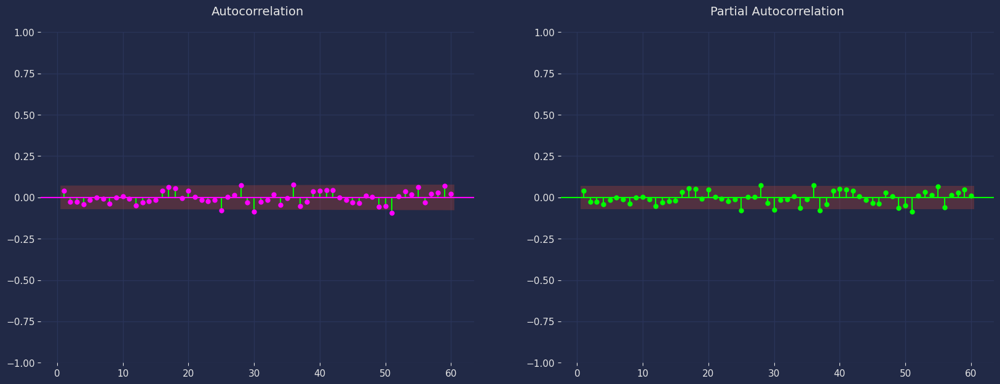

In [166]:
StatsForecast.plot(Mplots)
fig, axs = plt.subplots(nrows=1, ncols=2)

plot_acf(Mplots["y"],  lags=60, ax=axs[0],color="fuchsia", zero=False)
axs[0].set_title("Autocorrelation");

# Grafico
plot_pacf(Mplots["y"],  lags=60, ax=axs[1],color="lime", zero=False)
axs[1].set_title('Partial Autocorrelation')

plt.show();

### Closing Price as Model Set
The log returns have no autocorrelation and can't be called for the model fitting. This is an operation that has to be performed after training on the unscaled values.

In [185]:
df.iloc[246:453]

,y,ds
147585,5.346,2014-06-10
147586,4.705,2014-06-11
147587,-3.482,2014-06-12
147588,-3.049,2014-06-13
147589,-11.705,2014-06-16
...,...,...
147832,5.186,2015-06-03
147833,1.951,2015-06-04
147834,0.181,2015-06-05
147835,-5.447,2015-06-08


In [153]:
unscale = RS_googl_close.inverse_transform(forecast_df.iloc[:, 1:])
forecast_df.index = forecast_df.ds.values
forecast_df.drop('ds', axis=1, inplace=True)
forecast_df2 = forecast_df.copy(deep=True)
for count in range(0, 5):
    forecast_df2.iloc[:, count] = unscale[:, count]
forecast_df2

,"GARCH(3,2)","GARCH(3,2)-lo-95","GARCH(3,2)-lo-80","GARCH(3,2)-hi-80","GARCH(3,2)-hi-95"
2015-06-10,9.330,1.255,4.050,14.610,17.405
2015-06-11,-3.972,-15.776,-11.690,3.746,7.831
2015-06-12,-2.740,-10.587,-7.871,2.391,5.107
2015-06-15,-5.459,-12.527,-10.081,-0.837,1.610
2015-06-16,4.995,-2.869,-0.147,10.138,12.860
...,...,...,...,...,...
2016-05-25,-2.001,-12.289,-8.728,4.725,8.286
2016-05-26,-1.007,-7.867,-5.493,3.478,5.852
2016-05-27,-13.353,-19.348,-17.273,-9.432,-7.357
2016-05-30,16.899,-2.069,4.496,29.302,35.867


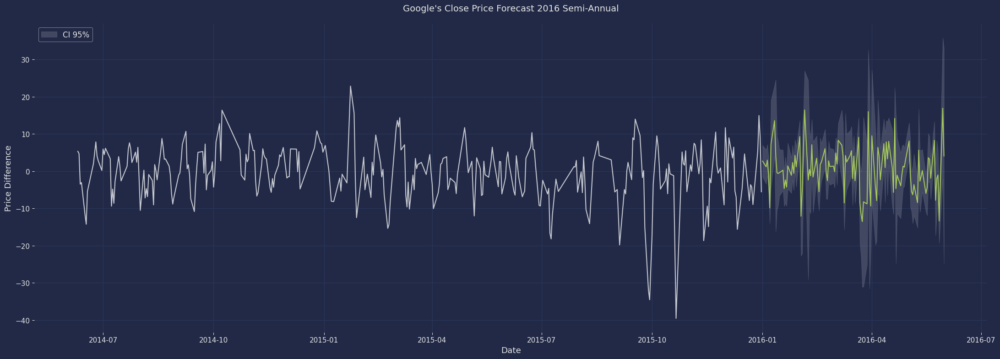

In [223]:
fig, ax = plt.subplots(figsize=(22, 8))
sns.lineplot(df.iloc[246:], y='y', x='ds', ax=ax, color='white', alpha=.75)
sns.lineplot(forecast_df2.iloc[147:], y='GARCH(3,2)', x=forecast_df2.iloc[147:].index, ax=ax, color='#a4c75d')
ax.fill_between(forecast_df2.iloc[147:].index, 
            forecast_df2.iloc[147:]['GARCH(3,2)-lo-95'], 
            forecast_df2.iloc[147:]['GARCH(3,2)-hi-95'],
            alpha=.15,
            color='white',
            label='CI 95%')
ax.set_title('Google\'s Close Price Forecast 2016 Semi-Annual')
ax.set_ylabel('Price Difference')
ax.set_xlabel('Date')
ax.legend(prop={'size': 12}, loc='upper left')
plt.tight_layout()
plt.show()

In [173]:
evaluate_performance([train_GARCH], [Y_hat1], ["GARCH(3,2)"])

,mad,mae,mase,mse,rmse
"GARCH(3,2)",0.89,1.068,1.907,2.188,1.479
